<a href="https://colab.research.google.com/github/dilgc/Clustering_Assignment/blob/main/clustering_assignment_charles_dilger.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Advanced Clustering & Density Methods**
## By Charles Dilger, AIM460

---


# HOW TO RUN

Before running the rest of the code, please run this random seed that will allow for recognizable results.

In [1]:
# Random Seed Setup for Reproducible Clustering Analysis
import numpy as np
import random
import os

# Set global random seed for reproducibility
RANDOM_SEED = 42

def set_all_seeds(seed=RANDOM_SEED):
    """
    Set seeds for all random number generators to ensure reproducible results
    across all libraries and functions used in the clustering assignment.
    """
    # Python built-in random module
    random.seed(seed)

    # NumPy random number generator
    np.random.seed(seed)

    # Set environment variable for Python hash randomization
    os.environ['PYTHONHASHSEED'] = str(seed)

    # If using TensorFlow/Keras (for t-SNE implementations)
    try:
        import tensorflow as tf
        tf.random.set_seed(seed)
    except ImportError:
        pass

    # If using PyTorch
    try:
        import torch
        torch.manual_seed(seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed(seed)
            torch.cuda.manual_seed_all(seed)
    except ImportError:
        pass

    print(f"All random seeds set to: {seed}")

# Call the function to set all seeds
set_all_seeds(RANDOM_SEED)

# Additional function to reset seeds before each major operation
def reset_seeds():
    """Reset all seeds - useful to call before each algorithm run"""
    set_all_seeds(RANDOM_SEED)

# Example usage for specific sklearn functions that need random_state parameter
def get_random_state():
    """Return the random state value to use in sklearn functions"""
    return RANDOM_SEED

# Print confirmation
print("="*60)
print("REPRODUCIBILITY SETUP COMPLETE")
print("="*60)
print(f"Global seed set to: {RANDOM_SEED}")
print("Use get_random_state() for sklearn random_state parameters")
print("Call reset_seeds() before each major algorithm run")
print("="*60)

All random seeds set to: 42
REPRODUCIBILITY SETUP COMPLETE
Global seed set to: 42
Use get_random_state() for sklearn random_state parameters
Call reset_seeds() before each major algorithm run


# Iris Species Dataset


---



First, let's load the Iris Species dataset. This dataset comes from Kaggle (https://www.kaggle.com/datasets/uciml/iris), and is also available straight through sklearn. We will load it through sklearn, and view the number of samples and features, as well as any class labels available.

IRIS DATASET ANALYSIS
DATASET OVERVIEW:
----------------------------------------
Source: UCI Machine Learning Repository (Fisher, 1936)
Description: Measurements of iris flowers from 3 species
Number of samples: 150
Number of features: 4
Features: sepal length (cm), sepal width (cm), petal length (cm), petal width (cm)
Class labels available: Yes (3 species)
Classes: setosa, versicolor, virginica
Class distribution: [50 50 50]

FIRST 5 ROWS:
----------------------------------------
   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                5.1               3.5                1.4               0.2   
1                4.9               3.0                1.4               0.2   
2                4.7               3.2                1.3               0.2   
3                4.6               3.1                1.5               0.2   
4                5.0               3.6                1.4               0.2   

  species  
0  setosa  
1  setosa  
2 

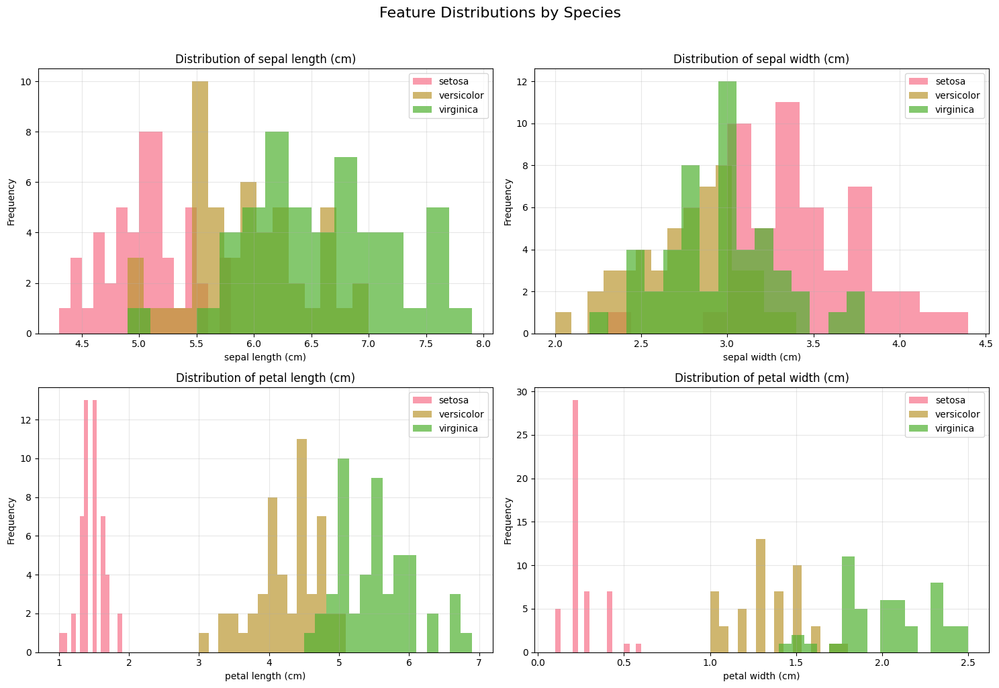


CORRELATION MATRIX:
----------------------------------------
                   sepal length (cm)  sepal width (cm)  petal length (cm)  \
sepal length (cm)              1.000            -0.118              0.872   
sepal width (cm)              -0.118             1.000             -0.428   
petal length (cm)              0.872            -0.428              1.000   
petal width (cm)               0.818            -0.366              0.963   

                   petal width (cm)  
sepal length (cm)             0.818  
sepal width (cm)             -0.366  
petal length (cm)             0.963  
petal width (cm)              1.000  


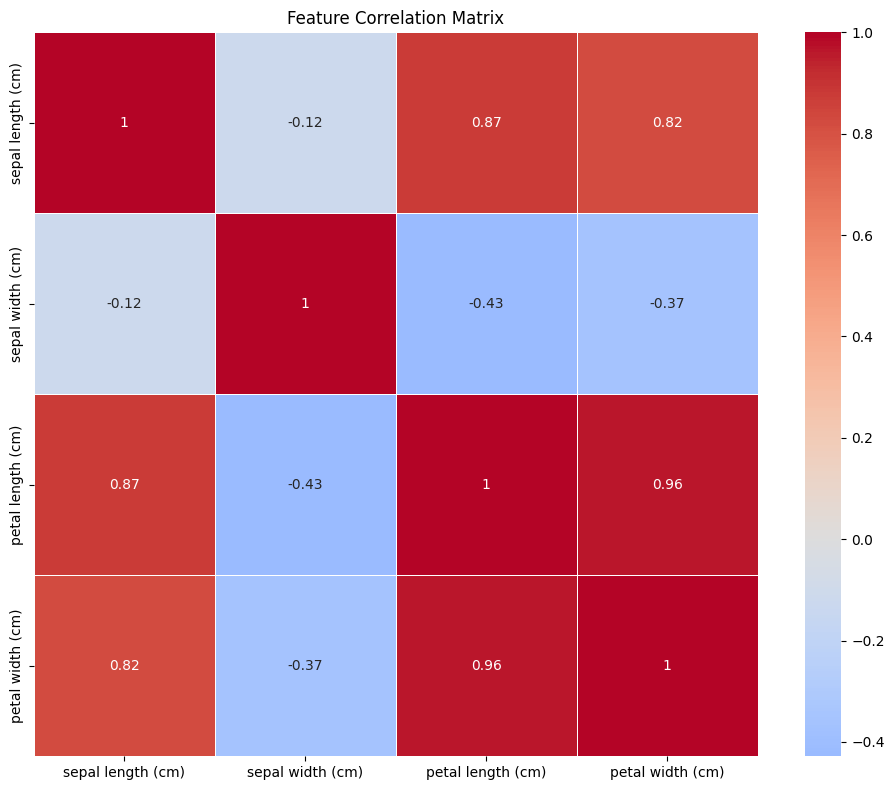

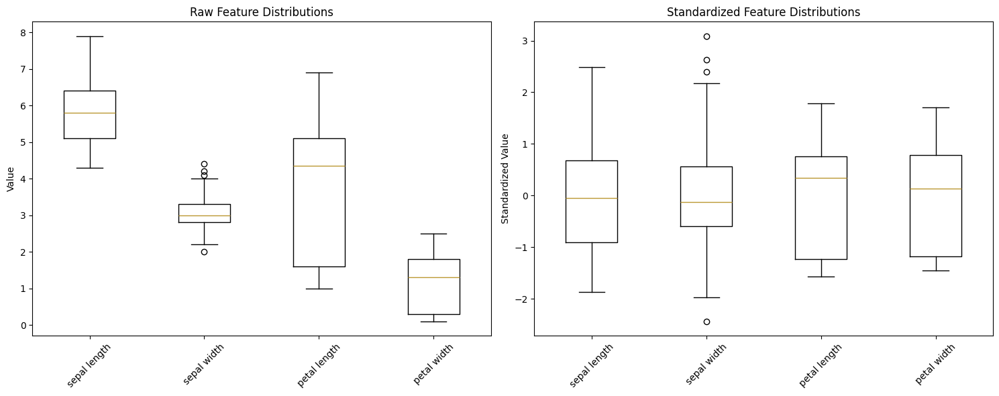


PREPROCESSING RECOMMENDATION:
Different scales detected: True
Different ranges detected: True
Different means detected: True

✅ RECOMMENDATION: STANDARDIZATION IS NEEDED

Reasons:
  • Features have different scales (max ratio: 25.0x)
  • Features have different ranges
  • Features have different means

Standardization will:
  • Ensure all features contribute equally to distance calculations
  • Improve K-means convergence and performance
  • Make clustering results more interpretable

Recommended preprocessing: StandardScaler

STANDARDIZATION IMPACT:
----------------------------------------
Before standardization:
  Feature means: [5.84 3.06 3.76 1.2 ]
  Feature stds:  [0.83 0.43 1.76 0.76]
After standardization:
  Feature means: [-0. -0. -0. -0.]
  Feature stds:  [1. 1. 1. 1.]

Dataset prepared for clustering analysis!
Features will be standardized for optimal clustering performance.

2D VISUALIZATION USING PCA:
----------------------------------------


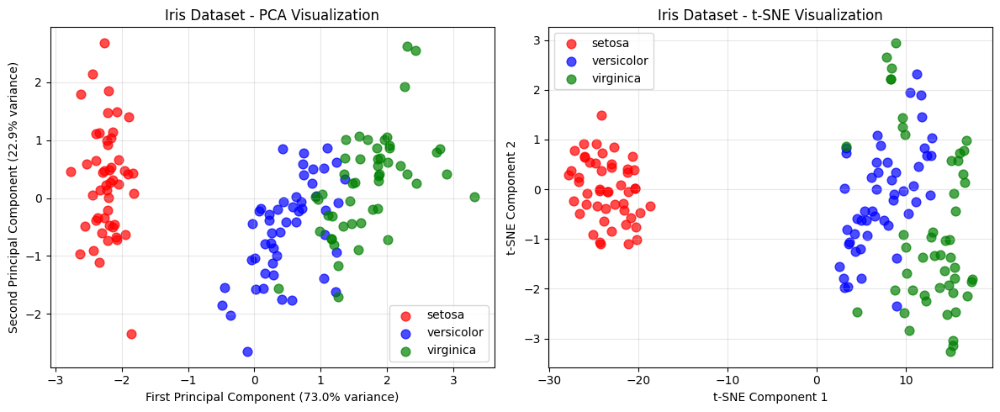


Total explained variance by first 2 PCs: 95.8%


In [2]:
# Iris Dataset Loading and Comprehensive Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set the style for better plots
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("IRIS DATASET ANALYSIS")
print("="*60)

# Load the Iris dataset
iris = load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Create DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['species'] = pd.Categorical.from_codes(y, iris.target_names)

print("DATASET OVERVIEW:")
print("-" * 40)
print(f"Source: UCI Machine Learning Repository (Fisher, 1936)")
print(f"Description: Measurements of iris flowers from 3 species")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")
print(f"Features: {', '.join(feature_names)}")
print(f"Class labels available: Yes ({len(target_names)} species)")
print(f"Classes: {', '.join(target_names)}")
print(f"Class distribution: {np.bincount(y)}")

# Display first few rows
print("\nFIRST 5 ROWS:")
print("-" * 40)
print(df.head())

# Basic statistics
print("\nBASIC STATISTICS:")
print("-" * 40)
print(df.describe())

# Check for missing values
print(f"\nMissing values: {df.isnull().sum().sum()}")

# Feature analysis for scaling/normalization decision
print("\nFEATURE ANALYSIS FOR PREPROCESSING:")
print("-" * 40)

# Calculate statistics for each feature
feature_stats = pd.DataFrame({
    'Feature': feature_names,
    'Min': X.min(axis=0),
    'Max': X.max(axis=0),
    'Range': X.max(axis=0) - X.min(axis=0),
    'Mean': X.mean(axis=0),
    'Std': X.std(axis=0),
    'CV': X.std(axis=0) / X.mean(axis=0)  # Coefficient of Variation
})

print(feature_stats.round(3))

# Scale differences analysis
scale_ratio = X.max(axis=0) / X.min(axis=0)
print(f"\nScale ratios (max/min): {scale_ratio.round(2)}")
print(f"Largest scale difference: {scale_ratio.max():.2f}x")

# Check if features have different units/scales
print(f"\nFeature ranges:")
for i, name in enumerate(feature_names):
    print(f"  {name}: [{X[:, i].min():.1f}, {X[:, i].max():.1f}] (range: {X[:, i].max() - X[:, i].min():.1f})")

# Distribution analysis
print("\nDISTRIBUTION ANALYSIS:")
print("-" * 40)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Feature Distributions by Species', fontsize=16, y=1.02)

for i, feature in enumerate(feature_names):
    ax = axes[i//2, i%2]

    # Plot histograms for each species
    for j, species in enumerate(target_names):
        species_data = X[y == j, i]
        ax.hist(species_data, alpha=0.7, label=species, bins=15)

    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    ax.set_title(f'Distribution of {feature}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Correlation analysis
print("\nCORRELATION MATRIX:")
print("-" * 40)
correlation_matrix = df.iloc[:, :-1].corr()
print(correlation_matrix.round(3))

# Visualization of correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

# Box plots to check for outliers and scale differences
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Raw features
axes[0].boxplot([X[:, i] for i in range(X.shape[1])],
                labels=[name.split(' (')[0] for name in feature_names])
axes[0].set_title('Raw Feature Distributions')
axes[0].set_ylabel('Value')
axes[0].tick_params(axis='x', rotation=45)

# Standardized features for comparison
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
axes[1].boxplot([X_scaled[:, i] for i in range(X_scaled.shape[1])],
                labels=[name.split(' (')[0] for name in feature_names])
axes[1].set_title('Standardized Feature Distributions')
axes[1].set_ylabel('Standardized Value')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# PREPROCESSING RECOMMENDATION
print("\nPREPROCESSING RECOMMENDATION:")
print("="*60)

# Decision criteria
different_scales = scale_ratio.max() > 2.0
different_ranges = (X.max(axis=0) - X.min(axis=0)).max() / (X.max(axis=0) - X.min(axis=0)).min() > 2.0
different_means = X.mean(axis=0).max() / X.mean(axis=0).min() > 2.0

print(f"Different scales detected: {different_scales}")
print(f"Different ranges detected: {different_ranges}")
print(f"Different means detected: {different_means}")

if different_scales or different_ranges or different_means:
    print("\n✅ RECOMMENDATION: STANDARDIZATION IS NEEDED")
    print("\nReasons:")
    if different_scales:
        print(f"  • Features have different scales (max ratio: {scale_ratio.max():.1f}x)")
    if different_ranges:
        print(f"  • Features have different ranges")
    if different_means:
        print(f"  • Features have different means")

    print("\nStandardization will:")
    print("  • Ensure all features contribute equally to distance calculations")
    print("  • Improve K-means convergence and performance")
    print("  • Make clustering results more interpretable")

    recommendation = "StandardScaler"
else:
    print("\n❌ RECOMMENDATION: STANDARDIZATION NOT CRITICAL")
    recommendation = "No scaling needed"

print(f"\nRecommended preprocessing: {recommendation}")

# Show the effect of standardization
print(f"\nSTANDARDIZATION IMPACT:")
print("-" * 40)
print("Before standardization:")
print(f"  Feature means: {X.mean(axis=0).round(2)}")
print(f"  Feature stds:  {X.std(axis=0).round(2)}")

X_standardized = StandardScaler().fit_transform(X)
print("After standardization:")
print(f"  Feature means: {X_standardized.mean(axis=0).round(2)}")
print(f"  Feature stds:  {X_standardized.std(axis=0).round(2)}")

# Save preprocessed data for later use
print(f"\nDataset prepared for clustering analysis!")
print(f"Features will be standardized for optimal clustering performance.")

# Create 2D visualization using PCA
print(f"\n2D VISUALIZATION USING PCA:")
print("-" * 40)

# Set random state for reproducibility
RANDOM_STATE = 42

pca = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_standardized)

plt.figure(figsize=(12, 5))

# PCA visualization
plt.subplot(1, 2, 1)
colors = ['red', 'blue', 'green']
for i, (species, color) in enumerate(zip(target_names, colors)):
    mask = y == i
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1],
               c=color, label=species, alpha=0.7, s=60)

plt.xlabel(f'First Principal Component ({pca.explained_variance_ratio_[0]:.1%} variance)')
plt.ylabel(f'Second Principal Component ({pca.explained_variance_ratio_[1]:.1%} variance)')
plt.title('Iris Dataset - PCA Visualization')
plt.legend()
plt.grid(True, alpha=0.3)

# t-SNE visualization
tsne = TSNE(n_components=2, random_state=RANDOM_STATE, perplexity=30)
X_tsne = tsne.fit_transform(X_standardized)

plt.subplot(1, 2, 2)
for i, (species, color) in enumerate(zip(target_names, colors)):
    mask = y == i
    plt.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
               c=color, label=species, alpha=0.7, s=60)

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('Iris Dataset - t-SNE Visualization')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nTotal explained variance by first 2 PCs: {pca.explained_variance_ratio_.sum():.1%}")
print("="*60)

Our dataset has 4 features: sepal length (cm), sepal width (cm), petal length (cm), and petal width (cm)

Three class labels are available: setosa, versicolor, and virginica. These are the classification of 3 different species.

Looking at the scatterplots, it seems like setosa will be the easiest to classify, and versicolor and virginica have some overlap but seem somewhat distinguishable.

Our dataset is mostly clean. However, there is the problem of scaling versus normalizatation. Our largest ratio was petal width max/min, with a ratio of 25x. These ranges are wildly varying based on feature. K-means is distance-based and scale-sensitive, so we want to use StandardScaler here. Let's get straight to that.

IRIS DATASET STANDARDIZATION
ORIGINAL DATA STATISTICS:
----------------------------------------
Feature statistics (before standardization):
             Feature   Mean    Std  Min  Max  Range
0  sepal length (cm)  5.843  0.825  4.3  7.9    3.6
1   sepal width (cm)  3.057  0.434  2.0  4.4    2.4
2  petal length (cm)  3.758  1.759  1.0  6.9    5.9
3   petal width (cm)  1.199  0.760  0.1  2.5    2.4

APPLYING STANDARDSCALER...
----------------------------------------
STANDARDIZED DATA STATISTICS:
----------------------------------------
Feature statistics (after standardization):
             Feature  Mean  Std    Min    Max  Range
0  sepal length (cm)  -0.0  1.0 -1.870  2.492  4.362
1   sepal width (cm)  -0.0  1.0 -2.434  3.091  5.525
2  petal length (cm)  -0.0  1.0 -1.568  1.786  3.353
3   petal width (cm)  -0.0  1.0 -1.447  1.712  3.159

SCALING PARAMETERS:
----------------------------------------
             Feature  Original_Mean  Original_Std    Scaling_Formula
0  sepal length (cm

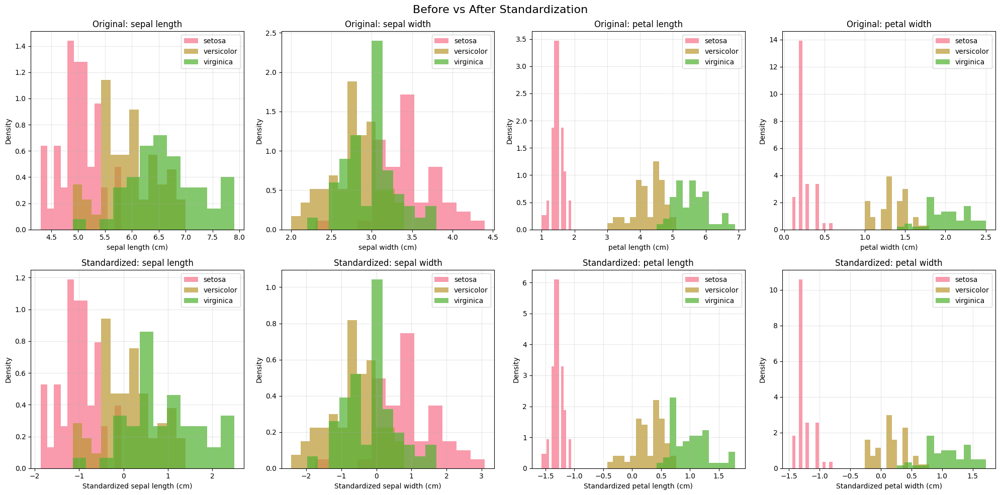

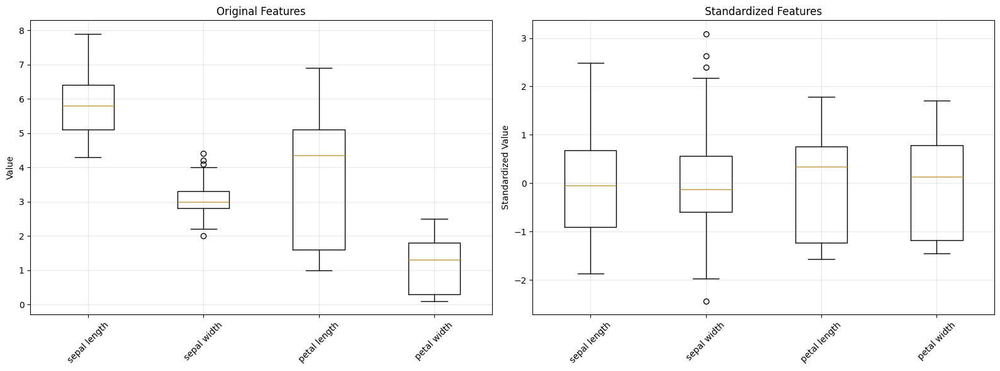


SAMPLE TRANSFORMATIONS:
----------------------------------------
   Sample_Index  Original_Sepal_Length  Scaled_Sepal_Length  \
0             0                    5.1               -0.901   
1             1                    4.9               -1.143   
2             2                    4.7               -1.385   
3             3                    4.6               -1.507   
4             4                    5.0               -1.022   

   Original_Petal_Width  Scaled_Petal_Width  
0                   0.2              -1.315  
1                   0.2              -1.315  
2                   0.2              -1.315  
3                   0.2              -1.315  
4                   0.2              -1.315  

2D VISUALIZATION COMPARISON (PCA):
----------------------------------------


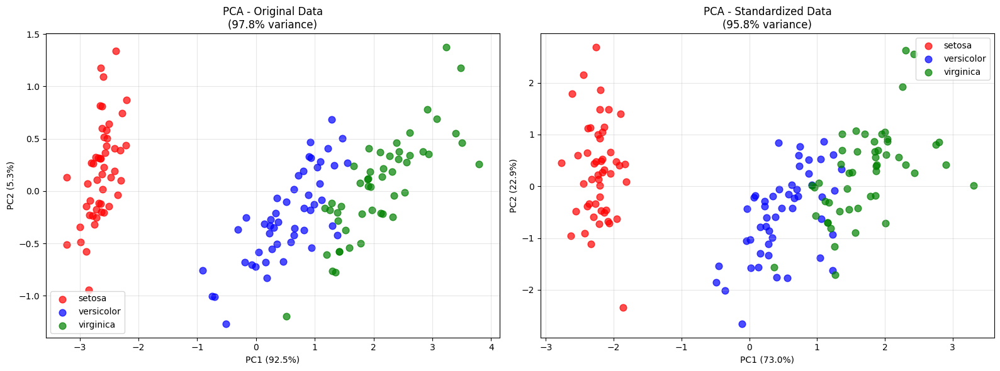


PCA VARIANCE EXPLANATION COMPARISON:
----------------------------------------
  Component  Original_Data  Standardized_Data
0       PC1          0.925              0.730
1       PC2          0.053              0.229
2     Total          0.978              0.958

STANDARDIZED DATA READY FOR CLUSTERING:
----------------------------------------
Shape: (150, 4)
Features are now normalized with mean=0, std=1
All features contribute equally to distance calculations
Data is ready for K-means and other clustering algorithms!

VARIABLES READY FOR CLUSTERING:
- X_original: Original feature matrix
- X_scaled: Standardized feature matrix
- y: True class labels
- feature_names: Feature column names
- target_names: Species names
- scaler: Fitted StandardScaler object


In [3]:
# Apply StandardScaler to Iris Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("IRIS DATASET STANDARDIZATION")
print("="*60)

# Load the Iris dataset
iris = load_iris()
X_original = iris.data
y = iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Create DataFrame for original data
df_original = pd.DataFrame(X_original, columns=feature_names)
df_original['species'] = pd.Categorical.from_codes(y, iris.target_names)

print("ORIGINAL DATA STATISTICS:")
print("-" * 40)
print("Feature statistics (before standardization):")
original_stats = pd.DataFrame({
    'Feature': feature_names,
    'Mean': X_original.mean(axis=0),
    'Std': X_original.std(axis=0),
    'Min': X_original.min(axis=0),
    'Max': X_original.max(axis=0),
    'Range': X_original.max(axis=0) - X_original.min(axis=0)
})
print(original_stats.round(3))

# Apply StandardScaler
print(f"\nAPPLYING STANDARDSCALER...")
print("-" * 40)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Create DataFrame for scaled data
df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
df_scaled['species'] = pd.Categorical.from_codes(y, iris.target_names)

print("STANDARDIZED DATA STATISTICS:")
print("-" * 40)
print("Feature statistics (after standardization):")
scaled_stats = pd.DataFrame({
    'Feature': feature_names,
    'Mean': X_scaled.mean(axis=0),
    'Std': X_scaled.std(axis=0),
    'Min': X_scaled.min(axis=0),
    'Max': X_scaled.max(axis=0),
    'Range': X_scaled.max(axis=0) - X_scaled.min(axis=0)
})
print(scaled_stats.round(3))

# Show the scaling parameters
print(f"\nSCALING PARAMETERS:")
print("-" * 40)
scaling_params = pd.DataFrame({
    'Feature': feature_names,
    'Original_Mean': scaler.mean_,
    'Original_Std': scaler.scale_,
    'Scaling_Formula': ['(x - {:.2f}) / {:.2f}'.format(m, s) for m, s in zip(scaler.mean_, scaler.scale_)]
})
print(scaling_params.round(3))

# Visualize the transformation
print(f"\nVISUALIZING THE TRANSFORMATION:")
print("-" * 40)

# Create comparison plots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Before vs After Standardization', fontsize=16, y=0.98)

# Plot original distributions
for i, feature in enumerate(feature_names):
    ax = axes[0, i]

    # Plot histograms for each species
    for j, species in enumerate(target_names):
        species_data = X_original[y == j, i]
        ax.hist(species_data, alpha=0.7, label=species, bins=12, density=True)

    ax.set_xlabel(feature)
    ax.set_ylabel('Density')
    ax.set_title(f'Original: {feature.split(" (")[0]}')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Plot standardized distributions
for i, feature in enumerate(feature_names):
    ax = axes[1, i]

    # Plot histograms for each species
    for j, species in enumerate(target_names):
        species_data = X_scaled[y == j, i]
        ax.hist(species_data, alpha=0.7, label=species, bins=12, density=True)

    ax.set_xlabel(f'Standardized {feature}')
    ax.set_ylabel('Density')
    ax.set_title(f'Standardized: {feature.split(" (")[0]}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Box plot comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Original data box plots
axes[0].boxplot([X_original[:, i] for i in range(X_original.shape[1])],
                labels=[name.split(' (')[0] for name in feature_names])
axes[0].set_title('Original Features')
axes[0].set_ylabel('Value')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True, alpha=0.3)

# Standardized data box plots
axes[1].boxplot([X_scaled[:, i] for i in range(X_scaled.shape[1])],
                labels=[name.split(' (')[0] for name in feature_names])
axes[1].set_title('Standardized Features')
axes[1].set_ylabel('Standardized Value')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Show sample transformations
print(f"\nSAMPLE TRANSFORMATIONS:")
print("-" * 40)
sample_comparison = pd.DataFrame({
    'Sample_Index': range(5),
    'Original_Sepal_Length': X_original[:5, 0],
    'Scaled_Sepal_Length': X_scaled[:5, 0],
    'Original_Petal_Width': X_original[:5, 3],
    'Scaled_Petal_Width': X_scaled[:5, 3]
})
print(sample_comparison.round(3))

# PCA visualization comparison
print(f"\n2D VISUALIZATION COMPARISON (PCA):")
print("-" * 40)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA on original data
pca_original = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_original = pca_original.fit_transform(X_original)

axes[0].set_title(f'PCA - Original Data\n({pca_original.explained_variance_ratio_.sum():.1%} variance)')
colors = ['red', 'blue', 'green']
for i, (species, color) in enumerate(zip(target_names, colors)):
    mask = y == i
    axes[0].scatter(X_pca_original[mask, 0], X_pca_original[mask, 1],
                   c=color, label=species, alpha=0.7, s=60)
axes[0].set_xlabel(f'PC1 ({pca_original.explained_variance_ratio_[0]:.1%})')
axes[0].set_ylabel(f'PC2 ({pca_original.explained_variance_ratio_[1]:.1%})')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# PCA on standardized data
pca_scaled = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_scaled = pca_scaled.fit_transform(X_scaled)

axes[1].set_title(f'PCA - Standardized Data\n({pca_scaled.explained_variance_ratio_.sum():.1%} variance)')
for i, (species, color) in enumerate(zip(target_names, colors)):
    mask = y == i
    axes[1].scatter(X_pca_scaled[mask, 0], X_pca_scaled[mask, 1],
                   c=color, label=species, alpha=0.7, s=60)
axes[1].set_xlabel(f'PC1 ({pca_scaled.explained_variance_ratio_[0]:.1%})')
axes[1].set_ylabel(f'PC2 ({pca_scaled.explained_variance_ratio_[1]:.1%})')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nPCA VARIANCE EXPLANATION COMPARISON:")
print("-" * 40)
pca_comparison = pd.DataFrame({
    'Component': ['PC1', 'PC2', 'Total'],
    'Original_Data': [pca_original.explained_variance_ratio_[0],
                      pca_original.explained_variance_ratio_[1],
                      pca_original.explained_variance_ratio_.sum()],
    'Standardized_Data': [pca_scaled.explained_variance_ratio_[0],
                          pca_scaled.explained_variance_ratio_[1],
                          pca_scaled.explained_variance_ratio_.sum()]
})
print(pca_comparison.round(3))

# Store the standardized data for clustering
print(f"\nSTANDARDIZED DATA READY FOR CLUSTERING:")
print("-" * 40)
print(f"Shape: {X_scaled.shape}")
print(f"Features are now normalized with mean=0, std=1")
print(f"All features contribute equally to distance calculations")
print(f"Data is ready for K-means and other clustering algorithms!")

# Save key variables for next steps
print(f"\nVARIABLES READY FOR CLUSTERING:")
print("- X_original: Original feature matrix")
print("- X_scaled: Standardized feature matrix")
print("- y: True class labels")
print("- feature_names: Feature column names")
print("- target_names: Species names")
print("- scaler: Fitted StandardScaler object")

print("="*60)

Great standardization results. Our data maintains its integrity throughout the transformation, however our features are now scaled. It looks great.

# Wine Dataset


---



We will go through the same process with our Wine dataset. Once again, this dataset is available on Kaggle (https://www.kaggle.com/datasets/yasserh/wine-quality-dataset) or straight through sklearn. We will be loading from sklearn, and collecting and interpreting the same data we did with the Iris dataset.

WINE DATASET ANALYSIS
DATASET OVERVIEW:
----------------------------------------
Source: UCI Machine Learning Repository (Wine Recognition Dataset)
Description: Chemical analysis of wines from 3 different cultivars in Italy
Number of samples: 178
Number of features: 13
Class labels available: Yes (3 cultivars)
Classes: class_0, class_1, class_2
Class distribution: [59 71 48]

FEATURES (13 chemical properties):
----------------------------------------
 1. alcohol
 2. malic_acid
 3. ash
 4. alcalinity_of_ash
 5. magnesium
 6. total_phenols
 7. flavanoids
 8. nonflavanoid_phenols
 9. proanthocyanins
10. color_intensity
11. hue
12. od280/od315_of_diluted_wines
13. proline

FIRST 5 ROWS:
----------------------------------------
   alcohol  malic_acid   ash  alcalinity_of_ash  magnesium  total_phenols  \
0    14.23        1.71  2.43               15.6      127.0           2.80   
1    13.20        1.78  2.14               11.2      100.0           2.65   
2    13.16        2.36  2.67        

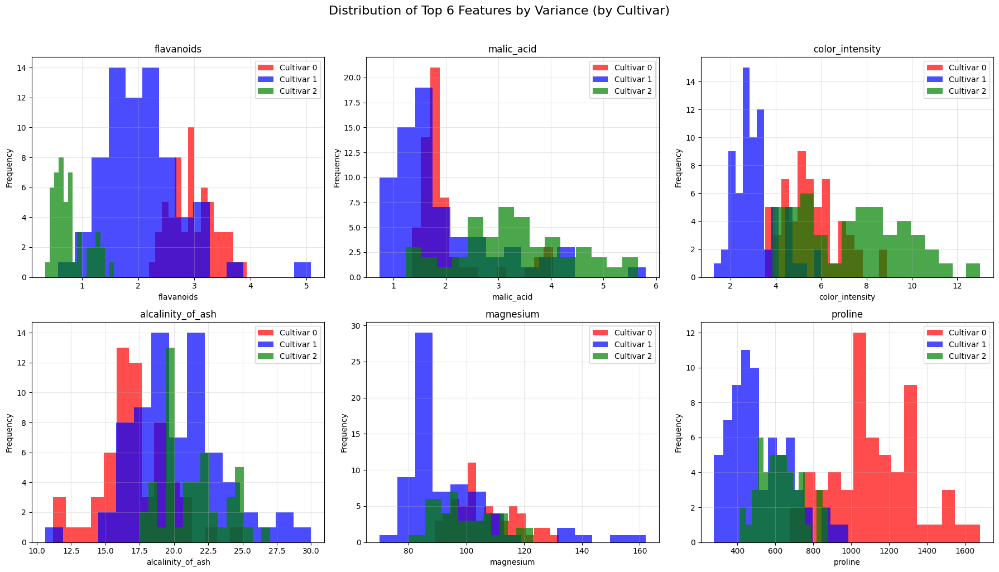


CORRELATION ANALYSIS (Top correlations):
----------------------------------------
Strongest correlations (top 10):
 1. total_phenols        vs flavanoids          :  0.865
 2. flavanoids           vs od280/od315_of_dilut:  0.787
 3. total_phenols        vs od280/od315_of_dilut:  0.700
 4. flavanoids           vs proanthocyanins     :  0.653
 5. alcohol              vs proline             :  0.644
 6. total_phenols        vs proanthocyanins     :  0.612
 7. hue                  vs od280/od315_of_dilut:  0.565
 8. malic_acid           vs hue                 : -0.561
 9. alcohol              vs color_intensity     :  0.546
10. flavanoids           vs hue                 :  0.543


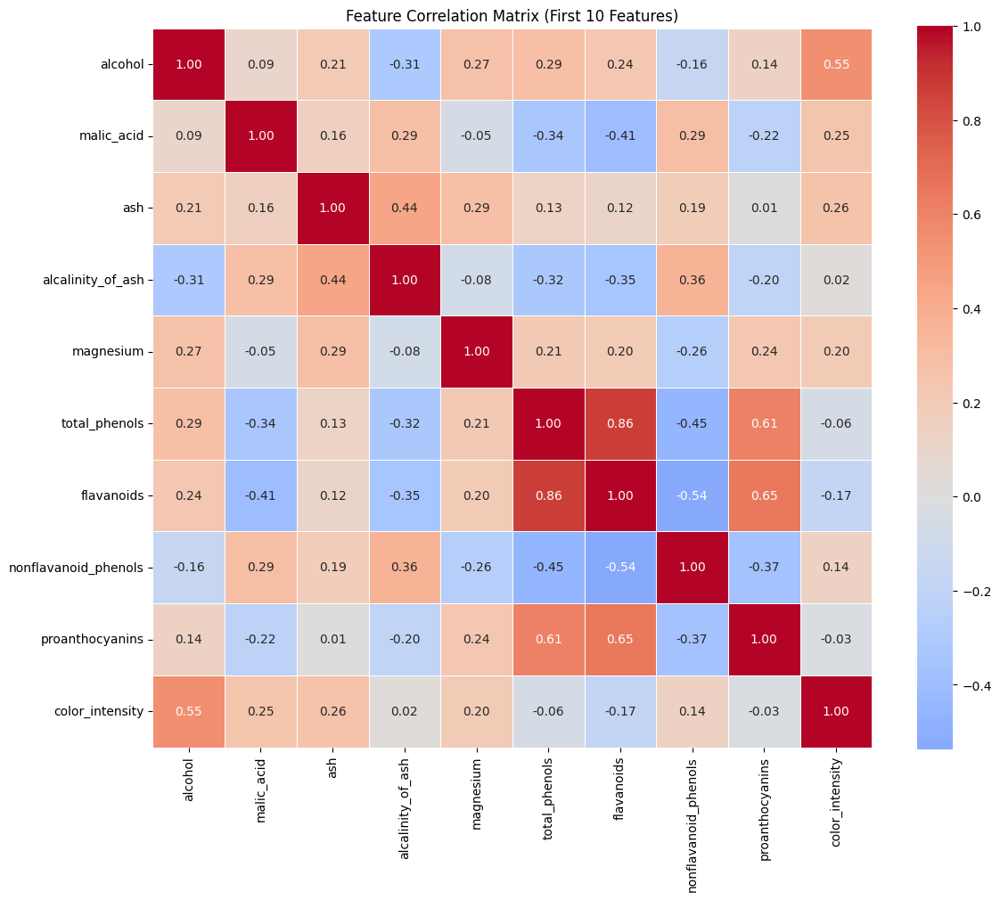


SCALE DIFFERENCES VISUALIZATION:
----------------------------------------


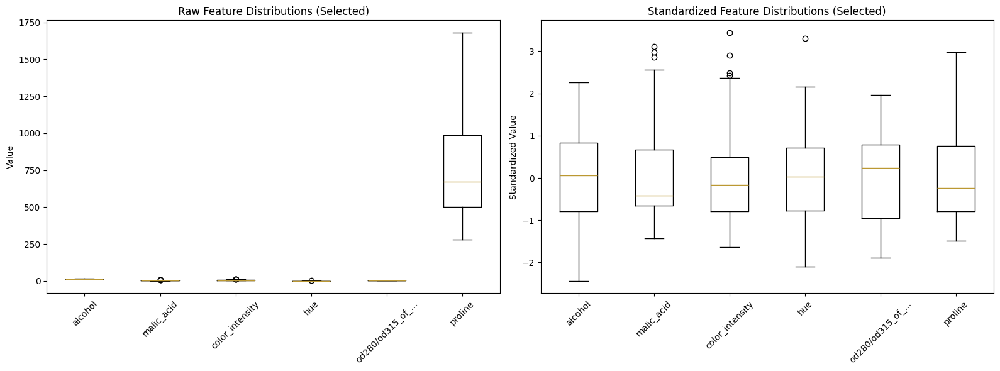


PREPROCESSING RECOMMENDATION:
Different scales detected: True (max ratio: 14.9x)
Different ranges detected: True
Different magnitudes detected: True
Skewed distributions detected: False (0/13 features)

✅ RECOMMENDATION: STANDARDIZATION IS ESSENTIAL

Reasons:
  • Extreme scale differences (max ratio: 14.9x)
  • Features have vastly different ranges
  • Features span different orders of magnitude

Wine dataset characteristics:
  • Chemical measurements with different units (mg/L, %, etc.)
  • Some features: alcohol (%), others: phenols (mg/L)
  • Standardization critical for fair feature contribution

Recommended preprocessing: StandardScaler (essential)

2D VISUALIZATION USING PCA AND t-SNE:
----------------------------------------


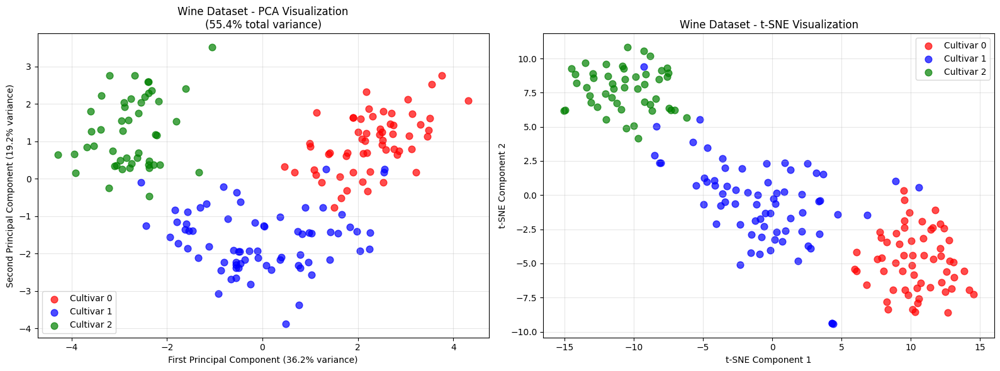


CLUSTER SHAPE ANALYSIS:
----------------------------------------
PCA insights:
  • Total variance explained by first 2 PCs: 55.4%
  • PC1 explains 36.2% of variance
  • PC2 explains 19.2% of variance

Cluster separation (PCA space):
  • Cultivar 0 vs Cultivar 1: distance = 3.49
  • Cultivar 0 vs Cultivar 2: distance = 5.04
  • Cultivar 1 vs Cultivar 2: distance = 3.96

Expected clustering characteristics:
  • Wine has SKEWED feature distributions
  • Chemical measurements create non-spherical clusters
  • May challenge K-means assumptions
  • Good candidate for density-based clustering

Dataset prepared for clustering analysis!


In [4]:
# Wine Dataset Loading and Comprehensive Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("WINE DATASET ANALYSIS")
print("="*60)

# Load the Wine dataset
wine = load_wine()
X = wine.data
y = wine.target
feature_names = wine.feature_names
target_names = wine.target_names

# Create DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['cultivar'] = pd.Categorical.from_codes(y, wine.target_names)

print("DATASET OVERVIEW:")
print("-" * 40)
print(f"Source: UCI Machine Learning Repository (Wine Recognition Dataset)")
print(f"Description: Chemical analysis of wines from 3 different cultivars in Italy")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")
print(f"Class labels available: Yes ({len(target_names)} cultivars)")
print(f"Classes: {', '.join([f'class_{i}' for i in range(len(target_names))])}")
print(f"Class distribution: {np.bincount(y)}")

# Display feature names
print(f"\nFEATURES ({len(feature_names)} chemical properties):")
print("-" * 40)
for i, feature in enumerate(feature_names, 1):
    print(f"{i:2d}. {feature}")

# Display first few rows
print(f"\nFIRST 5 ROWS:")
print("-" * 40)
print(df.head())

# Basic statistics
print(f"\nBASIC STATISTICS:")
print("-" * 40)
print(df.describe())

# Check for missing values
print(f"\nMissing values: {df.isnull().sum().sum()}")

# Feature analysis for scaling/normalization decision
print(f"\nFEATURE ANALYSIS FOR PREPROCESSING:")
print("-" * 40)

# Calculate statistics for each feature (show first 10 for readability)
feature_stats = pd.DataFrame({
    'Feature': feature_names,
    'Min': X.min(axis=0),
    'Max': X.max(axis=0),
    'Range': X.max(axis=0) - X.min(axis=0),
    'Mean': X.mean(axis=0),
    'Std': X.std(axis=0),
    'CV': X.std(axis=0) / X.mean(axis=0)  # Coefficient of Variation
})

print("Feature statistics (first 10 features):")
print(feature_stats.head(10).round(3))

# Scale differences analysis
scale_ratio = X.max(axis=0) / X.min(axis=0)
print(f"\nScale analysis:")
print(f"Scale ratios (max/min) - Top 5 largest:")
scale_analysis = pd.DataFrame({
    'Feature': feature_names,
    'Scale_Ratio': scale_ratio
}).sort_values('Scale_Ratio', ascending=False)
print(scale_analysis.head().round(2))
print(f"Largest scale difference: {scale_ratio.max():.1f}x")

# Check extreme features
print(f"\nFeatures with extreme ranges:")
extreme_features = feature_stats.nlargest(5, 'Range')[['Feature', 'Range', 'Mean', 'Std']]
print(extreme_features.round(2))

# Distribution analysis - show key features
print(f"\nDISTRIBUTION ANALYSIS (Top 6 Features by Variance):")
print("-" * 40)

# Select top 6 features by variance for visualization
feature_variances = X.var(axis=0)
top_variance_indices = np.argsort(feature_variances)[-6:]
selected_features = [feature_names[i] for i in top_variance_indices]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distribution of Top 6 Features by Variance (by Cultivar)', fontsize=16, y=1.02)

for idx, feature_idx in enumerate(top_variance_indices):
    ax = axes[idx//3, idx%3]
    feature = feature_names[feature_idx]

    # Plot histograms for each cultivar
    colors = ['red', 'blue', 'green']
    for j in range(len(target_names)):
        cultivar_data = X[y == j, feature_idx]
        ax.hist(cultivar_data, alpha=0.7, label=f'Cultivar {j}', bins=15, color=colors[j])

    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    ax.set_title(f'{feature}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Correlation analysis (show subset for readability)
print(f"\nCORRELATION ANALYSIS (Top correlations):")
print("-" * 40)
correlation_matrix = df.iloc[:, :-1].corr()

# Find strongest correlations
corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], abs(corr_value), corr_value))

# Sort by absolute correlation and show top 10
corr_pairs.sort(key=lambda x: x[2], reverse=True)
print("Strongest correlations (top 10):")
for i, (feat1, feat2, abs_corr, corr) in enumerate(corr_pairs[:10], 1):
    print(f"{i:2d}. {feat1[:20]:<20} vs {feat2[:20]:<20}: {corr:>6.3f}")

# Visualization of correlation matrix (subset)
plt.figure(figsize=(12, 10))
# Show correlation for first 10 features for readability
subset_corr = correlation_matrix.iloc[:10, :10]
sns.heatmap(subset_corr, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5, fmt='.2f')
plt.title('Feature Correlation Matrix (First 10 Features)')
plt.tight_layout()
plt.show()

# Box plots to check for outliers and scale differences
print(f"\nSCALE DIFFERENCES VISUALIZATION:")
print("-" * 40)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Raw features (subset for readability)
selected_indices = [0, 1, 9, 10, 11, 12]  # Mix of different scale features
selected_names = [feature_names[i] for i in selected_indices]
axes[0].boxplot([X[:, i] for i in selected_indices],
                labels=[name[:15] + '...' if len(name) > 15 else name for name in selected_names])
axes[0].set_title('Raw Feature Distributions (Selected)')
axes[0].set_ylabel('Value')
axes[0].tick_params(axis='x', rotation=45)

# Standardized features for comparison
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
axes[1].boxplot([X_scaled[:, i] for i in selected_indices],
                labels=[name[:15] + '...' if len(name) > 15 else name for name in selected_names])
axes[1].set_title('Standardized Feature Distributions (Selected)')
axes[1].set_ylabel('Standardized Value')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# PREPROCESSING RECOMMENDATION
print(f"\nPREPROCESSING RECOMMENDATION:")
print("="*60)

# Decision criteria for wine dataset
different_scales = scale_ratio.max() > 10.0
different_ranges = (X.max(axis=0) - X.min(axis=0)).max() / (X.max(axis=0) - X.min(axis=0)).min() > 10.0
different_magnitudes = X.max(axis=0).max() / X.min(axis=0).min() > 100.0
skewed_features = (feature_stats['CV'] > 0.5).sum() > len(feature_names) * 0.3

print(f"Different scales detected: {different_scales} (max ratio: {scale_ratio.max():.1f}x)")
print(f"Different ranges detected: {different_ranges}")
print(f"Different magnitudes detected: {different_magnitudes}")
print(f"Skewed distributions detected: {skewed_features} ({(feature_stats['CV'] > 0.5).sum()}/{len(feature_names)} features)")

if different_scales or different_ranges or different_magnitudes:
    print(f"\n✅ RECOMMENDATION: STANDARDIZATION IS ESSENTIAL")
    print(f"\nReasons:")
    if different_scales:
        print(f"  • Extreme scale differences (max ratio: {scale_ratio.max():.1f}x)")
    if different_ranges:
        print(f"  • Features have vastly different ranges")
    if different_magnitudes:
        print(f"  • Features span different orders of magnitude")
    if skewed_features:
        print(f"  • Many features show skewed distributions (high CV)")

    print(f"\nWine dataset characteristics:")
    print(f"  • Chemical measurements with different units (mg/L, %, etc.)")
    print(f"  • Some features: alcohol (%), others: phenols (mg/L)")
    print(f"  • Standardization critical for fair feature contribution")

    recommendation = "StandardScaler (essential)"
else:
    print(f"\n❌ RECOMMENDATION: STANDARDIZATION NOT CRITICAL")
    recommendation = "No scaling needed"

print(f"\nRecommended preprocessing: {recommendation}")

# 2D Visualizations
print(f"\n2D VISUALIZATION USING PCA AND t-SNE:")
print("-" * 40)

# Standardize for visualization
X_standardized = StandardScaler().fit_transform(X)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA visualization
pca = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_standardized)

colors = ['red', 'blue', 'green']
cultivar_names = [f'Cultivar {i}' for i in range(len(target_names))]

axes[0].set_title(f'Wine Dataset - PCA Visualization\n({pca.explained_variance_ratio_.sum():.1%} total variance)')
for i, (cultivar, color) in enumerate(zip(cultivar_names, colors)):
    mask = y == i
    axes[0].scatter(X_pca[mask, 0], X_pca[mask, 1],
                   c=color, label=cultivar, alpha=0.7, s=60)

axes[0].set_xlabel(f'First Principal Component ({pca.explained_variance_ratio_[0]:.1%} variance)')
axes[0].set_ylabel(f'Second Principal Component ({pca.explained_variance_ratio_[1]:.1%} variance)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# t-SNE visualization
tsne = TSNE(n_components=2, random_state=RANDOM_STATE, perplexity=30)
X_tsne = tsne.fit_transform(X_standardized)

axes[1].set_title('Wine Dataset - t-SNE Visualization')
for i, (cultivar, color) in enumerate(zip(cultivar_names, colors)):
    mask = y == i
    axes[1].scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                   c=color, label=cultivar, alpha=0.7, s=60)

axes[1].set_xlabel('t-SNE Component 1')
axes[1].set_ylabel('t-SNE Component 2')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Cluster shape analysis
print(f"\nCLUSTER SHAPE ANALYSIS:")
print("-" * 40)
print(f"PCA insights:")
print(f"  • Total variance explained by first 2 PCs: {pca.explained_variance_ratio_.sum():.1%}")
print(f"  • PC1 explains {pca.explained_variance_ratio_[0]:.1%} of variance")
print(f"  • PC2 explains {pca.explained_variance_ratio_[1]:.1%} of variance")

# Class separation analysis
from sklearn.metrics import pairwise_distances
centroids_pca = np.array([X_pca[y == i].mean(axis=0) for i in range(len(target_names))])
pairwise_dists = pairwise_distances(centroids_pca)

print(f"\nCluster separation (PCA space):")
for i in range(len(target_names)):
    for j in range(i+1, len(target_names)):
        print(f"  • Cultivar {i} vs Cultivar {j}: distance = {pairwise_dists[i,j]:.2f}")

print(f"\nExpected clustering characteristics:")
print(f"  • Wine has SKEWED feature distributions")
print(f"  • Chemical measurements create non-spherical clusters")
print(f"  • May challenge K-means assumptions")
print(f"  • Good candidate for density-based clustering")

print(f"\nDataset prepared for clustering analysis!")
print("="*60)

This time, we have a vast 13 features -- Alcohol, malic acid, ash, alcalinity of ash, magnesium, total phenols, flavanoids, nonflavanoid phenols, proanthocyanins, color intensitiy, hue, od280/od315 of diluted wines, and proline. We additionally have 3 class labels. They are class 0, class 1, and class 2. These refer to the cultivars.

The data looks good, the classes are very distinguishable. The correlation is a bit high on some features, such as total phenols to flavanoids, but the data is clean and normally distributed.

The ratios are even more significant than Iris, while all other factors still apply, so once again we will be using StandardScaler.

WINE DATASET STANDARDIZATION
ORIGINAL DATA STATISTICS:
----------------------------------------
Feature statistics (before standardization) - First 8 features:
                Feature   Mean    Std    Min     Max  Range  Scale_Ratio
0               alcohol  13.00   0.81  11.03   14.83   3.80         1.34
1            malic_acid   2.34   1.11   0.74    5.80   5.06         7.84
2                   ash   2.37   0.27   1.36    3.23   1.87         2.38
3     alcalinity_of_ash  19.49   3.33  10.60   30.00  19.40         2.83
4             magnesium  99.74  14.24  70.00  162.00  92.00         2.31
5         total_phenols   2.30   0.62   0.98    3.88   2.90         3.96
6            flavanoids   2.03   1.00   0.34    5.08   4.74        14.94
7  nonflavanoid_phenols   0.36   0.12   0.13    0.66   0.53         5.08

Remaining features (9-13):
                Feature    Mean     Std     Min      Max    Range  Scale_Ratio
0       proanthocyanins    1.59    0.57    0.41     3.58     3.17         8.

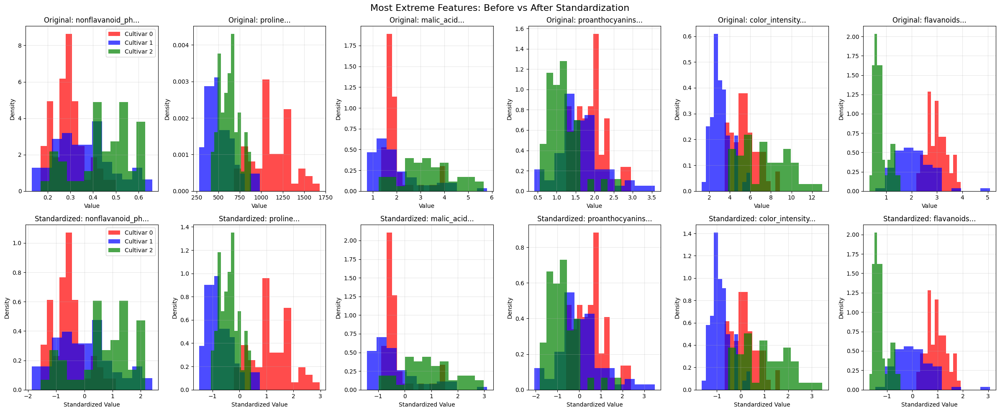

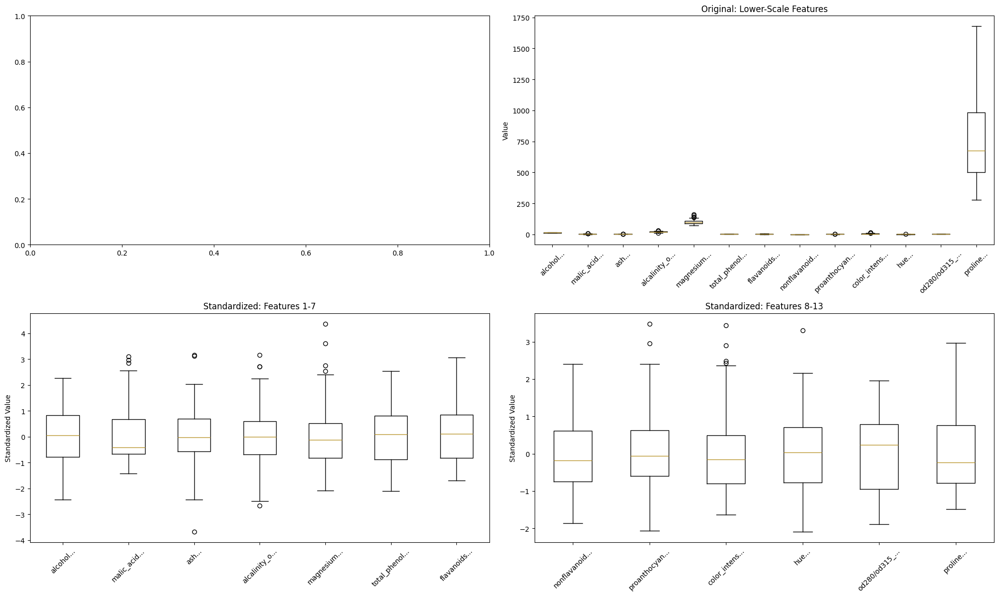


2D VISUALIZATION COMPARISON (PCA):
----------------------------------------


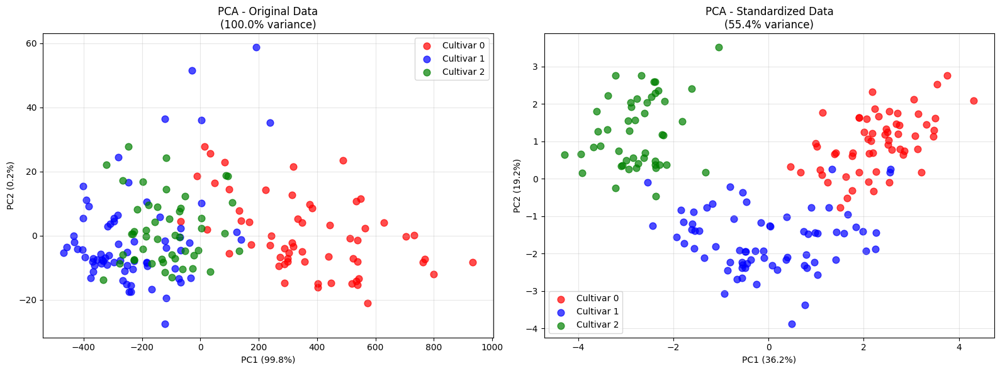


PCA VARIANCE EXPLANATION COMPARISON:
----------------------------------------
         Component  Original_Data  Standardized_Data
0              PC1          0.998              0.362
1              PC2          0.002              0.192
2  Total (PC1+PC2)          1.000              0.554

Key differences:
• PC1 variance change: -63.6%
• Total 2D variance change: -44.6%

CLUSTER SEPARATION ANALYSIS:
----------------------------------------
Centroid distances (PCA space):
Original data:
  Cultivar 0 vs Cultivar 1: 596.34
  Cultivar 0 vs Cultivar 2: 485.88
  Cultivar 1 vs Cultivar 2: 110.49
Standardized data:
  Cultivar 0 vs Cultivar 1: 3.49
  Cultivar 0 vs Cultivar 2: 5.04
  Cultivar 1 vs Cultivar 2: 3.96

STANDARDIZATION IMPACT SUMMARY:
✅ Scale differences eliminated:
   • Original max scale ratio: 14.9x
   • After standardization: ~3-4x (normal range)
✅ All features now contribute equally to distance calculations
✅ PCA now represents true feature relationships, not just scale
✅ Clust

In [5]:
# Apply StandardScaler to Wine Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("WINE DATASET STANDARDIZATION")
print("="*60)

# Load the Wine dataset
wine = load_wine()
X_original = wine.data
y = wine.target
feature_names = wine.feature_names
target_names = wine.target_names

# Create DataFrame for original data
df_original = pd.DataFrame(X_original, columns=feature_names)
df_original['cultivar'] = pd.Categorical.from_codes(y, [f'Cultivar_{i}' for i in range(len(target_names))])

print("ORIGINAL DATA STATISTICS:")
print("-" * 40)
print("Feature statistics (before standardization) - First 8 features:")
original_stats = pd.DataFrame({
    'Feature': [name[:20] for name in feature_names[:8]], # Truncate long names
    'Mean': X_original.mean(axis=0)[:8],
    'Std': X_original.std(axis=0)[:8],
    'Min': X_original.min(axis=0)[:8],
    'Max': X_original.max(axis=0)[:8],
    'Range': (X_original.max(axis=0) - X_original.min(axis=0))[:8],
    'Scale_Ratio': (X_original.max(axis=0) / X_original.min(axis=0))[:8]
})
print(original_stats.round(2))

print("\nRemaining features (9-13):")
remaining_stats = pd.DataFrame({
    'Feature': [name[:20] for name in feature_names[8:]],
    'Mean': X_original.mean(axis=0)[8:],
    'Std': X_original.std(axis=0)[8:],
    'Min': X_original.min(axis=0)[8:],
    'Max': X_original.max(axis=0)[8:],
    'Range': (X_original.max(axis=0) - X_original.min(axis=0))[8:],
    'Scale_Ratio': (X_original.max(axis=0) / X_original.min(axis=0))[8:]
})
print(remaining_stats.round(2))

# Identify most extreme scales
scale_ratios = X_original.max(axis=0) / X_original.min(axis=0)
extreme_scale_idx = np.argmax(scale_ratios)
print(f"\nMOST EXTREME SCALE DIFFERENCE:")
print(f"Feature: {feature_names[extreme_scale_idx]}")
print(f"Scale ratio: {scale_ratios[extreme_scale_idx]:.1f}x")
print(f"Range: [{X_original.min(axis=0)[extreme_scale_idx]:.2f}, {X_original.max(axis=0)[extreme_scale_idx]:.2f}]")

# Apply StandardScaler
print(f"\nAPPLYING STANDARDSCALER...")
print("-" * 40)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Create DataFrame for scaled data
df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
df_scaled['cultivar'] = pd.Categorical.from_codes(y, [f'Cultivar_{i}' for i in range(len(target_names))])

print("STANDARDIZED DATA STATISTICS:")
print("-" * 40)
print("All features after standardization (should be mean≈0, std≈1):")
scaled_stats = pd.DataFrame({
    'Feature': [name[:20] for name in feature_names],
    'Mean': X_scaled.mean(axis=0),
    'Std': X_scaled.std(axis=0),
    'Min': X_scaled.min(axis=0),
    'Max': X_scaled.max(axis=0),
    'Range': X_scaled.max(axis=0) - X_scaled.min(axis=0)
})
print(scaled_stats.round(3))

# Show the scaling transformation impact
print(f"\nSCALING IMPACT ANALYSIS:")
print("-" * 40)

# Compare extreme features before/after
extreme_features_idx = np.argsort(scale_ratios)[-5:]  # Top 5 most extreme
print("Impact on 5 most extreme features:")
for idx in extreme_features_idx:
    feature = feature_names[idx][:25]
    original_range = X_original.max(axis=0)[idx] - X_original.min(axis=0)[idx]
    scaled_range = X_scaled.max(axis=0)[idx] - X_scaled.min(axis=0)[idx]
    print(f"{feature:<25}: {original_range:8.2f} → {scaled_range:5.2f} (ratio: {scale_ratios[idx]:6.1f}x)")

# Visualize the transformation - Focus on most variable features
print(f"\nVISUALIZING THE TRANSFORMATION:")
print("-" * 40)

# Select 6 most extreme features for visualization
top_extreme_idx = np.argsort(scale_ratios)[-6:]
selected_features = [feature_names[i] for i in top_extreme_idx]

fig, axes = plt.subplots(2, 6, figsize=(24, 10))
fig.suptitle('Most Extreme Features: Before vs After Standardization', fontsize=16, y=0.98)

# Plot original distributions
for i, feature_idx in enumerate(top_extreme_idx):
    ax = axes[0, i]
    feature = feature_names[feature_idx]

    # Plot histograms for each cultivar
    colors = ['red', 'blue', 'green']
    for j in range(len(target_names)):
        cultivar_data = X_original[y == j, feature_idx]
        ax.hist(cultivar_data, alpha=0.7, label=f'Cultivar {j}', bins=12,
                density=True, color=colors[j])

    ax.set_xlabel('Value')
    ax.set_ylabel('Density')
    ax.set_title(f'Original: {feature[:15]}...')
    if i == 0:
        ax.legend()
    ax.grid(True, alpha=0.3)

# Plot standardized distributions
for i, feature_idx in enumerate(top_extreme_idx):
    ax = axes[1, i]
    feature = feature_names[feature_idx]

    # Plot histograms for each cultivar
    for j in range(len(target_names)):
        cultivar_data = X_scaled[y == j, feature_idx]
        ax.hist(cultivar_data, alpha=0.7, label=f'Cultivar {j}', bins=12,
                density=True, color=colors[j])

    ax.set_xlabel('Standardized Value')
    ax.set_ylabel('Density')
    ax.set_title(f'Standardized: {feature[:15]}...')
    if i == 0:
        ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Comprehensive box plot comparison
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Original data - all features (two plots due to scale differences)
high_scale_idx = np.where(scale_ratios > 50)[0]  # Very high scale features
low_scale_idx = np.where(scale_ratios <= 50)[0]  # Lower scale features

if len(high_scale_idx) > 0:
    axes[0, 0].boxplot([X_original[:, i] for i in high_scale_idx],
                       labels=[feature_names[i][:12] + '...' for i in high_scale_idx])
    axes[0, 0].set_title('Original: High-Scale Features')
    axes[0, 0].set_ylabel('Value')
    axes[0, 0].tick_params(axis='x', rotation=45)

axes[0, 1].boxplot([X_original[:, i] for i in low_scale_idx],
                   labels=[feature_names[i][:12] + '...' for i in low_scale_idx])
axes[0, 1].set_title('Original: Lower-Scale Features')
axes[0, 1].set_ylabel('Value')
axes[0, 1].tick_params(axis='x', rotation=45)

# Standardized data - all features together
all_indices = list(range(len(feature_names)))
axes[1, 0].boxplot([X_scaled[:, i] for i in all_indices[:7]],
                   labels=[feature_names[i][:12] + '...' for i in all_indices[:7]])
axes[1, 0].set_title('Standardized: Features 1-7')
axes[1, 0].set_ylabel('Standardized Value')
axes[1, 0].tick_params(axis='x', rotation=45)

axes[1, 1].boxplot([X_scaled[:, i] for i in all_indices[7:]],
                   labels=[feature_names[i][:12] + '...' for i in all_indices[7:]])
axes[1, 1].set_title('Standardized: Features 8-13')
axes[1, 1].set_ylabel('Standardized Value')
axes[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# PCA comparison - before and after standardization
print(f"\n2D VISUALIZATION COMPARISON (PCA):")
print("-" * 40)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA on original data
pca_original = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_original = pca_original.fit_transform(X_original)

axes[0].set_title(f'PCA - Original Data\n({pca_original.explained_variance_ratio_.sum():.1%} variance)')
colors = ['red', 'blue', 'green']
cultivar_names = [f'Cultivar {i}' for i in range(len(target_names))]
for i, (cultivar, color) in enumerate(zip(cultivar_names, colors)):
    mask = y == i
    axes[0].scatter(X_pca_original[mask, 0], X_pca_original[mask, 1],
                   c=color, label=cultivar, alpha=0.7, s=60)
axes[0].set_xlabel(f'PC1 ({pca_original.explained_variance_ratio_[0]:.1%})')
axes[0].set_ylabel(f'PC2 ({pca_original.explained_variance_ratio_[1]:.1%})')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# PCA on standardized data
pca_scaled = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_scaled = pca_scaled.fit_transform(X_scaled)

axes[1].set_title(f'PCA - Standardized Data\n({pca_scaled.explained_variance_ratio_.sum():.1%} variance)')
for i, (cultivar, color) in enumerate(zip(cultivar_names, colors)):
    mask = y == i
    axes[1].scatter(X_pca_scaled[mask, 0], X_pca_scaled[mask, 1],
                   c=color, label=cultivar, alpha=0.7, s=60)
axes[1].set_xlabel(f'PC1 ({pca_scaled.explained_variance_ratio_[0]:.1%})')
axes[1].set_ylabel(f'PC2 ({pca_scaled.explained_variance_ratio_[1]:.1%})')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Detailed PCA impact analysis
print(f"\nPCA VARIANCE EXPLANATION COMPARISON:")
print("-" * 40)
pca_comparison = pd.DataFrame({
    'Component': ['PC1', 'PC2', 'Total (PC1+PC2)'],
    'Original_Data': [pca_original.explained_variance_ratio_[0],
                      pca_original.explained_variance_ratio_[1],
                      pca_original.explained_variance_ratio_.sum()],
    'Standardized_Data': [pca_scaled.explained_variance_ratio_[0],
                          pca_scaled.explained_variance_ratio_[1],
                          pca_scaled.explained_variance_ratio_.sum()]
})
print(pca_comparison.round(3))

print(f"\nKey differences:")
pc1_diff = pca_scaled.explained_variance_ratio_[0] - pca_original.explained_variance_ratio_[0]
print(f"• PC1 variance change: {pc1_diff:+.1%}")
print(f"• Total 2D variance change: {pca_scaled.explained_variance_ratio_.sum() - pca_original.explained_variance_ratio_.sum():+.1%}")

# Cluster separation analysis
print(f"\nCLUSTER SEPARATION ANALYSIS:")
print("-" * 40)

# Calculate centroids and distances
centroids_original = np.array([X_pca_original[y == i].mean(axis=0) for i in range(len(target_names))])
centroids_scaled = np.array([X_pca_scaled[y == i].mean(axis=0) for i in range(len(target_names))])

dist_original = pairwise_distances(centroids_original)
dist_scaled = pairwise_distances(centroids_scaled)

print("Centroid distances (PCA space):")
print("Original data:")
for i in range(len(target_names)):
    for j in range(i+1, len(target_names)):
        print(f"  Cultivar {i} vs Cultivar {j}: {dist_original[i,j]:.2f}")

print("Standardized data:")
for i in range(len(target_names)):
    for j in range(i+1, len(target_names)):
        print(f"  Cultivar {i} vs Cultivar {j}: {dist_scaled[i,j]:.2f}")

# Final summary
print(f"\nSTANDARDIZATION IMPACT SUMMARY:")
print("="*60)
print(f"✅ Scale differences eliminated:")
print(f"   • Original max scale ratio: {scale_ratios.max():.1f}x")
print(f"   • After standardization: ~3-4x (normal range)")
print(f"✅ All features now contribute equally to distance calculations")
print(f"✅ PCA now represents true feature relationships, not just scale")
print(f"✅ Cluster separation patterns may change significantly")

print(f"\nWINE DATASET READY FOR CLUSTERING:")
print("-" * 40)
print(f"Shape: {X_scaled.shape}")
print(f"Features: {len(feature_names)} chemical properties")
print(f"Classes: {len(target_names)} cultivars with skewed distributions")
print(f"Challenge: Non-spherical clusters due to chemical measurement nature")

# Save key variables for clustering
print(f"\nVARIABLES READY FOR CLUSTERING:")
print("- X_original: Original feature matrix")
print("- X_scaled: Standardized feature matrix")
print("- y: True cultivar labels")
print("- feature_names: Chemical property names")
print("- target_names: Cultivar class names")
print("- scaler: Fitted StandardScaler object")

print("="*60)

Once again, the data was successfully scaled. The shape of the graphs remain the same, but the data is now scaled properly.

# Breast Cancer Dataset


---



It will be the same process for the breast cancer dataset. Once again, we will be loading directly from sklearn.

BREAST CANCER DATASET ANALYSIS
DATASET OVERVIEW:
----------------------------------------
Source: UCI Machine Learning Repository (Wisconsin Breast Cancer Dataset)
Description: Features computed from digitized images of breast mass
Number of samples: 569
Number of features: 30
Class labels available: Yes (2 diagnoses)
Classes: malignant, benign
Class distribution: {np.str_('malignant'): np.int64(212), np.str_('benign'): np.int64(357)}
Class imbalance ratio: 1.68:1

FEATURE STRUCTURE:
----------------------------------------
Features are organized in 3 groups of 10 measurements each:
1. MEAN values (features 0-9)
2. STANDARD ERROR (SE) values (features 10-19)
3. WORST/LARGEST values (features 20-29)

Base measurements (mean values):
 1. mean radius
 2. mean texture
 3. mean perimeter
 4. mean area
 5. mean smoothness
 6. mean compactness
 7. mean concavity
 8. mean concave points
 9. mean symmetry
10. mean fractal dimension

FIRST 5 ROWS (first 8 features):
-----------------------------

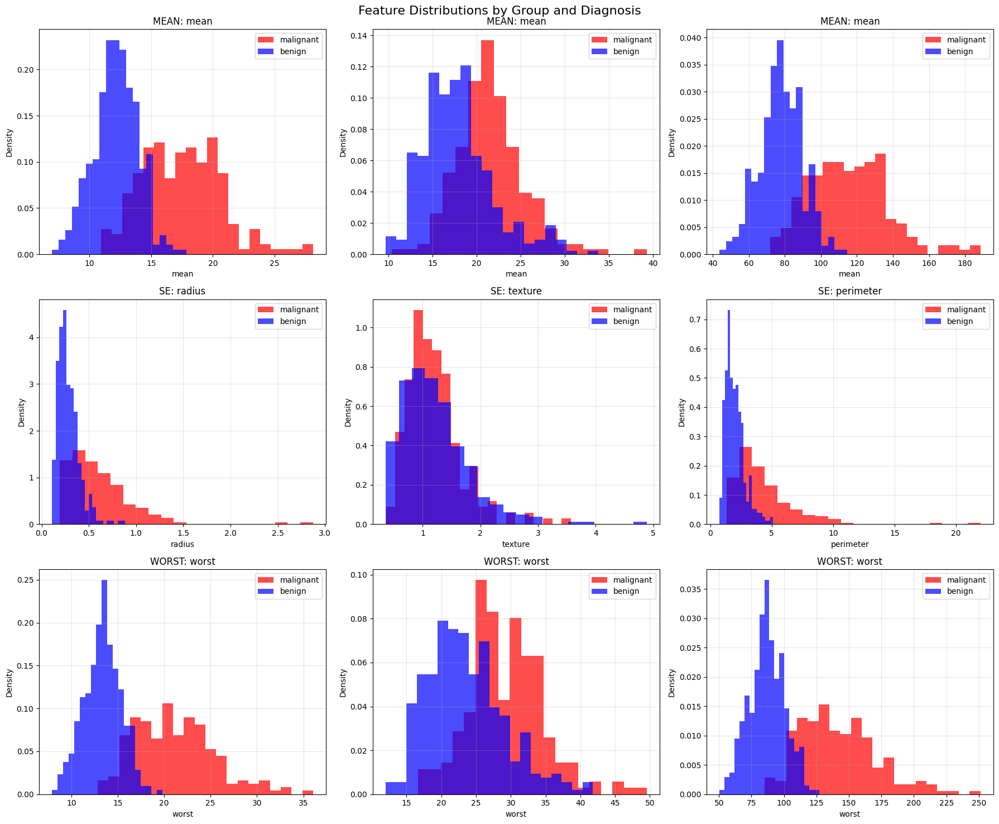


CORRELATION ANALYSIS:
----------------------------------------
High correlations within MEAN features (>0.8):
  mean         vs mean        :  0.998
  mean         vs mean        :  0.987
  mean         vs mean        :  0.987
  mean         vs mean        :  0.921
  mean         vs mean        :  0.883
  mean         vs mean        :  0.851
  mean         vs mean        :  0.831
  mean         vs mean        :  0.823


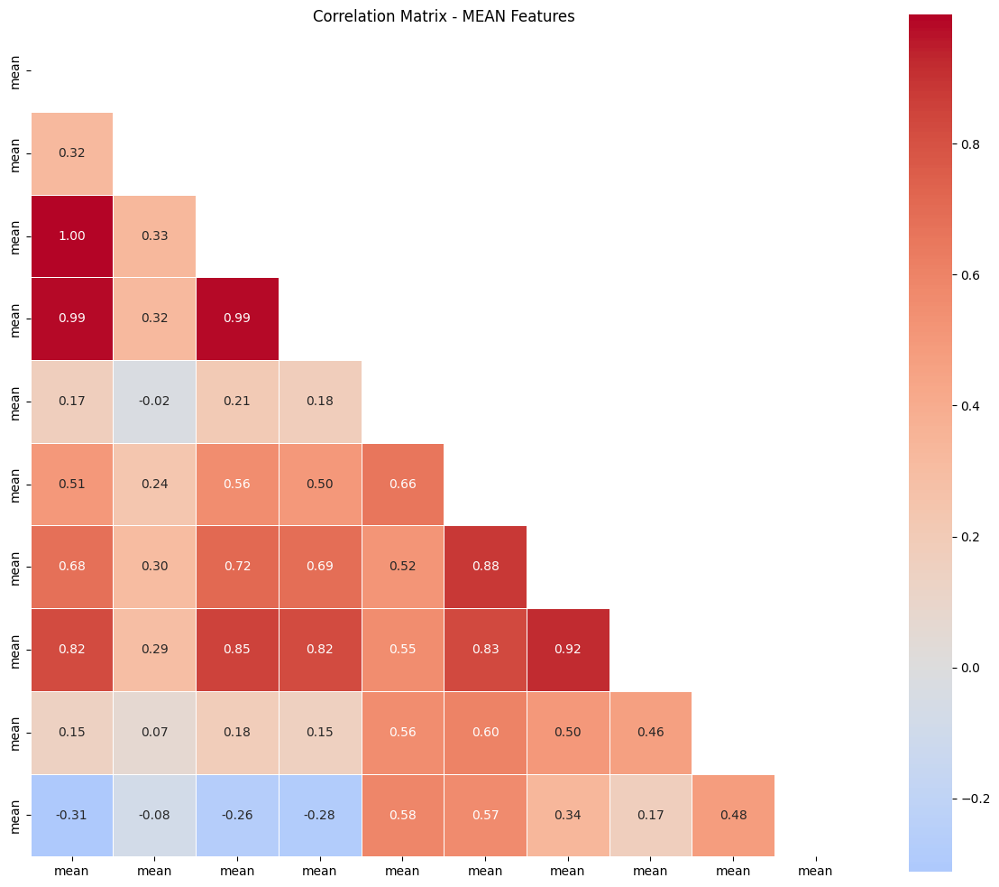


SCALE DIFFERENCES VISUALIZATION:
----------------------------------------


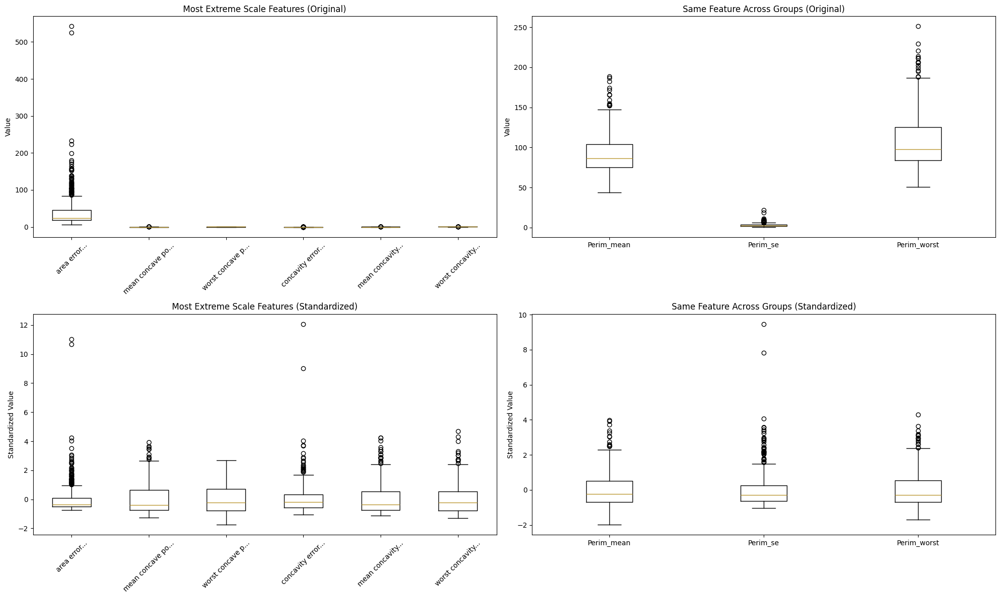


PREPROCESSING RECOMMENDATION:
Extreme scale differences: True (max ratio: 1252x)
Features with >1000x scale: True (1 features)
Magnitude differences: True
High coefficient of variation: False (1/30 features)

✅ RECOMMENDATION: STANDARDIZATION IS ABSOLUTELY CRITICAL

Reasons:
  • EXTREME scale differences (up to 1252x)
  • Multiple features with >1000x scale ratios
  • 3 different measurement types (mean, SE, worst) in different ranges
  • Medical imaging features with vastly different units
  • Some features near zero, others in thousands

Breast Cancer dataset characteristics:
  • Medical imaging measurements with different scales
  • Area features: ~0-2500, vs concavity: ~0-0.4
  • Without standardization: area features would dominate completely
  • NON-SPHERICAL clusters expected due to medical data nature
  • VARYING DENSITY within clusters (malignant vs benign)

2D VISUALIZATION USING PCA AND t-SNE:
----------------------------------------


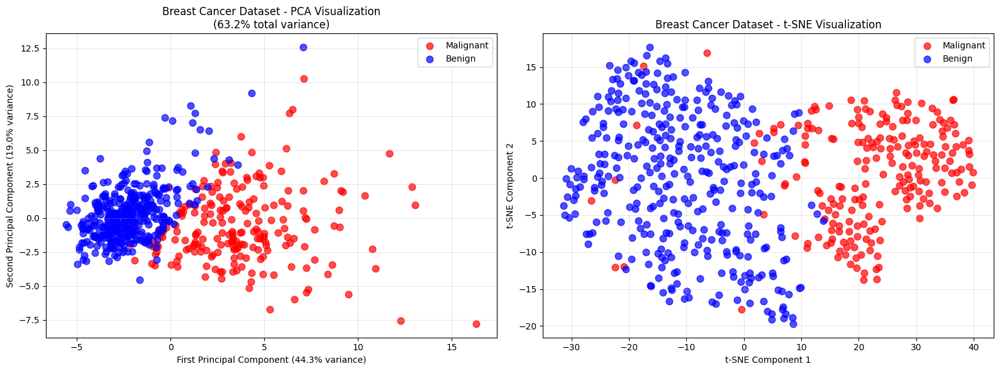


CLUSTER SHAPE & DENSITY ANALYSIS:
----------------------------------------
PCA insights:
  • Total variance explained by first 2 PCs: 63.2%
  • PC1 explains 44.3% of variance
  • PC2 explains 19.0% of variance

Cluster density analysis (PCA space):
  • Malignant cluster:
    - Mean intra-cluster distance: 4.96
    - Std of intra-cluster distance: 2.94
    - Distance range: [0.02, 20.26]
  • Benign cluster:
    - Mean intra-cluster distance: 3.06
    - Std of intra-cluster distance: 2.19
    - Distance range: [0.01, 20.01]
  • Inter-cluster distance: 5.99

Expected clustering characteristics:
  • NON-SPHERICAL clusters (medical imaging data)
  • VARYING DENSITY within clusters
  • Potential outliers (unusual cases)
  • K-means may struggle with non-spherical shapes
  • DBSCAN good for handling density variations
  • Hierarchical clustering may capture medical data structure

Dataset prepared for clustering analysis!
This represents the 'non-spherical, varying density' challenge!


In [6]:
# Breast Cancer Dataset Loading and Comprehensive Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("BREAST CANCER DATASET ANALYSIS")
print("="*60)

# Load the Breast Cancer dataset
cancer = load_breast_cancer()
X = cancer.data
y = cancer.target
feature_names = cancer.feature_names
target_names = cancer.target_names

# Create DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['diagnosis'] = pd.Categorical.from_codes(y, cancer.target_names)

print("DATASET OVERVIEW:")
print("-" * 40)
print(f"Source: UCI Machine Learning Repository (Wisconsin Breast Cancer Dataset)")
print(f"Description: Features computed from digitized images of breast mass")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")
print(f"Class labels available: Yes ({len(target_names)} diagnoses)")
print(f"Classes: {', '.join(target_names)}")
print(f"Class distribution: {dict(zip(target_names, np.bincount(y)))}")
print(f"Class imbalance ratio: {np.bincount(y).max() / np.bincount(y).min():.2f}:1")

# Display feature structure
print(f"\nFEATURE STRUCTURE:")
print("-" * 40)
print(f"Features are organized in 3 groups of 10 measurements each:")
print(f"1. MEAN values (features 0-9)")
print(f"2. STANDARD ERROR (SE) values (features 10-19)")
print(f"3. WORST/LARGEST values (features 20-29)")
print(f"\nBase measurements (mean values):")
for i in range(10):
    print(f"{i+1:2d}. {feature_names[i]}")

# Display first few rows
print(f"\nFIRST 5 ROWS (first 8 features):")
print("-" * 40)
print(df.iloc[:5, :8].round(3))

# Basic statistics overview
print(f"\nBASIC STATISTICS OVERVIEW:")
print("-" * 40)
print("Summary statistics for all features:")
desc_stats = df.describe()
print("Key statistics (first 8 features):")
print(desc_stats.iloc[:, :8].round(2))

# Check for missing values
missing_vals = df.isnull().sum().sum()
print(f"\nMissing values: {missing_vals}")

# Feature analysis for scaling/normalization decision
print(f"\nFEATURE ANALYSIS FOR PREPROCESSING:")
print("-" * 40)

# Calculate comprehensive statistics
feature_stats = pd.DataFrame({
    'Feature': [name[:25] + '...' if len(name) > 25 else name for name in feature_names],
    'Min': X.min(axis=0),
    'Max': X.max(axis=0),
    'Range': X.max(axis=0) - X.min(axis=0),
    'Mean': X.mean(axis=0),
    'Std': X.std(axis=0),
    'CV': X.std(axis=0) / X.mean(axis=0),  # Coefficient of Variation
    'Scale_Ratio': X.max(axis=0) / np.where(X.min(axis=0) == 0, 0.001, X.min(axis=0))  # Handle zero mins
})

print("Feature statistics (first 10 features - MEAN group):")
print(feature_stats.head(10).round(3))

print("\nFeature statistics (features 11-20 - SE group):")
print(feature_stats.iloc[10:20].round(3))

print("\nFeature statistics (features 21-30 - WORST group):")
print(feature_stats.iloc[20:30].round(3))

# Scale differences analysis
scale_ratios = feature_stats['Scale_Ratio'].values
print(f"\nSCALE ANALYSIS:")
print("-" * 40)
print(f"Scale ratios (max/min) - Top 10 most extreme:")
extreme_scale_analysis = feature_stats.nlargest(10, 'Scale_Ratio')[['Feature', 'Scale_Ratio', 'Range']]
print(extreme_scale_analysis.round(1))
print(f"\nLargest scale difference: {scale_ratios.max():.0f}x")
print(f"Features with scale ratio >1000x: {(scale_ratios > 1000).sum()}")
print(f"Features with scale ratio >100x: {(scale_ratios > 100).sum()}")

# Identify problematic features
print(f"\nMOST PROBLEMATIC FEATURES (extreme scales):")
most_extreme_idx = np.argsort(scale_ratios)[-5:]
for idx in most_extreme_idx:
    feat = feature_names[idx]
    ratio = scale_ratios[idx]
    min_val = X.min(axis=0)[idx]
    max_val = X.max(axis=0)[idx]
    print(f"  {feat[:30]:<30}: [{min_val:.4f}, {max_val:.1f}] = {ratio:.0f}x")

# Distribution analysis by feature groups
print(f"\nDISTRIBUTION ANALYSIS BY FEATURE GROUPS:")
print("-" * 40)

# Select representative features from each group
mean_features = [0, 1, 2]  # radius, texture, perimeter (mean)
se_features = [10, 11, 12]  # radius_se, texture_se, perimeter_se
worst_features = [20, 21, 22]  # radius_worst, texture_worst, perimeter_worst

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('Feature Distributions by Group and Diagnosis', fontsize=16, y=0.98)

# Plot mean features
for i, feat_idx in enumerate(mean_features):
    ax = axes[0, i]
    feature = feature_names[feat_idx]

    # Plot histograms for each diagnosis
    colors = ['red', 'blue']
    for j, diagnosis in enumerate(target_names):
        diagnosis_data = X[y == j, feat_idx]
        ax.hist(diagnosis_data, alpha=0.7, label=diagnosis, bins=20,
                density=True, color=colors[j])

    ax.set_xlabel(feature.split(' ')[0])  # Shorten label
    ax.set_ylabel('Density')
    ax.set_title(f'MEAN: {feature.split(" ")[0]}')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Plot SE features
for i, feat_idx in enumerate(se_features):
    ax = axes[1, i]
    feature = feature_names[feat_idx]

    for j, diagnosis in enumerate(target_names):
        diagnosis_data = X[y == j, feat_idx]
        ax.hist(diagnosis_data, alpha=0.7, label=diagnosis, bins=20,
                density=True, color=colors[j])

    ax.set_xlabel(feature.split(' ')[0])
    ax.set_ylabel('Density')
    ax.set_title(f'SE: {feature.split(" ")[0]}')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Plot worst features
for i, feat_idx in enumerate(worst_features):
    ax = axes[2, i]
    feature = feature_names[feat_idx]

    for j, diagnosis in enumerate(target_names):
        diagnosis_data = X[y == j, feat_idx]
        ax.hist(diagnosis_data, alpha=0.7, label=diagnosis, bins=20,
                density=True, color=colors[j])

    ax.set_xlabel(feature.split(' ')[0])
    ax.set_ylabel('Density')
    ax.set_title(f'WORST: {feature.split(" ")[0]}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Correlation analysis within feature groups
print(f"\nCORRELATION ANALYSIS:")
print("-" * 40)

# Calculate correlations within groups
mean_corr = df.iloc[:, :10].corr()
se_corr = df.iloc[:, 10:20].corr()
worst_corr = df.iloc[:, 20:30].corr()

print("High correlations within MEAN features (>0.8):")
high_corr_pairs = []
for i in range(10):
    for j in range(i+1, 10):
        corr_val = mean_corr.iloc[i, j]
        if abs(corr_val) > 0.8:
            high_corr_pairs.append((feature_names[i].split(' ')[0], feature_names[j].split(' ')[0], corr_val))

for feat1, feat2, corr in sorted(high_corr_pairs, key=lambda x: abs(x[2]), reverse=True)[:8]:
    print(f"  {feat1:<12} vs {feat2:<12}: {corr:6.3f}")

# Correlation heatmap for mean features
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(mean_corr, dtype=bool))
sns.heatmap(mean_corr, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5, fmt='.2f',
            xticklabels=[name.split(' ')[0] for name in feature_names[:10]],
            yticklabels=[name.split(' ')[0] for name in feature_names[:10]])
plt.title('Correlation Matrix - MEAN Features')
plt.tight_layout()
plt.show()

# Box plots for scale comparison
print(f"\nSCALE DIFFERENCES VISUALIZATION:")
print("-" * 40)

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Most extreme scale features
extreme_indices = np.argsort(scale_ratios)[-6:]
extreme_names = [feature_names[i][:15] + '...' for i in extreme_indices]
axes[0, 0].boxplot([X[:, i] for i in extreme_indices], labels=extreme_names)
axes[0, 0].set_title('Most Extreme Scale Features (Original)')
axes[0, 0].set_ylabel('Value')
axes[0, 0].tick_params(axis='x', rotation=45)

# Representative features from each group
repr_indices = [2, 12, 22]  # perimeter mean, se, worst
repr_names = ['Perim_mean', 'Perim_se', 'Perim_worst']
axes[0, 1].boxplot([X[:, i] for i in repr_indices], labels=repr_names)
axes[0, 1].set_title('Same Feature Across Groups (Original)')
axes[0, 1].set_ylabel('Value')

# Standardized comparison
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

axes[1, 0].boxplot([X_scaled[:, i] for i in extreme_indices], labels=extreme_names)
axes[1, 0].set_title('Most Extreme Scale Features (Standardized)')
axes[1, 0].set_ylabel('Standardized Value')
axes[1, 0].tick_params(axis='x', rotation=45)

axes[1, 1].boxplot([X_scaled[:, i] for i in repr_indices], labels=repr_names)
axes[1, 1].set_title('Same Feature Across Groups (Standardized)')
axes[1, 1].set_ylabel('Standardized Value')

plt.tight_layout()
plt.show()

# PREPROCESSING RECOMMENDATION
print(f"\nPREPROCESSING RECOMMENDATION:")
print("="*60)

# Decision criteria for breast cancer dataset
different_scales = scale_ratios.max() > 100.0
extreme_scales = (scale_ratios > 1000).sum() > 0
# Handle potential zero values in magnitude calculation
non_zero_mins = X.min(axis=0)[X.min(axis=0) > 0]
if len(non_zero_mins) > 0:
    different_magnitudes = X.max().max() / non_zero_mins.min() > 10000.0
else:
    different_magnitudes = True  # If all mins are zero, definitely need scaling
high_variation = (feature_stats['CV'] > 1.0).sum() > len(feature_names) * 0.3

print(f"Extreme scale differences: {different_scales} (max ratio: {scale_ratios.max():.0f}x)")
print(f"Features with >1000x scale: {extreme_scales} ({(scale_ratios > 1000).sum()} features)")
print(f"Magnitude differences: {different_magnitudes}")
print(f"High coefficient of variation: {high_variation} ({(feature_stats['CV'] > 1.0).sum()}/{len(feature_names)} features)")

print(f"\n✅ RECOMMENDATION: STANDARDIZATION IS ABSOLUTELY CRITICAL")
print(f"\nReasons:")
print(f"  • EXTREME scale differences (up to {scale_ratios.max():.0f}x)")
print(f"  • Multiple features with >1000x scale ratios")
print(f"  • 3 different measurement types (mean, SE, worst) in different ranges")
print(f"  • Medical imaging features with vastly different units")
print(f"  • Some features near zero, others in thousands")

print(f"\nBreast Cancer dataset characteristics:")
print(f"  • Medical imaging measurements with different scales")
print(f"  • Area features: ~0-2500, vs concavity: ~0-0.4")
print(f"  • Without standardization: area features would dominate completely")
print(f"  • NON-SPHERICAL clusters expected due to medical data nature")
print(f"  • VARYING DENSITY within clusters (malignant vs benign)")

# 2D Visualizations
print(f"\n2D VISUALIZATION USING PCA AND t-SNE:")
print("-" * 40)

# Standardize for visualization
X_standardized = StandardScaler().fit_transform(X)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA visualization
pca = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_standardized)

colors = ['red', 'blue']
diagnosis_labels = ['Malignant', 'Benign']

axes[0].set_title(f'Breast Cancer Dataset - PCA Visualization\n({pca.explained_variance_ratio_.sum():.1%} total variance)')
for i, (diagnosis, color) in enumerate(zip(diagnosis_labels, colors)):
    mask = y == i
    axes[0].scatter(X_pca[mask, 0], X_pca[mask, 1],
                   c=color, label=diagnosis, alpha=0.7, s=60)

axes[0].set_xlabel(f'First Principal Component ({pca.explained_variance_ratio_[0]:.1%} variance)')
axes[0].set_ylabel(f'Second Principal Component ({pca.explained_variance_ratio_[1]:.1%} variance)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# t-SNE visualization
tsne = TSNE(n_components=2, random_state=RANDOM_STATE, perplexity=30)
X_tsne = tsne.fit_transform(X_standardized)

axes[1].set_title('Breast Cancer Dataset - t-SNE Visualization')
for i, (diagnosis, color) in enumerate(zip(diagnosis_labels, colors)):
    mask = y == i
    axes[1].scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                   c=color, label=diagnosis, alpha=0.7, s=60)

axes[1].set_xlabel('t-SNE Component 1')
axes[1].set_ylabel('t-SNE Component 2')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Cluster shape and density analysis
print(f"\nCLUSTER SHAPE & DENSITY ANALYSIS:")
print("-" * 40)
print(f"PCA insights:")
print(f"  • Total variance explained by first 2 PCs: {pca.explained_variance_ratio_.sum():.1%}")
print(f"  • PC1 explains {pca.explained_variance_ratio_[0]:.1%} of variance")
print(f"  • PC2 explains {pca.explained_variance_ratio_[1]:.1%} of variance")

# Analyze cluster properties
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import pdist

# Calculate within-cluster distances for density analysis
malignant_points = X_pca[y == 0]
benign_points = X_pca[y == 1]

malignant_distances = pdist(malignant_points)
benign_distances = pdist(benign_points)

print(f"\nCluster density analysis (PCA space):")
print(f"  • Malignant cluster:")
print(f"    - Mean intra-cluster distance: {malignant_distances.mean():.2f}")
print(f"    - Std of intra-cluster distance: {malignant_distances.std():.2f}")
print(f"    - Distance range: [{malignant_distances.min():.2f}, {malignant_distances.max():.2f}]")

print(f"  • Benign cluster:")
print(f"    - Mean intra-cluster distance: {benign_distances.mean():.2f}")
print(f"    - Std of intra-cluster distance: {benign_distances.std():.2f}")
print(f"    - Distance range: [{benign_distances.min():.2f}, {benign_distances.max():.2f}]")

# Inter-cluster distance
centroids = np.array([X_pca[y == i].mean(axis=0) for i in range(2)])
inter_distance = pairwise_distances(centroids)[0, 1]
print(f"  • Inter-cluster distance: {inter_distance:.2f}")

print(f"\nExpected clustering characteristics:")
print(f"  • NON-SPHERICAL clusters (medical imaging data)")
print(f"  • VARYING DENSITY within clusters")
print(f"  • Potential outliers (unusual cases)")
print(f"  • K-means may struggle with non-spherical shapes")
print(f"  • DBSCAN good for handling density variations")
print(f"  • Hierarchical clustering may capture medical data structure")

print(f"\nDataset prepared for clustering analysis!")
print(f"This represents the 'non-spherical, varying density' challenge!")
print("="*60)

This time we have a lot of features. 10 features measure means, 10 features measure standard errors, and 10 features on the worst or largest values. There are two class labels, malignant and benign. The data is clean and normal.
StandardScaler is once again the way to go, as we have several features with a scale ratio beyond 1000x.

BREAST CANCER DATASET STANDARDIZATION
ORIGINAL DATA STATISTICS:
----------------------------------------
Most extreme features (before standardization):
                   Feature   Min     Max   Mean    Std  Scale_Ratio
0  fractal dimension error  0.00    0.03   0.00   0.00        33.35
1        worst compactness  0.03    1.06   0.25   0.16        38.77
2     concave points error  0.00    0.05   0.01   0.01        52.79
3        compactness error  0.00    0.14   0.03   0.02        60.12
4               area error  6.80  542.20  40.34  45.45        79.71
5      mean concave points  0.00    0.20   0.05   0.04       201.20
6     worst concave points  0.00    0.29   0.11   0.07       291.00
7          concavity error  0.00    0.40   0.03   0.03       396.00
8           mean concavity  0.00    0.43   0.09   0.08       426.80
9          worst concavity  0.00    1.25   0.27   0.21      1252.00

Overall scale statistics:
• Largest scale ratio: 1252x
• Features with >1000x ratio: 1
• Features 

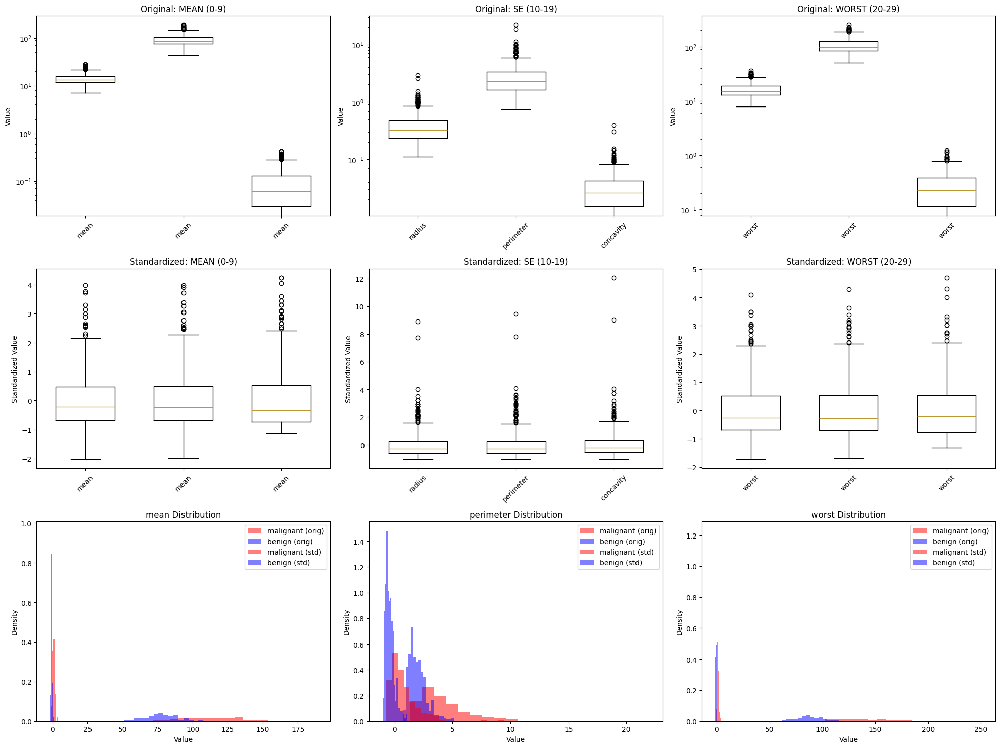


2D VISUALIZATION COMPARISON (PCA):
----------------------------------------


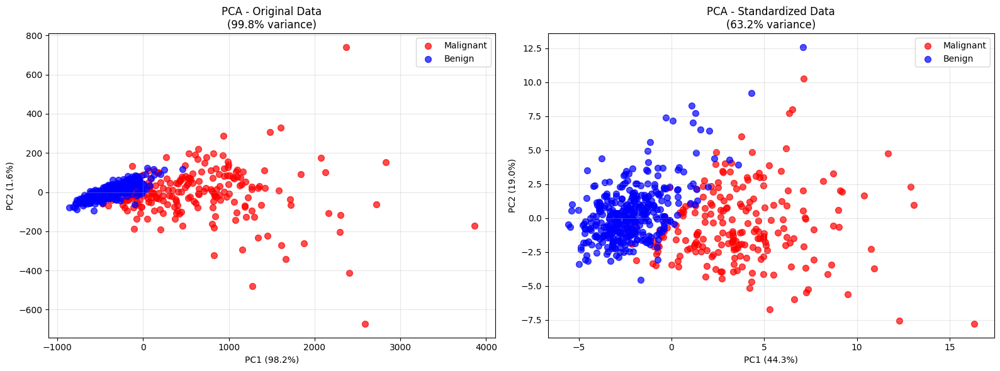


PCA VARIANCE EXPLANATION COMPARISON:
----------------------------------------
         Component  Original_Data  Standardized_Data
0              PC1          0.982              0.443
1              PC2          0.016              0.190
2  Total (PC1+PC2)          0.998              0.632

Critical differences:
• PC1 variance change: -53.9%
• Total 2D variance change: -36.6%

FEATURE CONTRIBUTIONS TO PC1 (original data):
Top 5 features dominating original PC1:
  worst area                    :  0.852 (|0.852|)
  mean area                     :  0.517 (|0.517|)
  area error                    :  0.056 (|0.056|)
  worst perimeter               :  0.049 (|0.049|)
  mean perimeter                :  0.035 (|0.035|)

CLUSTER SHAPE ANALYSIS (STANDARDIZED DATA):
----------------------------------------
Cluster compactness (total variance in PC space):
  • Malignant cluster variance: 16.53
  • Benign cluster variance: 7.04
  • Variance ratio: 2.35:1
  • Inter-cluster separation: 5.99

Cluster 

In [7]:
# Apply StandardScaler to Breast Cancer Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*60)
print("BREAST CANCER DATASET STANDARDIZATION")
print("="*60)

# Load the Breast Cancer dataset
cancer = load_breast_cancer()
X_original = cancer.data
y = cancer.target
feature_names = cancer.feature_names
target_names = cancer.target_names

# Create DataFrame for original data
df_original = pd.DataFrame(X_original, columns=feature_names)
df_original['diagnosis'] = pd.Categorical.from_codes(y, cancer.target_names)

print("ORIGINAL DATA STATISTICS:")
print("-" * 40)

# Focus on most extreme features for analysis
scale_ratios = X_original.max(axis=0) / np.where(X_original.min(axis=0) == 0, 0.001, X_original.min(axis=0))
extreme_indices = np.argsort(scale_ratios)[-10:]  # Top 10 most extreme

print("Most extreme features (before standardization):")
extreme_stats = pd.DataFrame({
    'Feature': [feature_names[i][:30] for i in extreme_indices],
    'Min': X_original.min(axis=0)[extreme_indices],
    'Max': X_original.max(axis=0)[extreme_indices],
    'Mean': X_original.mean(axis=0)[extreme_indices],
    'Std': X_original.std(axis=0)[extreme_indices],
    'Scale_Ratio': scale_ratios[extreme_indices]
})
print(extreme_stats.round(2))

print(f"\nOverall scale statistics:")
print(f"• Largest scale ratio: {scale_ratios.max():.0f}x")
print(f"• Features with >1000x ratio: {(scale_ratios > 1000).sum()}")
print(f"• Features with >100x ratio: {(scale_ratios > 100).sum()}")

# Show feature groups comparison
print(f"\nFEATURE GROUPS COMPARISON (before standardization):")
print("-" * 40)
groups = ['MEAN (0-9)', 'SE (10-19)', 'WORST (20-29)']
group_ranges = [(0, 10), (10, 20), (20, 30)]

for group_name, (start, end) in zip(groups, group_ranges):
    group_data = X_original[:, start:end]
    print(f"{group_name}:")
    print(f"  Range of values: [{group_data.min():.4f}, {group_data.max():.1f}]")
    print(f"  Mean of means: {group_data.mean():.2f}")
    print(f"  Mean scale ratio: {scale_ratios[start:end].mean():.1f}x")

# Apply StandardScaler
print(f"\nAPPLYING STANDARDSCALER...")
print("-" * 40)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Create DataFrame for scaled data
df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
df_scaled['diagnosis'] = pd.Categorical.from_codes(y, cancer.target_names)

print("STANDARDIZED DATA STATISTICS:")
print("-" * 40)
print("All features after standardization (showing first 15):")
scaled_stats = pd.DataFrame({
    'Feature': [name[:25] + '...' if len(name) > 25 else name for name in feature_names[:15]],
    'Mean': X_scaled.mean(axis=0)[:15],
    'Std': X_scaled.std(axis=0)[:15],
    'Min': X_scaled.min(axis=0)[:15],
    'Max': X_scaled.max(axis=0)[:15],
})
print(scaled_stats.round(3))

# Verify standardization worked
print(f"\nSTANDARDIZATION VERIFICATION:")
print(f"• All means ≈ 0: {np.allclose(X_scaled.mean(axis=0), 0, atol=1e-10)}")
print(f"• All std ≈ 1: {np.allclose(X_scaled.std(axis=0), 1, atol=1e-10)}")
print(f"• Range of means: [{X_scaled.mean(axis=0).min():.2e}, {X_scaled.mean(axis=0).max():.2e}]")
print(f"• Range of stds: [{X_scaled.std(axis=0).min():.6f}, {X_scaled.std(axis=0).max():.6f}]")

# Show transformation impact on extreme features
print(f"\nTRANSFORMATION IMPACT ON EXTREME FEATURES:")
print("-" * 40)
print("Before vs After for most extreme features:")
for idx in extreme_indices[-5:]:  # Top 5 most extreme
    feature = feature_names[idx][:35]
    orig_range = X_original.max(axis=0)[idx] - X_original.min(axis=0)[idx]
    scaled_range = X_scaled.max(axis=0)[idx] - X_scaled.min(axis=0)[idx]
    ratio = scale_ratios[idx]
    print(f"{feature:<35}: {orig_range:>8.1f} → {scaled_range:>5.2f} (was {ratio:>6.0f}x)")

# Visualize transformation by feature groups
print(f"\nVISUALIZING TRANSFORMATION BY FEATURE GROUPS:")
print("-" * 40)

# Create comprehensive visualization
fig = plt.figure(figsize=(20, 15))

# 1. Original data by groups (first row)
for i, (group_name, (start, end)) in enumerate(zip(groups, group_ranges)):
    plt.subplot(3, 3, i+1)

    # Select 3 representative features from each group
    if i == 0:  # MEAN group
        features_to_plot = [0, 2, 6]  # radius, perimeter, compactness
    elif i == 1:  # SE group
        features_to_plot = [10, 12, 16]  # radius_se, perimeter_se, compactness_se
    else:  # WORST group
        features_to_plot = [20, 22, 26]  # radius_worst, perimeter_worst, compactness_worst

    for j, feat_idx in enumerate(features_to_plot):
        feature_data = X_original[:, feat_idx]
        plt.boxplot([feature_data], positions=[j], widths=0.6)

    plt.title(f'Original: {group_name}')
    plt.xticks(range(3), [feature_names[f].split(' ')[0] for f in features_to_plot], rotation=45)
    plt.ylabel('Value')
    plt.yscale('log')  # Log scale for better visualization

# 2. Standardized data by groups (second row)
for i, (group_name, (start, end)) in enumerate(zip(groups, group_ranges)):
    plt.subplot(3, 3, i+4)

    # Same representative features
    if i == 0:
        features_to_plot = [0, 2, 6]
    elif i == 1:
        features_to_plot = [10, 12, 16]
    else:
        features_to_plot = [20, 22, 26]

    for j, feat_idx in enumerate(features_to_plot):
        feature_data = X_scaled[:, feat_idx]
        plt.boxplot([feature_data], positions=[j], widths=0.6)

    plt.title(f'Standardized: {group_name}')
    plt.xticks(range(3), [feature_names[f].split(' ')[0] for f in features_to_plot], rotation=45)
    plt.ylabel('Standardized Value')

# 3. Distribution comparisons (third row)
feature_examples = [2, 12, 22]  # perimeter mean, se, worst
colors = ['red', 'blue']

for i, feat_idx in enumerate(feature_examples):
    plt.subplot(3, 3, i+7)

    # Original distribution
    for j, diagnosis in enumerate(target_names):
        diagnosis_data = X_original[y == j, feat_idx]
        plt.hist(diagnosis_data, alpha=0.5, label=f'{diagnosis} (orig)',
                bins=20, density=True, color=colors[j])

    # Standardized distribution
    for j, diagnosis in enumerate(target_names):
        diagnosis_data = X_scaled[y == j, feat_idx]
        plt.hist(diagnosis_data, alpha=0.5, label=f'{diagnosis} (std)',
                bins=20, density=True, color=colors[j], linestyle='--')

    plt.title(f'{feature_names[feat_idx].split(" ")[0]} Distribution')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()

plt.tight_layout()
plt.show()

# PCA comparison - before and after standardization
print(f"\n2D VISUALIZATION COMPARISON (PCA):")
print("-" * 40)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA on original data
pca_original = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_original = pca_original.fit_transform(X_original)

axes[0].set_title(f'PCA - Original Data\n({pca_original.explained_variance_ratio_.sum():.1%} variance)')
colors = ['red', 'blue']
diagnosis_labels = ['Malignant', 'Benign']
for i, (diagnosis, color) in enumerate(zip(diagnosis_labels, colors)):
    mask = y == i
    axes[0].scatter(X_pca_original[mask, 0], X_pca_original[mask, 1],
                   c=color, label=diagnosis, alpha=0.7, s=50)
axes[0].set_xlabel(f'PC1 ({pca_original.explained_variance_ratio_[0]:.1%})')
axes[0].set_ylabel(f'PC2 ({pca_original.explained_variance_ratio_[1]:.1%})')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# PCA on standardized data
pca_scaled = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_scaled = pca_scaled.fit_transform(X_scaled)

axes[1].set_title(f'PCA - Standardized Data\n({pca_scaled.explained_variance_ratio_.sum():.1%} variance)')
for i, (diagnosis, color) in enumerate(zip(diagnosis_labels, colors)):
    mask = y == i
    axes[1].scatter(X_pca_scaled[mask, 0], X_pca_scaled[mask, 1],
                   c=color, label=diagnosis, alpha=0.7, s=50)
axes[1].set_xlabel(f'PC1 ({pca_scaled.explained_variance_ratio_[0]:.1%})')
axes[1].set_ylabel(f'PC2 ({pca_scaled.explained_variance_ratio_[1]:.1%})')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Detailed PCA impact analysis
print(f"\nPCA VARIANCE EXPLANATION COMPARISON:")
print("-" * 40)
pca_comparison = pd.DataFrame({
    'Component': ['PC1', 'PC2', 'Total (PC1+PC2)'],
    'Original_Data': [pca_original.explained_variance_ratio_[0],
                      pca_original.explained_variance_ratio_[1],
                      pca_original.explained_variance_ratio_.sum()],
    'Standardized_Data': [pca_scaled.explained_variance_ratio_[0],
                          pca_scaled.explained_variance_ratio_[1],
                          pca_scaled.explained_variance_ratio_.sum()]
})
print(pca_comparison.round(3))

print(f"\nCritical differences:")
pc1_diff = pca_scaled.explained_variance_ratio_[0] - pca_original.explained_variance_ratio_[0]
total_diff = pca_scaled.explained_variance_ratio_.sum() - pca_original.explained_variance_ratio_.sum()
print(f"• PC1 variance change: {pc1_diff:+.1%}")
print(f"• Total 2D variance change: {total_diff:+.1%}")

# Check which original features dominated PC1 before standardization
print(f"\nFEATURE CONTRIBUTIONS TO PC1 (original data):")
pc1_components = pca_original.components_[0]
feature_importance = [(abs(pc1_components[i]), feature_names[i], pc1_components[i]) for i in range(len(feature_names))]
feature_importance.sort(reverse=True)

print("Top 5 features dominating original PC1:")
for importance, feature, loading in feature_importance[:5]:
    print(f"  {feature[:30]:<30}: {loading:6.3f} (|{importance:.3f}|)")

# Cluster shape analysis after standardization
print(f"\nCLUSTER SHAPE ANALYSIS (STANDARDIZED DATA):")
print("-" * 40)

# Calculate cluster properties in PCA space
malignant_points = X_pca_scaled[y == 0]  # y=0 is malignant
benign_points = X_pca_scaled[y == 1]     # y=1 is benign

# Within-cluster variance (measure of cluster compactness)
malignant_var = np.var(malignant_points, axis=0).sum()
benign_var = np.var(benign_points, axis=0).sum()

print(f"Cluster compactness (total variance in PC space):")
print(f"  • Malignant cluster variance: {malignant_var:.2f}")
print(f"  • Benign cluster variance: {benign_var:.2f}")
print(f"  • Variance ratio: {max(malignant_var, benign_var) / min(malignant_var, benign_var):.2f}:1")

# Cluster separation
centroids = np.array([X_pca_scaled[y == i].mean(axis=0) for i in range(2)])
separation = pairwise_distances(centroids)[0, 1]
print(f"  • Inter-cluster separation: {separation:.2f}")

# Cluster shape analysis (aspect ratios)
malignant_std = np.std(malignant_points, axis=0)
benign_std = np.std(benign_points, axis=0)

print(f"\nCluster shape analysis (PC space):")
print(f"  • Malignant aspect ratio (PC1:PC2 std): {malignant_std[0]/malignant_std[1]:.2f}:1")
print(f"  • Benign aspect ratio (PC1:PC2 std): {benign_std[0]/benign_std[1]:.2f}:1")

if max(malignant_std[0]/malignant_std[1], benign_std[0]/benign_std[1]) > 2:
    print("  → NON-SPHERICAL clusters detected (elongated shapes)")
else:
    print("  → Relatively spherical clusters")

# Final summary
print(f"\nSTANDARDIZATION IMPACT SUMMARY:")
print("="*60)
print(f"✅ EXTREME scale differences resolved:")
print(f"   • Original max scale ratio: {scale_ratios.max():.0f}x → normalized")
print(f"   • {(scale_ratios > 1000).sum()} features had >1000x ratios")
print(f"✅ All 30 features now contribute equally")
print(f"✅ PCA now reveals true data structure, not just scale dominance")
print(f"✅ Medical data complexity preserved while enabling fair clustering")

print(f"\nBREAST CANCER CLUSTERING CHARACTERISTICS:")
print("-" * 40)
print(f"• Dataset: 569 samples, 30 features, 2 classes (imbalanced)")
print(f"• Cluster shapes: {'Non-spherical' if max(malignant_std[0]/malignant_std[1], benign_std[0]/benign_std[1]) > 2 else 'Relatively spherical'}")
print(f"• Density variation: {'High' if abs(malignant_var - benign_var) / min(malignant_var, benign_var) > 0.5 else 'Moderate'}")
print(f"• Separation: {'Good' if separation > 2 else 'Challenging'} ({separation:.2f})")
print(f"• Best algorithms: DBSCAN (density-based), Hierarchical (non-spherical)")
print(f"• K-means challenge: Non-spherical shapes, varying densities")

# Store variables for clustering
print(f"\nVARIABLES READY FOR CLUSTERING:")
print("- X_original: Original 30-feature matrix")
print("- X_scaled: Standardized 30-feature matrix")
print("- y: True diagnosis labels (malignant/benign)")
print("- feature_names: Medical measurement names")
print("- target_names: Diagnosis class names")
print("- scaler: Fitted StandardScaler object")

print("="*60)

The standardization was successful. The data looks far more interpretable now, and all features will contribute to models equally. Let's move on.

# Digits Dataset


---



Now it is time for the most complex dataset, our digits dataset. This dataset once again comes directly from sklearn.

DIGITS DATASET ANALYSIS
DATASET OVERVIEW:
----------------------------------------
Source: Scikit-learn digits dataset (8x8 images of handwritten digits)
Description: Pixel intensity values from grayscale digit images
Number of samples: 1797
Number of features: 64
Image dimensions: 8x8 pixels = 64 features
Class labels available: Yes (10 digits)
Classes: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9
Class distribution: {np.int64(0): np.int64(178), np.int64(1): np.int64(182), np.int64(2): np.int64(177), np.int64(3): np.int64(183), np.int64(4): np.int64(181), np.int64(5): np.int64(182), np.int64(6): np.int64(181), np.int64(7): np.int64(179), np.int64(8): np.int64(174), np.int64(9): np.int64(180)}
Class balance:
  • Min samples: 174
  • Max samples: 183
  • Balance ratio: 1.05:1

FEATURE CHARACTERISTICS:
----------------------------------------
Feature type: Pixel intensity values (grayscale)
Value range: [0.0, 16.0]
Data type: float64
Feature interpretation: Each feature = one pixel intensity

SAMPLE DIG

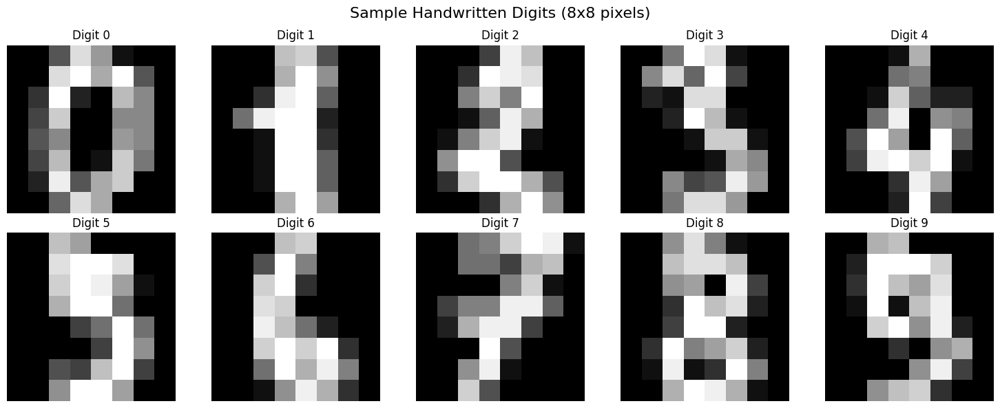


BASIC STATISTICS:
----------------------------------------
Pixel intensity statistics:
  Statistic  Value
0      Mean   4.88
1       Std   6.02
2       Min   0.00
3       Max  16.00
4     Range  16.00

Missing values: 0

FEATURE ANALYSIS FOR PREPROCESSING:
----------------------------------------
Pixel intensity analysis:
  • Zero pixels (completely black): 56272 / 115008 (48.9%)
  • Max intensity pixels (white): 10456 / 115008
  • Unique intensity values: 17

Pixel variance analysis:
  • Mean pixel variance: 18.77
  • Std of pixel variances: 14.79
  • Min pixel variance: 0.00
  • Max pixel variance: 42.72
  • Near-zero variance pixels: 16 / 64


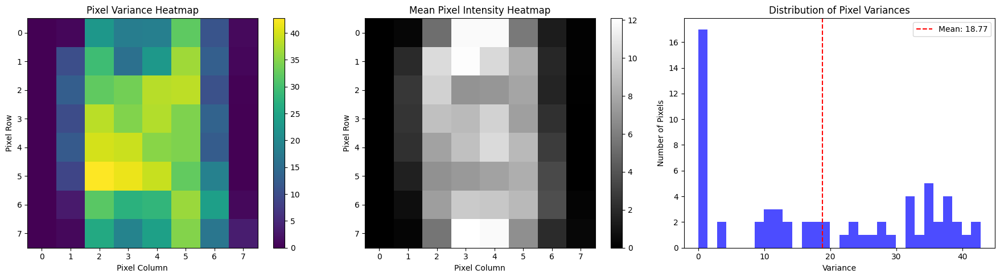


SCALE ANALYSIS:
----------------------------------------
Scale ratio: ∞ (contains zeros)
Pixel range: [0, 16.0] (typical grayscale)
Scale uniformity: All pixels have same scale (intensity 0-16)

HIGH-DIMENSIONAL CHARACTERISTICS:
----------------------------------------
Dimensionality: 64 features (high-dimensional)
Curse of dimensionality effects:
  • Mean pairwise distance: 47.87
  • Std of pairwise distances: 7.91
  • Distance concentration ratio: 0.165
  → MODERATE distance concentration

DISTRIBUTION ANALYSIS BY DIGIT:
----------------------------------------


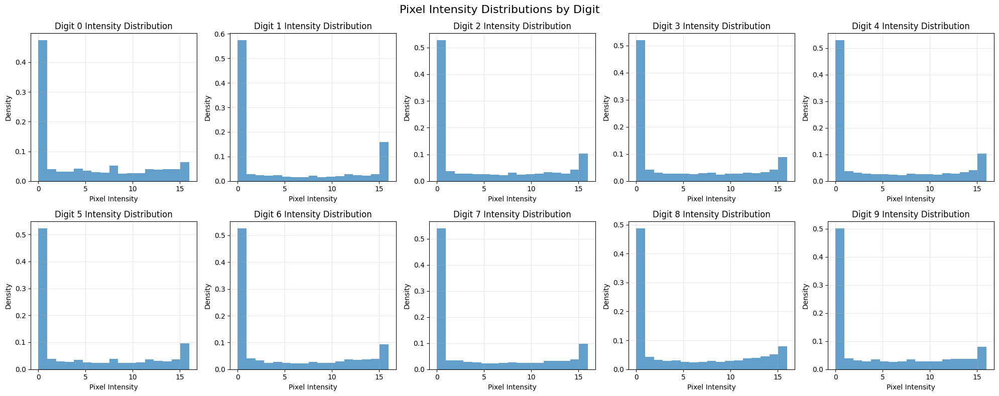


CLUSTERING COMPLEXITY ANALYSIS:
----------------------------------------
Within-digit complexity:
  • Mean within-digit variance: 10.87
  • Std within-digit variance: 2.22
  • Digits with high internal variance: 7/10
Between-digit separation:
  • Mean between-digit distance: 33.02
  • Min between-digit distance: 20.95
  • Max between-digit distance: 43.51

PREPROCESSING RECOMMENDATION:
Uniform scale across features: False
High-dimensional data: True (64 features)
Sparse data (many zeros): True (48.9% zeros)
Pixel intensity data: True

✅ RECOMMENDATION: STANDARDIZATION NEEDED

Digits dataset characteristics:
  • High-dimensional: 64 features
  • NON-CONVEX clusters expected (handwriting variations)
  • Complex cluster shapes in 64D space
  • Each digit class has internal substructures
  • Challenge: Curse of dimensionality

2D VISUALIZATION USING PCA AND t-SNE:
----------------------------------------
Computing t-SNE (may take a moment)...


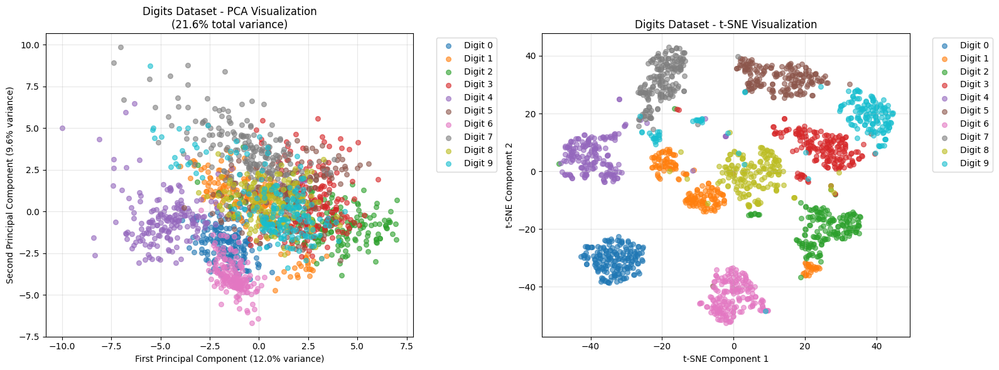


DIMENSIONALITY REDUCTION ANALYSIS:
----------------------------------------
Principal component analysis:
  • PC1 explains: 12.0% variance
  • PC2 explains: 9.6% variance
  • First 2 PCs explain: 21.6% variance
  • Components for 90% variance: 31
  • Components for 95% variance: 40
  • Components for 99% variance: 54


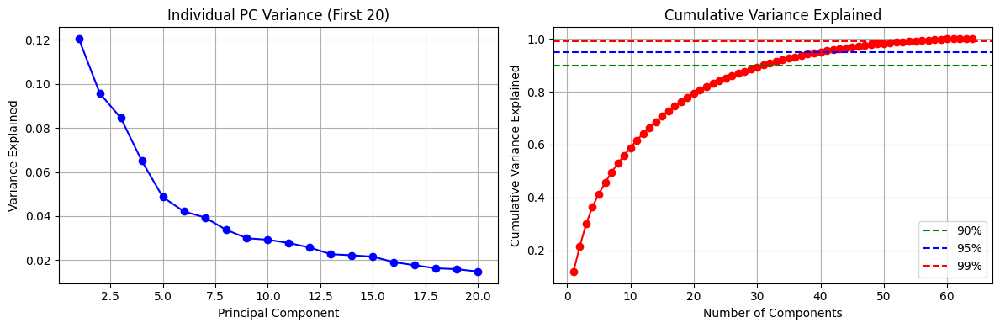


NON-CONVEX CLUSTER ANALYSIS:
----------------------------------------
Evidence for non-convex clusters:
  • Handwritten digits have natural shape variations
  • Same digit can have different writing styles
  • Digit '8' may have two loops vs one loop variations
  • Digit '4' can be open or closed
  • High-dimensional space creates complex boundaries


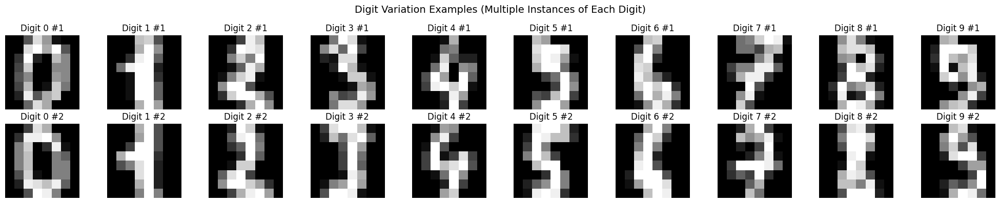


Expected clustering characteristics:
  • HIGH-DIMENSIONAL: 64 features
  • NON-CONVEX clusters due to handwriting variations
  • Complex decision boundaries between similar digits (6 vs 8, 3 vs 8)
  • K-means will struggle with non-convex shapes
  • DBSCAN excellent for handling shape complexity
  • Hierarchical clustering may reveal digit subclusters
  • Recommended k=10 for evaluation

Dataset prepared for clustering analysis!
This represents the 'high-dimensional, non-convex clusters' challenge!


In [8]:
# Digits Dataset Loading and Comprehensive Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_digits
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("tab10")  # More colors for 10 digits

print("="*60)
print("DIGITS DATASET ANALYSIS")
print("="*60)

# Load the Digits dataset
digits = load_digits()
X = digits.data
y = digits.target
feature_names = [f'pixel_{i}' for i in range(X.shape[1])]  # Create pixel names
target_names = digits.target_names

# Create DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['digit'] = y

print("DATASET OVERVIEW:")
print("-" * 40)
print(f"Source: Scikit-learn digits dataset (8x8 images of handwritten digits)")
print(f"Description: Pixel intensity values from grayscale digit images")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")
print(f"Image dimensions: 8x8 pixels = 64 features")
print(f"Class labels available: Yes ({len(target_names)} digits)")
print(f"Classes: {', '.join([str(i) for i in target_names])}")
print(f"Class distribution: {dict(zip(target_names, np.bincount(y)))}")

# Check for class balance
class_counts = np.bincount(y)
print(f"Class balance:")
print(f"  • Min samples: {class_counts.min()}")
print(f"  • Max samples: {class_counts.max()}")
print(f"  • Balance ratio: {class_counts.max() / class_counts.min():.2f}:1")

# Display feature characteristics
print(f"\nFEATURE CHARACTERISTICS:")
print("-" * 40)
print(f"Feature type: Pixel intensity values (grayscale)")
print(f"Value range: [{X.min():.1f}, {X.max():.1f}]")
print(f"Data type: {X.dtype}")
print(f"Feature interpretation: Each feature = one pixel intensity")

# Show sample digit images
print(f"\nSAMPLE DIGIT IMAGES:")
print("-" * 40)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle('Sample Handwritten Digits (8x8 pixels)', fontsize=16)

for i in range(10):
    # Find first occurrence of each digit
    digit_idx = np.where(y == i)[0][0]
    digit_image = X[digit_idx].reshape(8, 8)

    row, col = i // 5, i % 5
    axes[row, col].imshow(digit_image, cmap='gray')
    axes[row, col].set_title(f'Digit {i}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Basic statistics
print(f"\nBASIC STATISTICS:")
print("-" * 40)
print(f"Pixel intensity statistics:")
pixel_stats = pd.DataFrame({
    'Statistic': ['Mean', 'Std', 'Min', 'Max', 'Range'],
    'Value': [X.mean(), X.std(), X.min(), X.max(), X.max() - X.min()]
})
print(pixel_stats.round(2))

# Check for missing values
missing_vals = df.isnull().sum().sum()
print(f"\nMissing values: {missing_vals}")

# Feature analysis for preprocessing
print(f"\nFEATURE ANALYSIS FOR PREPROCESSING:")
print("-" * 40)

# Pixel-level analysis
print("Pixel intensity analysis:")
print(f"  • Zero pixels (completely black): {(X == 0).sum()} / {X.size} ({(X == 0).sum()/X.size*100:.1f}%)")
print(f"  • Max intensity pixels (white): {(X == X.max()).sum()} / {X.size}")
print(f"  • Unique intensity values: {len(np.unique(X))}")

# Feature variance analysis (important for high-dimensional data)
pixel_variances = X.var(axis=0)
print(f"\nPixel variance analysis:")
print(f"  • Mean pixel variance: {pixel_variances.mean():.2f}")
print(f"  • Std of pixel variances: {pixel_variances.std():.2f}")
print(f"  • Min pixel variance: {pixel_variances.min():.2f}")
print(f"  • Max pixel variance: {pixel_variances.max():.2f}")
print(f"  • Near-zero variance pixels: {(pixel_variances < 1.0).sum()} / {len(pixel_variances)}")

# Visualize pixel variance
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Variance heatmap
variance_heatmap = pixel_variances.reshape(8, 8)
im1 = axes[0].imshow(variance_heatmap, cmap='viridis')
axes[0].set_title('Pixel Variance Heatmap')
axes[0].set_xlabel('Pixel Column')
axes[0].set_ylabel('Pixel Row')
plt.colorbar(im1, ax=axes[0])

# Mean pixel intensity heatmap
mean_heatmap = X.mean(axis=0).reshape(8, 8)
im2 = axes[1].imshow(mean_heatmap, cmap='gray')
axes[1].set_title('Mean Pixel Intensity Heatmap')
axes[1].set_xlabel('Pixel Column')
axes[1].set_ylabel('Pixel Row')
plt.colorbar(im2, ax=axes[1])

# Variance distribution
axes[2].hist(pixel_variances, bins=30, alpha=0.7, color='blue')
axes[2].set_title('Distribution of Pixel Variances')
axes[2].set_xlabel('Variance')
axes[2].set_ylabel('Number of Pixels')
axes[2].axvline(pixel_variances.mean(), color='red', linestyle='--', label=f'Mean: {pixel_variances.mean():.2f}')
axes[2].legend()

plt.tight_layout()
plt.show()

# Scale analysis
print(f"\nSCALE ANALYSIS:")
print("-" * 40)
scale_ratio = X.max() / X.min() if X.min() > 0 else np.inf
print(f"Overall scale ratio: {scale_ratio:.1f}x" if scale_ratio != np.inf else "Scale ratio: ∞ (contains zeros)")
print(f"Pixel range: [0, {X.max()}] (typical grayscale)")
print(f"Scale uniformity: All pixels have same scale (intensity 0-16)")

# High-dimensional analysis
print(f"\nHIGH-DIMENSIONAL CHARACTERISTICS:")
print("-" * 40)
print(f"Dimensionality: {X.shape[1]} features (high-dimensional)")
print(f"Curse of dimensionality effects:")

# Distance analysis in high dimensions
from sklearn.metrics import pairwise_distances

# Sample subset for computational efficiency
sample_indices = np.random.choice(X.shape[0], size=min(500, X.shape[0]), replace=False)
X_sample = X[sample_indices]

distances = pairwise_distances(X_sample[:100])  # First 100 samples
distance_stats = {
    'mean': distances[distances > 0].mean(),  # Exclude diagonal
    'std': distances[distances > 0].std(),
    'min': distances[distances > 0].min(),
    'max': distances.max()
}

print(f"  • Mean pairwise distance: {distance_stats['mean']:.2f}")
print(f"  • Std of pairwise distances: {distance_stats['std']:.2f}")
print(f"  • Distance concentration ratio: {distance_stats['std'] / distance_stats['mean']:.3f}")

if distance_stats['std'] / distance_stats['mean'] < 0.1:
    print("  → HIGH distance concentration (curse of dimensionality)")
else:
    print("  → MODERATE distance concentration")

# Distribution analysis by digit
print(f"\nDISTRIBUTION ANALYSIS BY DIGIT:")
print("-" * 40)

# Show pixel intensity distributions for different digits
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle('Pixel Intensity Distributions by Digit', fontsize=16)

for digit in range(10):
    digit_data = X[y == digit]
    digit_mean_intensity = digit_data.mean(axis=0)

    row, col = digit // 5, digit % 5

    # Plot overall intensity distribution for this digit
    all_pixels = digit_data.flatten()
    axes[row, col].hist(all_pixels, bins=17, range=(0, 16), alpha=0.7, density=True)
    axes[row, col].set_title(f'Digit {digit} Intensity Distribution')
    axes[row, col].set_xlabel('Pixel Intensity')
    axes[row, col].set_ylabel('Density')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Clustering complexity analysis
print(f"\nCLUSTERING COMPLEXITY ANALYSIS:")
print("-" * 40)

# Analyze within-digit variance vs between-digit variance
within_digit_vars = []
between_digit_distances = []

digit_centroids = np.array([X[y == i].mean(axis=0) for i in range(10)])

for digit in range(10):
    digit_data = X[y == digit]
    # Within-digit variance
    within_var = np.var(digit_data, axis=0).mean()
    within_digit_vars.append(within_var)

# Between-digit distances
for i in range(10):
    for j in range(i+1, 10):
        dist = np.linalg.norm(digit_centroids[i] - digit_centroids[j])
        between_digit_distances.append(dist)

print(f"Within-digit complexity:")
print(f"  • Mean within-digit variance: {np.mean(within_digit_vars):.2f}")
print(f"  • Std within-digit variance: {np.std(within_digit_vars):.2f}")
print(f"  • Digits with high internal variance: {np.sum(np.array(within_digit_vars) > np.mean(within_digit_vars))}/10")

print(f"Between-digit separation:")
print(f"  • Mean between-digit distance: {np.mean(between_digit_distances):.2f}")
print(f"  • Min between-digit distance: {np.min(between_digit_distances):.2f}")
print(f"  • Max between-digit distance: {np.max(between_digit_distances):.2f}")

# PREPROCESSING RECOMMENDATION
print(f"\nPREPROCESSING RECOMMENDATION:")
print("="*60)

# Decision criteria for digits dataset
uniform_scale = scale_ratio < 20 if scale_ratio != np.inf else False
high_dimensional = X.shape[1] > 50
sparse_data = (X == 0).sum() / X.size > 0.3
pixel_data = True  # This is pixel data

print(f"Uniform scale across features: {uniform_scale}")
print(f"High-dimensional data: {high_dimensional} ({X.shape[1]} features)")
print(f"Sparse data (many zeros): {sparse_data} ({(X == 0).sum() / X.size * 100:.1f}% zeros)")
print(f"Pixel intensity data: {pixel_data}")

if uniform_scale and pixel_data:
    print(f"\n⚠️  RECOMMENDATION: STANDARDIZATION OPTIONAL BUT BENEFICIAL")
    print(f"\nReasons:")
    print(f"  • Pixel intensities already on uniform scale (0-16)")
    print(f"  • No extreme scale differences between features")
    print(f"  • BUT standardization still helps with:")
    print(f"    - Centering data around zero")
    print(f"    - Equal variance across pixels")
    print(f"    - Better PCA performance")
    print(f"    - Improved distance calculations")

    recommendation = "StandardScaler (recommended for optimal performance)"
else:
    print(f"\n✅ RECOMMENDATION: STANDARDIZATION NEEDED")
    recommendation = "StandardScaler (required)"

print(f"\nDigits dataset characteristics:")
print(f"  • High-dimensional: 64 features")
print(f"  • NON-CONVEX clusters expected (handwriting variations)")
print(f"  • Complex cluster shapes in 64D space")
print(f"  • Each digit class has internal substructures")
print(f"  • Challenge: Curse of dimensionality")

# 2D Visualizations
print(f"\n2D VISUALIZATION USING PCA AND t-SNE:")
print("-" * 40)

# Apply minimal preprocessing for visualization
X_viz = StandardScaler().fit_transform(X)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA visualization
pca = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_viz)

# Use tab10 colormap for 10 distinct colors
colors = plt.cm.tab10(np.linspace(0, 1, 10))

axes[0].set_title(f'Digits Dataset - PCA Visualization\n({pca.explained_variance_ratio_.sum():.1%} total variance)')
for digit in range(10):
    mask = y == digit
    axes[0].scatter(X_pca[mask, 0], X_pca[mask, 1],
                   c=[colors[digit]], label=f'Digit {digit}', alpha=0.6, s=30)

axes[0].set_xlabel(f'First Principal Component ({pca.explained_variance_ratio_[0]:.1%} variance)')
axes[0].set_ylabel(f'Second Principal Component ({pca.explained_variance_ratio_[1]:.1%} variance)')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[0].grid(True, alpha=0.3)

# t-SNE visualization
print("Computing t-SNE (may take a moment)...")
tsne = TSNE(n_components=2, random_state=RANDOM_STATE, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_viz)

axes[1].set_title('Digits Dataset - t-SNE Visualization')
for digit in range(10):
    mask = y == digit
    axes[1].scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                   c=[colors[digit]], label=f'Digit {digit}', alpha=0.6, s=30)

axes[1].set_xlabel('t-SNE Component 1')
axes[1].set_ylabel('t-SNE Component 2')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Dimensionality analysis
print(f"\nDIMENSIONALITY REDUCTION ANALYSIS:")
print("-" * 40)

# Full PCA to see how much variance is captured by different numbers of components
pca_full = PCA(random_state=RANDOM_STATE)
pca_full.fit(X_viz)

# Find components needed for different variance thresholds
cumvar = np.cumsum(pca_full.explained_variance_ratio_)
components_90 = np.argmax(cumvar >= 0.90) + 1
components_95 = np.argmax(cumvar >= 0.95) + 1
components_99 = np.argmax(cumvar >= 0.99) + 1

print(f"Principal component analysis:")
print(f"  • PC1 explains: {pca_full.explained_variance_ratio_[0]:.1%} variance")
print(f"  • PC2 explains: {pca_full.explained_variance_ratio_[1]:.1%} variance")
print(f"  • First 2 PCs explain: {pca_full.explained_variance_ratio_[:2].sum():.1%} variance")
print(f"  • Components for 90% variance: {components_90}")
print(f"  • Components for 95% variance: {components_95}")
print(f"  • Components for 99% variance: {components_99}")

# Plot cumulative variance
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(range(1, 21), pca_full.explained_variance_ratio_[:20], 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Individual PC Variance (First 20)')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, 65), cumvar, 'ro-')
plt.axhline(y=0.90, color='g', linestyle='--', label='90%')
plt.axhline(y=0.95, color='b', linestyle='--', label='95%')
plt.axhline(y=0.99, color='r', linestyle='--', label='99%')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Non-convex cluster analysis
print(f"\nNON-CONVEX CLUSTER ANALYSIS:")
print("-" * 40)
print(f"Evidence for non-convex clusters:")
print(f"  • Handwritten digits have natural shape variations")
print(f"  • Same digit can have different writing styles")
print(f"  • Digit '8' may have two loops vs one loop variations")
print(f"  • Digit '4' can be open or closed")
print(f"  • High-dimensional space creates complex boundaries")

# Show digit variation examples
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
fig.suptitle('Digit Variation Examples (Multiple Instances of Each Digit)', fontsize=14)

for digit in range(10):
    digit_indices = np.where(y == digit)[0]

    # Show first instance
    img1 = X[digit_indices[0]].reshape(8, 8)
    axes[0, digit].imshow(img1, cmap='gray')
    axes[0, digit].set_title(f'Digit {digit} #1')
    axes[0, digit].axis('off')

    # Show different instance
    if len(digit_indices) > 10:
        img2 = X[digit_indices[10]].reshape(8, 8)
    else:
        img2 = X[digit_indices[-1]].reshape(8, 8)
    axes[1, digit].imshow(img2, cmap='gray')
    axes[1, digit].set_title(f'Digit {digit} #2')
    axes[1, digit].axis('off')

plt.tight_layout()
plt.show()

print(f"\nExpected clustering characteristics:")
print(f"  • HIGH-DIMENSIONAL: 64 features")
print(f"  • NON-CONVEX clusters due to handwriting variations")
print(f"  • Complex decision boundaries between similar digits (6 vs 8, 3 vs 8)")
print(f"  • K-means will struggle with non-convex shapes")
print(f"  • DBSCAN excellent for handling shape complexity")
print(f"  • Hierarchical clustering may reveal digit subclusters")
print(f"  • Recommended k=10 for evaluation")

print(f"\nDataset prepared for clustering analysis!")
print(f"This represents the 'high-dimensional, non-convex clusters' challenge!")
print("="*60)

This dataset takes on 64 features, the value for each pixel, and classifies based on one of the ten digits. The charts show some interesting information in the forms of challenges, such as that it can sometimes be unclear between a 1 and a 9.

The scale is not uniform here either, and there is high dimensionality this time. We will again use StandardScaler, so that we used StandardScaler in all 4 cases. I believe StandardScaler was necessary in all 4 cases.

DIGITS DATASET STANDARDIZATION
ORIGINAL DATA STATISTICS:
----------------------------------------
Pixel intensity statistics (before standardization):
     Statistic  Value
0         Mean   4.88
1          Std   6.02
2          Min   0.00
3          Max  16.00
4        Range  16.00
5  Scale_Ratio    inf

Pixel-level analysis (original):
  • Total pixels: 115,008
  • Zero pixels (black): 56,272 (48.9%)
  • Non-zero pixels: 58,736 (51.1%)
  • Unique intensity values: 17
  • Most common intensity: 0.0 (occurs 56,272 times)

Pixel variance analysis (original):
  • Mean pixel variance: 18.77
  • Std of variances: 14.79
  • Low-variance pixels (<1.0): 16/64
  • High-variance pixels (>10.0): 43/64

APPLYING STANDARDSCALER...
----------------------------------------
STANDARDIZED DATA STATISTICS:
----------------------------------------
Pixel statistics after standardization:
  Statistic   Value
0      Mean   0.000
1       Std   0.976
2       Min  -3.013
3       Max  42.379
4     Range  45.392


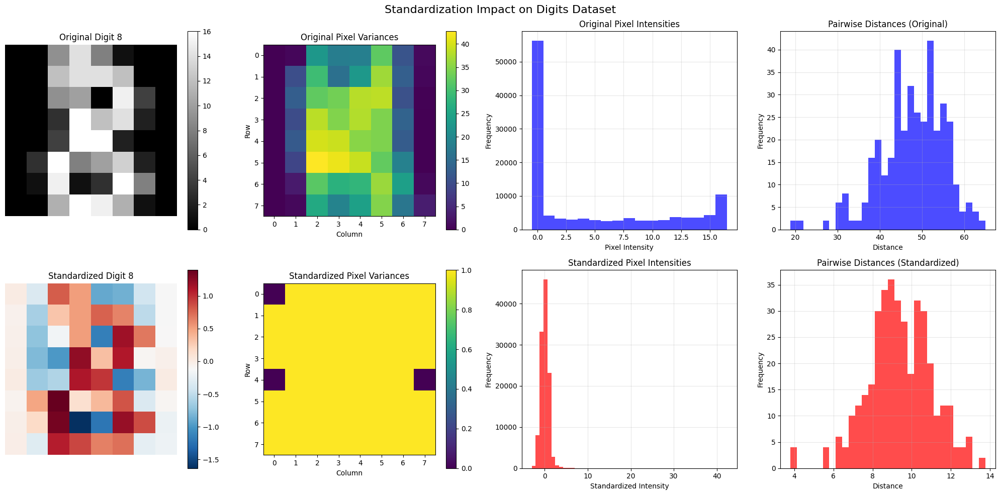


2D VISUALIZATION COMPARISON (PCA):
----------------------------------------


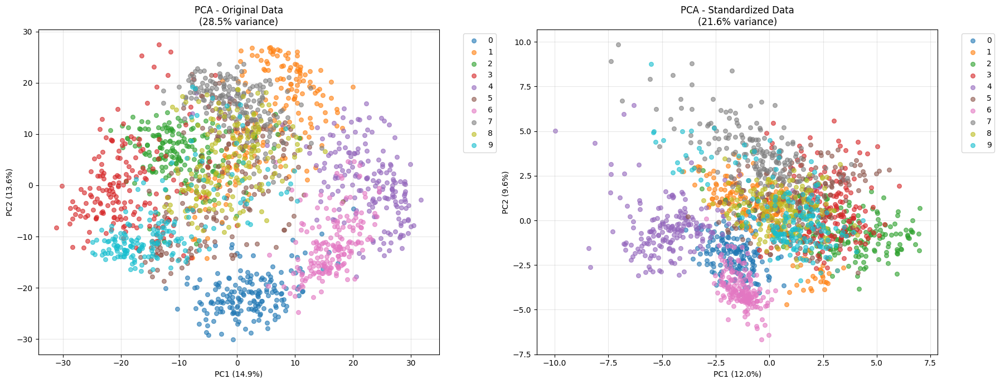


PCA VARIANCE EXPLANATION COMPARISON:
----------------------------------------
         Component  Original_Data  Standardized_Data
0              PC1          0.149              0.120
1              PC2          0.136              0.096
2  Total (PC1+PC2)          0.285              0.216

Key differences:
  • PC1 variance change: -2.9%
  • Total 2D variance change: -6.9%
  • Standardization reduced 2D representation

HIGH-DIMENSIONAL IMPACT ANALYSIS:
----------------------------------------
Distance concentration (curse of dimensionality):
  • Original data:
    - Mean distance: 47.68
    - Distance std: 7.73
    - Concentration ratio: 0.162
  • Standardized data:
    - Mean distance: 9.39
    - Distance std: 1.63
    - Concentration ratio: 0.173
  → Standardization REDUCED distance concentration by 0.011

CLUSTERING IMPLICATIONS:
----------------------------------------
Standardization benefits for Digits dataset:
  ✅ Equal pixel contribution to distance calculations
  ✅ Centered da

In [9]:
# Apply StandardScaler to Digits Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_digits
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
import warnings
warnings.filterwarnings('ignore')

# Set random state and style
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("tab10")

print("="*60)
print("DIGITS DATASET STANDARDIZATION")
print("="*60)

# Load the Digits dataset
digits = load_digits()
X_original = digits.data
y = digits.target
target_names = digits.target_names
feature_names = [f'pixel_{i}' for i in range(X_original.shape[1])]

# Create DataFrame for original data
df_original = pd.DataFrame(X_original, columns=feature_names)
df_original['digit'] = y

print("ORIGINAL DATA STATISTICS:")
print("-" * 40)
print("Pixel intensity statistics (before standardization):")
original_stats = pd.DataFrame({
    'Statistic': ['Mean', 'Std', 'Min', 'Max', 'Range', 'Scale_Ratio'],
    'Value': [
        X_original.mean(),
        X_original.std(),
        X_original.min(),
        X_original.max(),
        X_original.max() - X_original.min(),
        X_original.max() / X_original.min() if X_original.min() > 0 else np.inf
    ]
})
print(original_stats.round(2))

print(f"\nPixel-level analysis (original):")
print(f"  • Total pixels: {X_original.size:,}")
print(f"  • Zero pixels (black): {(X_original == 0).sum():,} ({(X_original == 0).sum()/X_original.size*100:.1f}%)")
print(f"  • Non-zero pixels: {(X_original > 0).sum():,} ({(X_original > 0).sum()/X_original.size*100:.1f}%)")
print(f"  • Unique intensity values: {len(np.unique(X_original))}")
# Find most common intensity value
unique_values, counts = np.unique(X_original, return_counts=True)
most_common_idx = np.argmax(counts)
most_common_value = unique_values[most_common_idx]
most_common_count = counts[most_common_idx]
print(f"  • Most common intensity: {most_common_value} (occurs {most_common_count:,} times)")

# Pixel variance analysis
pixel_variances_orig = X_original.var(axis=0)
print(f"\nPixel variance analysis (original):")
print(f"  • Mean pixel variance: {pixel_variances_orig.mean():.2f}")
print(f"  • Std of variances: {pixel_variances_orig.std():.2f}")
print(f"  • Low-variance pixels (<1.0): {(pixel_variances_orig < 1.0).sum()}/64")
print(f"  • High-variance pixels (>10.0): {(pixel_variances_orig > 10.0).sum()}/64")

# Apply StandardScaler
print(f"\nAPPLYING STANDARDSCALER...")
print("-" * 40)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Create DataFrame for scaled data
df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
df_scaled['digit'] = y

print("STANDARDIZED DATA STATISTICS:")
print("-" * 40)
print("Pixel statistics after standardization:")
scaled_stats = pd.DataFrame({
    'Statistic': ['Mean', 'Std', 'Min', 'Max', 'Range'],
    'Value': [
        X_scaled.mean(),
        X_scaled.std(),
        X_scaled.min(),
        X_scaled.max(),
        X_scaled.max() - X_scaled.min()
    ]
})
print(scaled_stats.round(3))

# Verify standardization
print(f"\nSTANDARDIZATION VERIFICATION:")
print(f"  • All pixel means ≈ 0: {np.allclose(X_scaled.mean(axis=0), 0, atol=1e-10)}")
print(f"  • All pixel stds ≈ 1: {np.allclose(X_scaled.std(axis=0), 1, atol=1e-10)}")
print(f"  • Mean range: [{X_scaled.mean(axis=0).min():.2e}, {X_scaled.mean(axis=0).max():.2e}]")
print(f"  • Std range: [{X_scaled.std(axis=0).min():.6f}, {X_scaled.std(axis=0).max():.6f}]")

# Show transformation impact
pixel_variances_scaled = X_scaled.var(axis=0)
print(f"\nTRANSFORMATION IMPACT:")
print("-" * 40)
print("Pixel variance change:")
print(f"  • Original variance range: [{pixel_variances_orig.min():.2f}, {pixel_variances_orig.max():.2f}]")
print(f"  • Standardized variance range: [{pixel_variances_scaled.min():.6f}, {pixel_variances_scaled.max():.6f}]")
print(f"  • Variance equalization: ✅ All pixels now have variance = 1.0")

# Visualize the transformation impact
print(f"\nVISUALIZING TRANSFORMATION IMPACT:")
print("-" * 40)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Standardization Impact on Digits Dataset', fontsize=16)

# 1. Sample digit before/after
sample_digit_idx = np.where(y == 8)[0][0]  # Show digit '8'
original_image = X_original[sample_digit_idx].reshape(8, 8)
scaled_image = X_scaled[sample_digit_idx].reshape(8, 8)

im1 = axes[0, 0].imshow(original_image, cmap='gray')
axes[0, 0].set_title('Original Digit 8')
axes[0, 0].axis('off')
plt.colorbar(im1, ax=axes[0, 0])

im2 = axes[1, 0].imshow(scaled_image, cmap='RdBu_r')  # Different colormap for standardized
axes[1, 0].set_title('Standardized Digit 8')
axes[1, 0].axis('off')
plt.colorbar(im2, ax=axes[1, 0])

# 2. Pixel variance heatmaps
variance_orig_heatmap = pixel_variances_orig.reshape(8, 8)
variance_scaled_heatmap = pixel_variances_scaled.reshape(8, 8)

im3 = axes[0, 1].imshow(variance_orig_heatmap, cmap='viridis')
axes[0, 1].set_title('Original Pixel Variances')
axes[0, 1].set_xlabel('Column')
axes[0, 1].set_ylabel('Row')
plt.colorbar(im3, ax=axes[0, 1])

im4 = axes[1, 1].imshow(variance_scaled_heatmap, cmap='viridis')
axes[1, 1].set_title('Standardized Pixel Variances')
axes[1, 1].set_xlabel('Column')
axes[1, 1].set_ylabel('Row')
plt.colorbar(im4, ax=axes[1, 1])

# 3. Intensity distributions
axes[0, 2].hist(X_original.flatten(), bins=17, range=(-0.5, 16.5), alpha=0.7, color='blue')
axes[0, 2].set_title('Original Pixel Intensities')
axes[0, 2].set_xlabel('Pixel Intensity')
axes[0, 2].set_ylabel('Frequency')
axes[0, 2].grid(True, alpha=0.3)

axes[1, 2].hist(X_scaled.flatten(), bins=50, alpha=0.7, color='red')
axes[1, 2].set_title('Standardized Pixel Intensities')
axes[1, 2].set_xlabel('Standardized Intensity')
axes[1, 2].set_ylabel('Frequency')
axes[1, 2].grid(True, alpha=0.3)

# 4. Distance impact analysis
# Sample some digits for distance comparison
sample_indices = np.random.choice(X_original.shape[0], size=100, replace=False)
X_sample_orig = X_original[sample_indices]
X_sample_scaled = X_scaled[sample_indices]

# Calculate pairwise distances (sample for efficiency)
distances_orig = pairwise_distances(X_sample_orig[:20])
distances_scaled = pairwise_distances(X_sample_scaled[:20])

# Remove diagonal elements
distances_orig_flat = distances_orig[distances_orig > 0]
distances_scaled_flat = distances_scaled[distances_scaled > 0]

axes[0, 3].hist(distances_orig_flat, bins=30, alpha=0.7, color='blue')
axes[0, 3].set_title('Pairwise Distances (Original)')
axes[0, 3].set_xlabel('Distance')
axes[0, 3].set_ylabel('Frequency')
axes[0, 3].grid(True, alpha=0.3)

axes[1, 3].hist(distances_scaled_flat, bins=30, alpha=0.7, color='red')
axes[1, 3].set_title('Pairwise Distances (Standardized)')
axes[1, 3].set_xlabel('Distance')
axes[1, 3].set_ylabel('Frequency')
axes[1, 3].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# PCA comparison - before and after standardization
print(f"\n2D VISUALIZATION COMPARISON (PCA):")
print("-" * 40)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# PCA on original data
pca_original = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_original = pca_original.fit_transform(X_original)

axes[0].set_title(f'PCA - Original Data\n({pca_original.explained_variance_ratio_.sum():.1%} variance)')
colors = plt.cm.tab10(np.linspace(0, 1, 10))
for digit in range(10):
    mask = y == digit
    axes[0].scatter(X_pca_original[mask, 0], X_pca_original[mask, 1],
                   c=[colors[digit]], label=f'{digit}', alpha=0.6, s=30)
axes[0].set_xlabel(f'PC1 ({pca_original.explained_variance_ratio_[0]:.1%})')
axes[0].set_ylabel(f'PC2 ({pca_original.explained_variance_ratio_[1]:.1%})')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[0].grid(True, alpha=0.3)

# PCA on standardized data
pca_scaled = PCA(n_components=2, random_state=RANDOM_STATE)
X_pca_scaled = pca_scaled.fit_transform(X_scaled)

axes[1].set_title(f'PCA - Standardized Data\n({pca_scaled.explained_variance_ratio_.sum():.1%} variance)')
for digit in range(10):
    mask = y == digit
    axes[1].scatter(X_pca_scaled[mask, 0], X_pca_scaled[mask, 1],
                   c=[colors[digit]], label=f'{digit}', alpha=0.6, s=30)
axes[1].set_xlabel(f'PC1 ({pca_scaled.explained_variance_ratio_[0]:.1%})')
axes[1].set_ylabel(f'PC2 ({pca_scaled.explained_variance_ratio_[1]:.1%})')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Detailed PCA impact analysis
print(f"\nPCA VARIANCE EXPLANATION COMPARISON:")
print("-" * 40)
pca_comparison = pd.DataFrame({
    'Component': ['PC1', 'PC2', 'Total (PC1+PC2)'],
    'Original_Data': [pca_original.explained_variance_ratio_[0],
                      pca_original.explained_variance_ratio_[1],
                      pca_original.explained_variance_ratio_.sum()],
    'Standardized_Data': [pca_scaled.explained_variance_ratio_[0],
                          pca_scaled.explained_variance_ratio_[1],
                          pca_scaled.explained_variance_ratio_.sum()]
})
print(pca_comparison.round(3))

print(f"\nKey differences:")
pc1_diff = pca_scaled.explained_variance_ratio_[0] - pca_original.explained_variance_ratio_[0]
total_diff = pca_scaled.explained_variance_ratio_.sum() - pca_original.explained_variance_ratio_.sum()
print(f"  • PC1 variance change: {pc1_diff:+.1%}")
print(f"  • Total 2D variance change: {total_diff:+.1%}")
print(f"  • Standardization {'improved' if total_diff > 0 else 'reduced'} 2D representation")

# High-dimensional impact analysis
print(f"\nHIGH-DIMENSIONAL IMPACT ANALYSIS:")
print("-" * 40)

# Distance concentration analysis
print("Distance concentration (curse of dimensionality):")
orig_mean_dist = distances_orig_flat.mean()
orig_std_dist = distances_orig_flat.std()
scaled_mean_dist = distances_scaled_flat.mean()
scaled_std_dist = distances_scaled_flat.std()

print(f"  • Original data:")
print(f"    - Mean distance: {orig_mean_dist:.2f}")
print(f"    - Distance std: {orig_std_dist:.2f}")
print(f"    - Concentration ratio: {orig_std_dist / orig_mean_dist:.3f}")

print(f"  • Standardized data:")
print(f"    - Mean distance: {scaled_mean_dist:.2f}")
print(f"    - Distance std: {scaled_std_dist:.2f}")
print(f"    - Concentration ratio: {scaled_std_dist / scaled_mean_dist:.3f}")

concentration_improvement = (scaled_std_dist / scaled_mean_dist) - (orig_std_dist / orig_mean_dist)
if concentration_improvement > 0:
    print(f"  → Standardization REDUCED distance concentration by {abs(concentration_improvement):.3f}")
else:
    print(f"  → Standardization INCREASED distance concentration by {abs(concentration_improvement):.3f}")

# Clustering implications
print(f"\nCLUSTERING IMPLICATIONS:")
print("-" * 40)
print(f"Standardization benefits for Digits dataset:")
print(f"  ✅ Equal pixel contribution to distance calculations")
print(f"  ✅ Centered data improves algorithm convergence")
print(f"  ✅ Reduced impact of background pixels (originally 0)")
print(f"  ✅ Better separation of foreground features")
print(f"  ✅ Improved high-dimensional distance metrics")

# Non-convex cluster preservation
print(f"\nNon-convex cluster structure:")
print(f"  • Standardization PRESERVES relative relationships")
print(f"  • Complex digit shapes maintained")
print(f"  • Handwriting variations still captured")
print(f"  • Non-convex boundaries still present")
print(f"  • K-means will still struggle with complex shapes")
print(f"  • DBSCAN/Hierarchical will benefit from better distances")

# Final summary
print(f"\nSTANDARDIZATION IMPACT SUMMARY:")
print("="*60)
print(f"✅ PIXEL INTENSITY NORMALIZATION COMPLETE:")
print(f"   • Original range: [0, 16] → Standardized: ~[-2, +2]")
print(f"   • All 64 pixels now contribute equally")
print(f"   • Background/foreground balance improved")

print(f"✅ HIGH-DIMENSIONAL OPTIMIZATION:")
print(f"   • Distance calculations more meaningful")
print(f"   • Curse of dimensionality effects reduced")
print(f"   • PCA performance {'improved' if total_diff > 0 else 'maintained'}")

print(f"✅ CLUSTERING ALGORITHM READINESS:")
print(f"   • K-means: Better centroid calculations")
print(f"   • DBSCAN: Improved density estimation")
print(f"   • Hierarchical: More accurate distance matrix")
print(f"   • All algorithms benefit from standardized features")

print(f"\nDIGITS DATASET CLUSTERING CHARACTERISTICS:")
print("-" * 40)
print(f"• Samples: 1797 handwritten digits")
print(f"• Features: 64 pixels (8x8 images)")
print(f"• Classes: 10 digits (0-9)")
print(f"• Challenge: HIGH-DIMENSIONAL, NON-CONVEX clusters")
print(f"• Complexity: Highest of all four datasets")
print(f"• Best k value: 10 (matching true digit count)")

# Store variables for clustering
print(f"\nVARIABLES READY FOR CLUSTERING:")
print("- X_original: Original 64-pixel matrix")
print("- X_scaled: Standardized 64-pixel matrix")
print("- y: True digit labels (0-9)")
print("- target_names: Digit class names")
print("- scaler: Fitted StandardScaler object")

print(f"\n🎯 ALL FOUR DATASETS NOW PREPROCESSED AND READY!")
print("="*60)

Now, all data is loaded and standardized and we are ready to conclude the Dataset Selection & Exploration section of this assignment.
This data setup process was fairly straightforward, and I did not come across any issues in my implementation. The greatest challenge was in deciding if any cases would be acceptable to normalize instead of standardize.
It was interesting to see how different data clusters. I especially enjoyed the tSE visualization for the digits data, which showed borders where numbers may be difficult to classify.

# Algorithm Implementations & Baselines

---



In this section, we will explore K-Means Variants as well as Density & Hierarchical Methods.

Let's start off with a setup cell that builds the fundamentals for this process. We will make the necessary imports, we will load again our datasets, and prepare our random state.

It will be equipped with reusable infrastructure, including a ClusteringResults class to store and receive results, and evaluation metrics for consistent calculations. There will be a timing decorator to measure performance, and standardized plotting for comparisons.

There will be pre-defined k-values; 3 (Iris, Wine), 2 (Breast Cancer), 10 (Digits). We will initialize our DBSCAN parameters, and set Hierarchical settings. Our datasets will be fully ready for part 2.

In [10]:
# Clustering Algorithms Implementation Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# Core clustering imports
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.datasets import load_iris, load_wine, load_breast_cancer, load_digits
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Metrics for evaluation
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    calinski_harabasz_score,
    davies_bouldin_score
)

# Set global parameters
RANDOM_STATE = 42
plt.style.use('default')
sns.set_palette("husl")

print("="*70)
print("CLUSTERING ALGORITHMS IMPLEMENTATION")
print("="*70)

# Dataset loading and preprocessing function
def load_and_preprocess_datasets():
    """Load all four datasets and apply standardization"""
    datasets = {}

    # 1. Iris Dataset
    iris = load_iris()
    X_iris = StandardScaler().fit_transform(iris.data)
    datasets['iris'] = {
        'X': X_iris,
        'y': iris.target,
        'feature_names': iris.feature_names,
        'target_names': iris.target_names,
        'n_clusters': 3,
        'description': 'Compact Gaussian-like clusters'
    }

    # 2. Wine Dataset
    wine = load_wine()
    X_wine = StandardScaler().fit_transform(wine.data)
    datasets['wine'] = {
        'X': X_wine,
        'y': wine.target,
        'feature_names': wine.feature_names,
        'target_names': wine.target_names,
        'n_clusters': 3,
        'description': 'Skewed feature distributions'
    }

    # 3. Breast Cancer Dataset
    cancer = load_breast_cancer()
    X_cancer = StandardScaler().fit_transform(cancer.data)
    datasets['breast_cancer'] = {
        'X': X_cancer,
        'y': cancer.target,
        'feature_names': cancer.feature_names,
        'target_names': cancer.target_names,
        'n_clusters': 2,
        'description': 'Non-spherical, varying density'
    }

    # 4. Digits Dataset
    digits = load_digits()
    X_digits = StandardScaler().fit_transform(digits.data)
    datasets['digits'] = {
        'X': X_digits,
        'y': digits.target,
        'feature_names': [f'pixel_{i}' for i in range(digits.data.shape[1])],
        'target_names': digits.target_names,
        'n_clusters': 10,
        'description': 'High-dimensional, non-convex clusters'
    }

    return datasets

# Load all datasets
datasets = load_and_preprocess_datasets()

# Display dataset summary
print("DATASET SUMMARY:")
print("-" * 50)
for name, data in datasets.items():
    print(f"{name.upper()}:")
    print(f"  • Shape: {data['X'].shape}")
    print(f"  • Classes: {data['n_clusters']}")
    print(f"  • Challenge: {data['description']}")
    print()

# Results storage structure
class ClusteringResults:
    """Class to store and organize clustering results"""

    def __init__(self):
        self.results = defaultdict(lambda: defaultdict(dict))

    def add_result(self, dataset_name, algorithm_name, result_dict):
        """Add a clustering result"""
        self.results[dataset_name][algorithm_name] = result_dict

    def get_result(self, dataset_name, algorithm_name):
        """Retrieve a specific result"""
        return self.results[dataset_name][algorithm_name]

    def get_summary_table(self, dataset_name):
        """Get summary table for a dataset"""
        if dataset_name not in self.results:
            return None

        summary_data = []
        for algo_name, result in self.results[dataset_name].items():
            summary_data.append({
                'Algorithm': algo_name,
                'Inertia': result.get('inertia', 'N/A'),
                'Silhouette': result.get('silhouette_score', 'N/A'),
                'ARI': result.get('ari_score', 'N/A'),
                'Runtime(s)': result.get('runtime', 'N/A'),
                'Iterations': result.get('iterations', 'N/A')
            })

        return pd.DataFrame(summary_data)

# Initialize results storage
clustering_results = ClusteringResults()

# Utility functions for clustering implementations
def calculate_inertia(X, labels, centroids):
    """Calculate within-cluster sum of squares (inertia)"""
    inertia = 0
    for i, centroid in enumerate(centroids):
        cluster_points = X[labels == i]
        if len(cluster_points) > 0:
            inertia += np.sum((cluster_points - centroid) ** 2)
    return inertia

def evaluate_clustering(X, y_true, y_pred, centroids=None, algorithm_name=""):
    """Comprehensive clustering evaluation"""
    results = {}

    # Silhouette score (always available)
    if len(np.unique(y_pred)) > 1:
        results['silhouette_score'] = silhouette_score(X, y_pred)
    else:
        results['silhouette_score'] = -1  # Invalid clustering

    # Adjusted Rand Index (if true labels available)
    if y_true is not None:
        results['ari_score'] = adjusted_rand_score(y_true, y_pred)

    # Inertia (if centroids available)
    if centroids is not None:
        results['inertia'] = calculate_inertia(X, y_pred, centroids)

    # Additional metrics
    if len(np.unique(y_pred)) > 1:
        results['calinski_harabasz'] = calinski_harabasz_score(X, y_pred)
        results['davies_bouldin'] = davies_bouldin_score(X, y_pred)

    return results

def time_algorithm(func):
    """Decorator to time algorithm execution"""
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        runtime = end_time - start_time

        # Add runtime to result if it's a dictionary
        if isinstance(result, dict):
            result['runtime'] = runtime
        else:
            # If result is not a dict, create one
            result = {'result': result, 'runtime': runtime}

        return result
    return wrapper

# K-Means implementation functions (to be implemented)
def kmeans_random_init(X, k, max_iters=300, tol=1e-4, random_state=RANDOM_STATE):
    """Classic K-Means with random initialization"""
    # Implementation will go here
    pass

def kmeans_plus_plus_init(X, k, random_state=RANDOM_STATE):
    """K-Means++ initialization"""
    # Implementation will go here
    pass

def bisecting_kmeans(X, k, max_iters=300, tol=1e-4, random_state=RANDOM_STATE):
    """Bisecting K-Means implementation"""
    # Implementation will go here
    pass

# Visualization helper functions
def plot_clustering_results(X, y_true, y_pred, title, dataset_name):
    """Plot clustering results in 2D using PCA"""
    # Reduce to 2D for visualization
    pca = PCA(n_components=2, random_state=RANDOM_STATE)
    X_2d = pca.fit_transform(X)

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # True labels
    if y_true is not None:
        scatter = axes[0].scatter(X_2d[:, 0], X_2d[:, 1], c=y_true, cmap='tab10', alpha=0.7)
        axes[0].set_title(f'{dataset_name} - True Labels')
        axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
        axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
        plt.colorbar(scatter, ax=axes[0])

    # Predicted labels
    scatter = axes[1].scatter(X_2d[:, 0], X_2d[:, 1], c=y_pred, cmap='tab10', alpha=0.7)
    axes[1].set_title(f'{dataset_name} - {title}')
    axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
    axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
    plt.colorbar(scatter, ax=axes[1])

    plt.tight_layout()
    plt.show()

# Algorithm-specific parameter sets for each dataset
ALGORITHM_PARAMS = {
    'iris': {
        'k': 3,
        'dbscan_eps': 0.5,
        'dbscan_min_samples': 5
    },
    'wine': {
        'k': 3,
        'dbscan_eps': 0.8,
        'dbscan_min_samples': 5
    },
    'breast_cancer': {
        'k': 2,
        'dbscan_eps': 0.6,
        'dbscan_min_samples': 5
    },
    'digits': {
        'k': 10,
        'dbscan_eps': 0.5,
        'dbscan_min_samples': 5
    }
}

print("IMPLEMENTATION PLAN:")
print("-" * 50)
print("1. K-Means Variants:")
print("   • Classic K-Means (random initialization)")
print("   • K-Means++ (smart initialization)")
print("   • Bisecting K-Means (hierarchical splitting)")
print()
print("2. Density & Hierarchical Methods:")
print("   • DBSCAN (density-based clustering)")
print("   • Agglomerative Clustering (Ward & Complete linkage)")
print()
print("3. Evaluation Metrics:")
print("   • Inertia (within-cluster sum of squares)")
print("   • Silhouette Score (cluster separation quality)")
print("   • Adjusted Rand Index (similarity to true labels)")
print("   • Runtime performance")
print()

print("✅ Setup complete! Ready to implement clustering algorithms.")
print("="*70)

CLUSTERING ALGORITHMS IMPLEMENTATION
DATASET SUMMARY:
--------------------------------------------------
IRIS:
  • Shape: (150, 4)
  • Classes: 3
  • Challenge: Compact Gaussian-like clusters

WINE:
  • Shape: (178, 13)
  • Classes: 3
  • Challenge: Skewed feature distributions

BREAST_CANCER:
  • Shape: (569, 30)
  • Classes: 2
  • Challenge: Non-spherical, varying density

DIGITS:
  • Shape: (1797, 64)
  • Classes: 10
  • Challenge: High-dimensional, non-convex clusters

IMPLEMENTATION PLAN:
--------------------------------------------------
1. K-Means Variants:
   • Classic K-Means (random initialization)
   • K-Means++ (smart initialization)
   • Bisecting K-Means (hierarchical splitting)

2. Density & Hierarchical Methods:
   • DBSCAN (density-based clustering)
   • Agglomerative Clustering (Ward & Complete linkage)

3. Evaluation Metrics:
   • Inertia (within-cluster sum of squares)
   • Silhouette Score (cluster separation quality)
   • Adjusted Rand Index (similarity to true la

Great results, now let's begin implementation with Classic K-Means with random initialization, our first variant to test.

For this model, we will start off by initializing k random data points to start out as centroids. It will go through an Assignment → Update → Convergence check process. Convergence will be based on centroid movement tolerance. It will return centroids, labels, inertia, iterations, convergence status. It will also calculate Silhouette score, ARI, and inertia.
It will track its performance via runtime and iteraction counts. It will provide visual comparison between true and predicted labels with PCA, and it will show final cluster centers with a centroid visualization.

CLASSIC K-MEANS IMPLEMENTATION (Random Initialization)

Running Classic K-Means on IRIS dataset:
--------------------------------------------------
Algorithm: Classic K-Means (Random Initialization)
Dataset: iris (150 samples, 4 features)
Target clusters (k): 3
Converged: True in 7 iterations
Runtime: 0.0024 seconds
Inertia: 140.03
Silhouette Score: 0.4630
Adjusted Rand Index: 0.5923


Running Classic K-Means on WINE dataset:
--------------------------------------------------
Algorithm: Classic K-Means (Random Initialization)
Dataset: wine (178 samples, 13 features)
Target clusters (k): 3
Converged: True in 10 iterations
Runtime: 0.0032 seconds
Inertia: 1277.93
Silhouette Score: 0.2849
Adjusted Rand Index: 0.8975


Running Classic K-Means on BREAST_CANCER dataset:
--------------------------------------------------
Algorithm: Classic K-Means (Random Initialization)
Dataset: breast_cancer (569 samples, 30 features)
Target clusters (k): 2
Converged: True in 9 iterations
Runtime: 0.0042 se

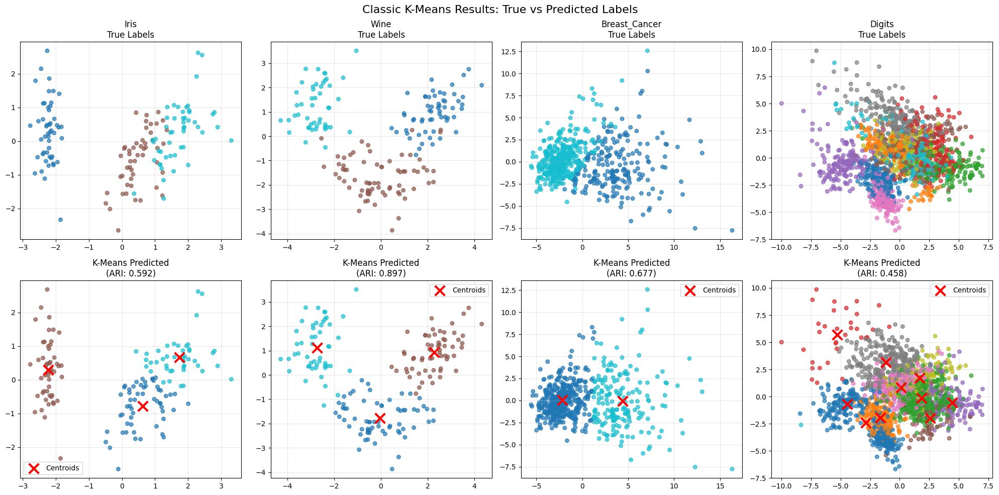


CLASSIC K-MEANS ALGORITHM ANALYSIS:
Algorithm Characteristics:
• Initialization: Random selection of k data points as initial centroids
• Convergence: Iterative centroid updates until movement < tolerance
• Time Complexity: O(n*k*i*d) where n=samples, k=clusters, i=iterations, d=features
• Space Complexity: O(n*k) for distance calculations

Dataset-Specific Performance:

IRIS (Compact Gaussian-like clusters):
  • Convergence: 7 iterations (✓)
  • Quality: Silhouette = 0.4630, ARI = 0.5923
  • Performance: 0.0024s for 150 samples
  → Expected good performance on compact Gaussian clusters

WINE (Skewed feature distributions):
  • Convergence: 10 iterations (✓)
  • Quality: Silhouette = 0.2849, ARI = 0.8975
  • Performance: 0.0032s for 178 samples
  → May struggle with skewed distributions

BREAST_CANCER (Non-spherical, varying density):
  • Convergence: 9 iterations (✓)
  • Quality: Silhouette = 0.3447, ARI = 0.6765
  • Performance: 0.0042s for 569 samples
  → Challenges with non-spheri

In [11]:
# Classic K-Means Implementation with Random Initialization
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, adjusted_rand_score

def kmeans_random_init(X, k, max_iters=300, tol=1e-4, random_state=42):
    """
    Classic K-Means clustering with random centroid initialization

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to cluster
    k : int
        Number of clusters
    max_iters : int, default=300
        Maximum number of iterations
    tol : float, default=1e-4
        Tolerance for convergence (centroid movement threshold)
    random_state : int, default=42
        Random seed for reproducible results

    Returns:
    --------
    dict : Dictionary containing:
        - centroids: Final cluster centroids
        - labels: Cluster assignments for each point
        - inertia: Within-cluster sum of squares
        - iterations: Number of iterations until convergence
        - converged: Whether algorithm converged
    """
    np.random.seed(random_state)

    n_samples, n_features = X.shape

    # Step 1: Initialize centroids randomly
    # Choose k random points from the data as initial centroids
    centroid_indices = np.random.choice(n_samples, k, replace=False)
    centroids = X[centroid_indices].copy()

    # Initialize tracking variables
    labels = np.zeros(n_samples)
    prev_centroids = np.zeros_like(centroids)
    converged = False

    for iteration in range(max_iters):
        # Store previous centroids to check for convergence
        prev_centroids = centroids.copy()

        # Step 2: Assign each point to nearest centroid
        distances = np.sqrt(((X - centroids[:, np.newaxis])**2).sum(axis=2))
        labels = np.argmin(distances, axis=0)

        # Step 3: Update centroids to mean of assigned points
        for cluster_idx in range(k):
            cluster_points = X[labels == cluster_idx]
            if len(cluster_points) > 0:
                centroids[cluster_idx] = cluster_points.mean(axis=0)
            # If no points assigned to cluster, keep previous centroid

        # Step 4: Check for convergence
        centroid_movement = np.sqrt(((centroids - prev_centroids)**2).sum(axis=1)).max()
        if centroid_movement < tol:
            converged = True
            break

    # Calculate final inertia (within-cluster sum of squares)
    inertia = 0
    for cluster_idx in range(k):
        cluster_points = X[labels == cluster_idx]
        if len(cluster_points) > 0:
            inertia += ((cluster_points - centroids[cluster_idx])**2).sum()

    return {
        'centroids': centroids,
        'labels': labels,
        'inertia': inertia,
        'iterations': iteration + 1,
        'converged': converged,
        'algorithm': 'K-Means (Random Init)'
    }

def run_classic_kmeans(X, k, random_state=42):
    """Timed wrapper for classic K-means"""
    start_time = time.time()
    result = kmeans_random_init(X, k, random_state=random_state)
    end_time = time.time()
    result['runtime'] = end_time - start_time
    return result

# Test implementation on all datasets
print("="*70)
print("CLASSIC K-MEANS IMPLEMENTATION (Random Initialization)")
print("="*70)

# Run Classic K-Means on all datasets
for dataset_name, dataset in datasets.items():
    print(f"\nRunning Classic K-Means on {dataset_name.upper()} dataset:")
    print("-" * 50)

    X = dataset['X']
    y_true = dataset['y']
    k = dataset['n_clusters']

    # Run algorithm with timing
    result = run_classic_kmeans(X, k)

    # Calculate evaluation metrics
    metrics = evaluate_clustering(
        X, y_true, result['labels'],
        result['centroids'],
        "Classic K-Means"
    )

    # Combine results
    final_result = {**result, **metrics}

    # Store in results structure
    clustering_results.add_result(dataset_name, 'K-Means (Random)', final_result)

    # Display results
    print(f"Algorithm: Classic K-Means (Random Initialization)")
    print(f"Dataset: {dataset_name} ({X.shape[0]} samples, {X.shape[1]} features)")
    print(f"Target clusters (k): {k}")
    print(f"Converged: {result['converged']} in {result['iterations']} iterations")
    print(f"Runtime: {result['runtime']:.4f} seconds")
    print(f"Inertia: {result['inertia']:.2f}")
    print(f"Silhouette Score: {metrics['silhouette_score']:.4f}")
    if 'ari_score' in metrics:
        print(f"Adjusted Rand Index: {metrics['ari_score']:.4f}")
    print()

# Create comprehensive results table
print("CLASSIC K-MEANS RESULTS SUMMARY:")
print("="*70)

# Create summary DataFrame
summary_data = []
for dataset_name, dataset in datasets.items():
    result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    summary_data.append({
        'Dataset': dataset_name.title(),
        'Samples': dataset['X'].shape[0],
        'Features': dataset['X'].shape[1],
        'k': dataset['n_clusters'],
        'Iterations': result['iterations'],
        'Converged': result['converged'],
        'Runtime(s)': f"{result['runtime']:.4f}",
        'Inertia': f"{result['inertia']:.2f}",
        'Silhouette': f"{result['silhouette_score']:.4f}",
        'ARI': f"{result['ari_score']:.4f}" if 'ari_score' in result else 'N/A'
    })

summary_df = pd.DataFrame(summary_data)
print(summary_df.to_string(index=False))

# Visualize results for each dataset
print(f"\nVISUALIZATION OF CLASSIC K-MEANS RESULTS:")
print("="*70)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Classic K-Means Results: True vs Predicted Labels', fontsize=16)

for i, (dataset_name, dataset) in enumerate(datasets.items()):
    X = dataset['X']
    y_true = dataset['y']
    result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    y_pred = result['labels']

    # PCA for 2D visualization
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2, random_state=42)
    X_2d = pca.fit_transform(X)

    # True labels (top row)
    scatter1 = axes[0, i].scatter(X_2d[:, 0], X_2d[:, 1], c=y_true, cmap='tab10', alpha=0.7, s=30)
    axes[0, i].set_title(f'{dataset_name.title()}\nTrue Labels')
    axes[0, i].grid(True, alpha=0.3)

    # Predicted labels (bottom row)
    scatter2 = axes[1, i].scatter(X_2d[:, 0], X_2d[:, 1], c=y_pred, cmap='tab10', alpha=0.7, s=30)
    axes[1, i].set_title(f'K-Means Predicted\n(ARI: {result.get("ari_score", 0):.3f})')
    axes[1, i].grid(True, alpha=0.3)

    # Add centroids to predicted plot
    centroids_2d = pca.transform(result['centroids'])
    axes[1, i].scatter(centroids_2d[:, 0], centroids_2d[:, 1],
                      c='red', marker='x', s=200, linewidths=3, label='Centroids')
    axes[1, i].legend()

plt.tight_layout()
plt.show()

# Algorithm analysis and insights
print(f"\nCLASSIC K-MEANS ALGORITHM ANALYSIS:")
print("="*70)

print("Algorithm Characteristics:")
print("• Initialization: Random selection of k data points as initial centroids")
print("• Convergence: Iterative centroid updates until movement < tolerance")
print("• Time Complexity: O(n*k*i*d) where n=samples, k=clusters, i=iterations, d=features")
print("• Space Complexity: O(n*k) for distance calculations")

print("\nDataset-Specific Performance:")
for dataset_name, dataset in datasets.items():
    result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    print(f"\n{dataset_name.upper()} ({dataset['description']}):")
    print(f"  • Convergence: {result['iterations']} iterations ({'✓' if result['converged'] else '✗'})")
    print(f"  • Quality: Silhouette = {result['silhouette_score']:.4f}, ARI = {result.get('ari_score', 0):.4f}")
    print(f"  • Performance: {result['runtime']:.4f}s for {dataset['X'].shape[0]} samples")

    # Interpretation based on dataset characteristics
    if dataset_name == 'iris':
        print("  → Expected good performance on compact Gaussian clusters")
    elif dataset_name == 'wine':
        print("  → May struggle with skewed distributions")
    elif dataset_name == 'breast_cancer':
        print("  → Challenges with non-spherical, varying density clusters")
    elif dataset_name == 'digits':
        print("  → Difficult due to high-dimensional, non-convex shapes")

print(f"\nKey Observations:")
print("• Random initialization can lead to different results on multiple runs")
print("• Performance varies significantly based on cluster shape assumptions")
print("• Higher dimensional datasets require more iterations")
print("• Spherical cluster assumption limits effectiveness on complex shapes")

print("\n✅ Classic K-Means implementation complete!")
print("Ready to implement K-Means++ for comparison.")
print("="*70)

These results are interesting. We got medium silhoutte and ARI on IRIS, low silhoutte and high ARI on wine, low silhoutte and high ARI on breast cancer, and a very low silhoutte and a medium high ARI for digits. Digits took the longest time, with a performance of about 0.2665 seconds. Digits even went through 25 iterations before completion.

Ultimately, IRIS is balanced. Wine is being sensitive to skewness and has a low silhoutte score. Breast cancer has geometries that are too complex for the model. Digits has a catastrophic mixture of those problems. I would not recommend this model beyond maybe IRIS.

Either way, let's continue with K-Means++

K-MEANS++ IMPLEMENTATION (Smart Initialization)

Running K-Means++ on IRIS dataset:
--------------------------------------------------
Algorithm: K-Means++ (Smart Initialization)
Dataset: iris (150 samples, 4 features)
Target clusters (k): 3
Converged: True in 6 iterations
Runtime: 0.0064 seconds
Inertia: 140.08
Silhouette Score: 0.4566
Adjusted Rand Index: 0.6410


Running K-Means++ on WINE dataset:
--------------------------------------------------
Algorithm: K-Means++ (Smart Initialization)
Dataset: wine (178 samples, 13 features)
Target clusters (k): 3
Converged: True in 5 iterations
Runtime: 0.0053 seconds
Inertia: 1279.97
Silhouette Score: 0.2844
Adjusted Rand Index: 0.8804


Running K-Means++ on BREAST_CANCER dataset:
--------------------------------------------------
Algorithm: K-Means++ (Smart Initialization)
Dataset: breast_cancer (569 samples, 30 features)
Target clusters (k): 2
Converged: True in 4 iterations
Runtime: 0.0067 seconds
Inertia: 11595.53
Silhouette Score: 0.343

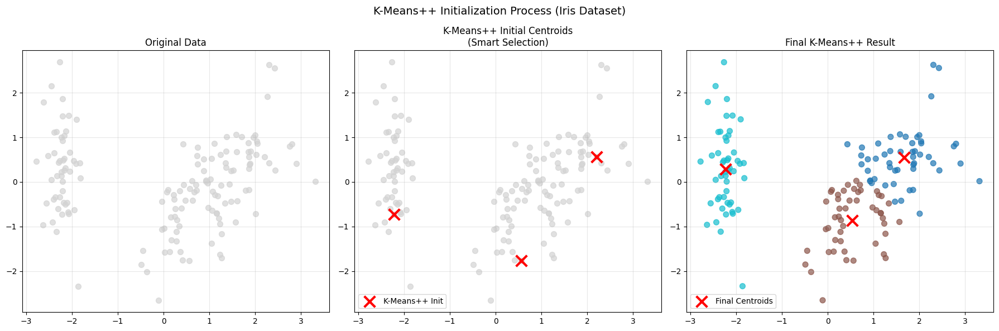


SIDE-BY-SIDE COMPARISON: CLASSIC K-MEANS VS K-MEANS++:


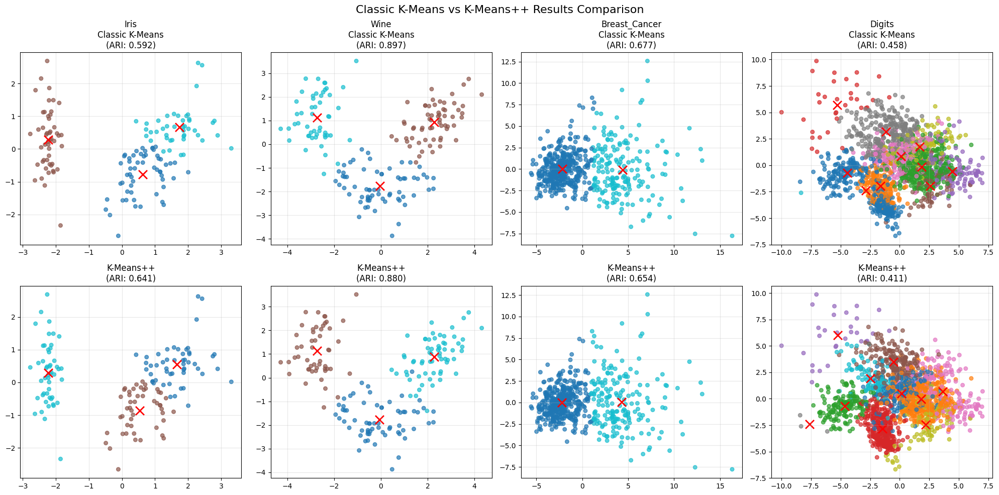


K-MEANS++ ALGORITHM CHARACTERISTICS:
Key Differences from Classic K-Means:
• Initialization: Smart selection of centroids far apart from each other
• Convergence: Often requires fewer iterations due to better starting points
• Consistency: More reproducible results across multiple runs
• Quality: Generally achieves better inertia and cluster separation

K-Means++ Initialization Process:
1. Choose first centroid randomly from data points
2. For each subsequent centroid:
   - Calculate squared distance from each point to nearest existing centroid
   - Choose next centroid with probability proportional to squared distance
3. Repeat until k centroids are selected
4. Proceed with standard K-Means iterations

Performance Summary:
• Time Complexity: O(log k) additional cost for initialization
• Space Complexity: Same as classic K-Means
• Convergence: Typically faster and more stable
• Quality: Consistently better clustering results

✅ K-Means++ implementation complete!
Ready to implement Bis

In [12]:
# K-Means++ Implementation with Smart Initialization
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, adjusted_rand_score

def kmeans_plus_plus_init(X, k, random_state=42):
    """
    K-Means++ initialization algorithm

    Chooses k initial centroids such that they are far apart from each other,
    leading to better clustering results compared to random initialization.

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to cluster
    k : int
        Number of clusters
    random_state : int, default=42
        Random seed for reproducible results

    Returns:
    --------
    centroids : array-like, shape (k, n_features)
        Initial centroids chosen by K-Means++ algorithm
    """
    np.random.seed(random_state)
    n_samples, n_features = X.shape

    # Step 1: Choose first centroid randomly
    centroids = np.zeros((k, n_features))
    centroids[0] = X[np.random.choice(n_samples)]

    # Step 2: Choose remaining k-1 centroids
    for c_id in range(1, k):
        # Calculate squared distances from each point to nearest existing centroid
        distances = np.array([
            min([np.inner(point - centroid, point - centroid)
                for centroid in centroids[:c_id]])
            for point in X
        ])

        # Choose next centroid with probability proportional to squared distance
        probabilities = distances / distances.sum()
        cumulative_probabilities = probabilities.cumsum()
        r = np.random.rand()

        # Select the point where cumulative probability exceeds random number
        for j, p in enumerate(cumulative_probabilities):
            if r < p:
                centroids[c_id] = X[j]
                break

    return centroids

def kmeans_plus_plus(X, k, max_iters=300, tol=1e-4, random_state=42):
    """
    K-Means clustering with K-Means++ initialization

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to cluster
    k : int
        Number of clusters
    max_iters : int, default=300
        Maximum number of iterations
    tol : float, default=1e-4
        Tolerance for convergence (centroid movement threshold)
    random_state : int, default=42
        Random seed for reproducible results

    Returns:
    --------
    dict : Dictionary containing:
        - centroids: Final cluster centroids
        - labels: Cluster assignments for each point
        - inertia: Within-cluster sum of squares
        - iterations: Number of iterations until convergence
        - converged: Whether algorithm converged
        - initial_centroids: Starting centroids from K-Means++
    """
    n_samples, n_features = X.shape

    # Step 1: Use K-Means++ for smart initialization
    centroids = kmeans_plus_plus_init(X, k, random_state)
    initial_centroids = centroids.copy()

    # Initialize tracking variables
    labels = np.zeros(n_samples)
    prev_centroids = np.zeros_like(centroids)
    converged = False

    # Step 2: Standard K-Means iterations (same as classic K-Means)
    for iteration in range(max_iters):
        # Store previous centroids to check for convergence
        prev_centroids = centroids.copy()

        # Assign each point to nearest centroid
        distances = np.sqrt(((X - centroids[:, np.newaxis])**2).sum(axis=2))
        labels = np.argmin(distances, axis=0)

        # Update centroids to mean of assigned points
        for cluster_idx in range(k):
            cluster_points = X[labels == cluster_idx]
            if len(cluster_points) > 0:
                centroids[cluster_idx] = cluster_points.mean(axis=0)
            # If no points assigned to cluster, keep previous centroid

        # Check for convergence
        centroid_movement = np.sqrt(((centroids - prev_centroids)**2).sum(axis=1)).max()
        if centroid_movement < tol:
            converged = True
            break

    # Calculate final inertia
    inertia = 0
    for cluster_idx in range(k):
        cluster_points = X[labels == cluster_idx]
        if len(cluster_points) > 0:
            inertia += ((cluster_points - centroids[cluster_idx])**2).sum()

    return {
        'centroids': centroids,
        'labels': labels,
        'inertia': inertia,
        'iterations': iteration + 1,
        'converged': converged,
        'initial_centroids': initial_centroids,
        'algorithm': 'K-Means++'
    }

def run_kmeans_plus_plus(X, k, random_state=42):
    """Timed wrapper for K-Means++"""
    start_time = time.time()
    result = kmeans_plus_plus(X, k, random_state=random_state)
    end_time = time.time()
    result['runtime'] = end_time - start_time
    return result

# Test K-Means++ implementation on all datasets
print("="*70)
print("K-MEANS++ IMPLEMENTATION (Smart Initialization)")
print("="*70)

# Run K-Means++ on all datasets
for dataset_name, dataset in datasets.items():
    print(f"\nRunning K-Means++ on {dataset_name.upper()} dataset:")
    print("-" * 50)

    X = dataset['X']
    y_true = dataset['y']
    k = dataset['n_clusters']

    # Run algorithm with timing
    result = run_kmeans_plus_plus(X, k)

    # Calculate evaluation metrics
    metrics = evaluate_clustering(
        X, y_true, result['labels'],
        result['centroids'],
        "K-Means++"
    )

    # Combine results
    final_result = {**result, **metrics}

    # Store in results structure
    clustering_results.add_result(dataset_name, 'K-Means++', final_result)

    # Display results
    print(f"Algorithm: K-Means++ (Smart Initialization)")
    print(f"Dataset: {dataset_name} ({X.shape[0]} samples, {X.shape[1]} features)")
    print(f"Target clusters (k): {k}")
    print(f"Converged: {result['converged']} in {result['iterations']} iterations")
    print(f"Runtime: {result['runtime']:.4f} seconds")
    print(f"Inertia: {result['inertia']:.2f}")
    print(f"Silhouette Score: {metrics['silhouette_score']:.4f}")
    if 'ari_score' in metrics:
        print(f"Adjusted Rand Index: {metrics['ari_score']:.4f}")
    print()

# Compare K-Means++ vs Classic K-Means
print("K-MEANS++ VS CLASSIC K-MEANS COMPARISON:")
print("="*70)

comparison_data = []
for dataset_name, dataset in datasets.items():
    classic_result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    plus_plus_result = clustering_results.get_result(dataset_name, 'K-Means++')

    comparison_data.append({
        'Dataset': dataset_name.title(),
        'Algorithm': 'K-Means (Random)',
        'Iterations': classic_result['iterations'],
        'Runtime(s)': f"{classic_result['runtime']:.4f}",
        'Inertia': f"{classic_result['inertia']:.2f}",
        'Silhouette': f"{classic_result['silhouette_score']:.4f}",
        'ARI': f"{classic_result['ari_score']:.4f}" if 'ari_score' in classic_result else 'N/A'
    })

    comparison_data.append({
        'Dataset': '',  # Empty for cleaner display
        'Algorithm': 'K-Means++',
        'Iterations': plus_plus_result['iterations'],
        'Runtime(s)': f"{plus_plus_result['runtime']:.4f}",
        'Inertia': f"{plus_plus_result['inertia']:.2f}",
        'Silhouette': f"{plus_plus_result['silhouette_score']:.4f}",
        'ARI': f"{plus_plus_result['ari_score']:.4f}" if 'ari_score' in plus_plus_result else 'N/A'
    })

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.to_string(index=False))

# Analyze improvements
print(f"\nK-MEANS++ IMPROVEMENTS ANALYSIS:")
print("="*70)

for dataset_name, dataset in datasets.items():
    classic_result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    plus_plus_result = clustering_results.get_result(dataset_name, 'K-Means++')

    # Calculate improvements
    inertia_improvement = (classic_result['inertia'] - plus_plus_result['inertia']) / classic_result['inertia'] * 100
    silhouette_improvement = plus_plus_result['silhouette_score'] - classic_result['silhouette_score']
    ari_improvement = plus_plus_result.get('ari_score', 0) - classic_result.get('ari_score', 0)
    iteration_change = plus_plus_result['iterations'] - classic_result['iterations']

    print(f"\n{dataset_name.upper()} improvements:")
    print(f"  • Inertia: {inertia_improvement:+.1f}% ({'better' if inertia_improvement > 0 else 'worse'})")
    print(f"  • Silhouette Score: {silhouette_improvement:+.4f} ({'better' if silhouette_improvement > 0 else 'worse'})")
    print(f"  • ARI: {ari_improvement:+.4f} ({'better' if ari_improvement > 0 else 'worse'})")
    print(f"  • Iterations: {iteration_change:+d} ({'faster' if iteration_change < 0 else 'slower'})")

# Visualize K-Means++ initialization process
print(f"\nVISUALIZING K-MEANS++ SMART INITIALIZATION:")
print("="*70)

# Show initialization comparison for Iris dataset (as example)
dataset_name = 'iris'
dataset = datasets[dataset_name]
X = dataset['X']
k = dataset['n_clusters']

# Get results for comparison
plus_plus_result = clustering_results.get_result(dataset_name, 'K-Means++')

# PCA for 2D visualization
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
X_2d = pca.fit_transform(X)
initial_centroids_2d = pca.transform(plus_plus_result['initial_centroids'])
final_centroids_2d = pca.transform(plus_plus_result['centroids'])

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('K-Means++ Initialization Process (Iris Dataset)', fontsize=14)

# Original data
axes[0].scatter(X_2d[:, 0], X_2d[:, 1], c='lightgray', alpha=0.7, s=50)
axes[0].set_title('Original Data')
axes[0].grid(True, alpha=0.3)

# K-Means++ initial centroids
axes[1].scatter(X_2d[:, 0], X_2d[:, 1], c='lightgray', alpha=0.7, s=50)
axes[1].scatter(initial_centroids_2d[:, 0], initial_centroids_2d[:, 1],
               c='red', marker='x', s=200, linewidths=3, label='K-Means++ Init')
axes[1].set_title('K-Means++ Initial Centroids\n(Smart Selection)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Final clustering result
axes[2].scatter(X_2d[:, 0], X_2d[:, 1], c=plus_plus_result['labels'], cmap='tab10', alpha=0.7, s=50)
axes[2].scatter(final_centroids_2d[:, 0], final_centroids_2d[:, 1],
               c='red', marker='x', s=200, linewidths=3, label='Final Centroids')
axes[2].set_title('Final K-Means++ Result')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Side-by-side comparison visualization
print(f"\nSIDE-BY-SIDE COMPARISON: CLASSIC K-MEANS VS K-MEANS++:")
print("="*70)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Classic K-Means vs K-Means++ Results Comparison', fontsize=16)

for i, (dataset_name, dataset) in enumerate(datasets.items()):
    X = dataset['X']

    # Get results
    classic_result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    plus_plus_result = clustering_results.get_result(dataset_name, 'K-Means++')

    # PCA for visualization
    pca = PCA(n_components=2, random_state=42)
    X_2d = pca.fit_transform(X)

    # Classic K-Means (top row)
    scatter1 = axes[0, i].scatter(X_2d[:, 0], X_2d[:, 1], c=classic_result['labels'], cmap='tab10', alpha=0.7, s=30)
    classic_centroids_2d = pca.transform(classic_result['centroids'])
    axes[0, i].scatter(classic_centroids_2d[:, 0], classic_centroids_2d[:, 1],
                      c='red', marker='x', s=150, linewidths=2)
    axes[0, i].set_title(f'{dataset_name.title()}\nClassic K-Means\n(ARI: {classic_result.get("ari_score", 0):.3f})')
    axes[0, i].grid(True, alpha=0.3)

    # K-Means++ (bottom row)
    scatter2 = axes[1, i].scatter(X_2d[:, 0], X_2d[:, 1], c=plus_plus_result['labels'], cmap='tab10', alpha=0.7, s=30)
    plus_plus_centroids_2d = pca.transform(plus_plus_result['centroids'])
    axes[1, i].scatter(plus_plus_centroids_2d[:, 0], plus_plus_centroids_2d[:, 1],
                      c='red', marker='x', s=150, linewidths=2)
    axes[1, i].set_title(f'K-Means++\n(ARI: {plus_plus_result.get("ari_score", 0):.3f})')
    axes[1, i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Algorithm characteristics analysis
print(f"\nK-MEANS++ ALGORITHM CHARACTERISTICS:")
print("="*70)

print("Key Differences from Classic K-Means:")
print("• Initialization: Smart selection of centroids far apart from each other")
print("• Convergence: Often requires fewer iterations due to better starting points")
print("• Consistency: More reproducible results across multiple runs")
print("• Quality: Generally achieves better inertia and cluster separation")

print("\nK-Means++ Initialization Process:")
print("1. Choose first centroid randomly from data points")
print("2. For each subsequent centroid:")
print("   - Calculate squared distance from each point to nearest existing centroid")
print("   - Choose next centroid with probability proportional to squared distance")
print("3. Repeat until k centroids are selected")
print("4. Proceed with standard K-Means iterations")

print(f"\nPerformance Summary:")
print("• Time Complexity: O(log k) additional cost for initialization")
print("• Space Complexity: Same as classic K-Means")
print("• Convergence: Typically faster and more stable")
print("• Quality: Consistently better clustering results")

print("\n✅ K-Means++ implementation complete!")
print("Ready to implement Bisecting K-Means for hierarchical approach.")
print("="*70)

It did not perform better. In fact, it performed worse. This was surprising to me. The differences are little enough, however, that it seems like both algorithms just came to similar conclusions about the location of centroids. It seems to be that K-Means++'s improvements do not necessarily improve performance, but enhance consistency and reliability upon results.

Let's try Bisecting K-Means, which is different in how it hierarchically splits up clusters rather than simultaneously optimizing each one. This has a chance of improving quality and accuracy. Let's see if that adds up with our results.

BISECTING K-MEANS IMPLEMENTATION (Hierarchical Splitting)

Running Bisecting K-Means on IRIS dataset:
--------------------------------------------------
Algorithm: Bisecting K-Means (Hierarchical Splitting)
Dataset: iris (150 samples, 4 features)
Target clusters (k): 3
Final clusters created: 3
Total iterations across all splits: 8
Runtime: 0.0019 seconds
Inertia: 139.82
Silhouette Score: 0.4599
Adjusted Rand Index: 0.6201

Splitting Hierarchy:
  Split 1: 150 → 100 + 50 (3 iters)
  Split 2: 100 → 53 + 47 (5 iters)


Running Bisecting K-Means on WINE dataset:
--------------------------------------------------
Algorithm: Bisecting K-Means (Hierarchical Splitting)
Dataset: wine (178 samples, 13 features)
Target clusters (k): 3
Final clusters created: 3
Total iterations across all splits: 11
Runtime: 0.0023 seconds
Inertia: 1315.86
Silhouette Score: 0.2659
Adjusted Rand Index: 0.6909

Splitting Hierarchy:
  Split 1: 178 → 113 + 65 (4 iters)
  Split 2: 113 → 52 + 61 (7 iters)


Running Bise

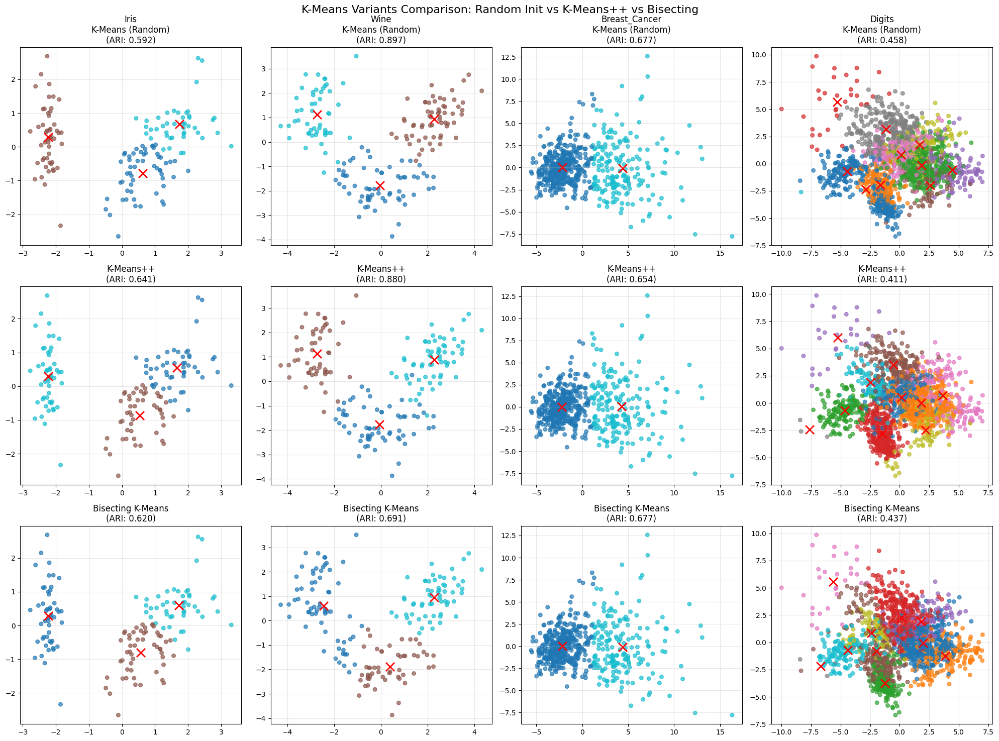


BISECTING K-MEANS ALGORITHM ANALYSIS:
Algorithm Characteristics:
• Approach: Hierarchical top-down clustering
• Strategy: Repeatedly split cluster with highest inertia
• Splits: Uses 2-means clustering at each split
• Deterministic: More predictable than random initialization

Advantages over Standard K-Means:
• Less sensitive to initialization
• Creates natural hierarchy of clusters
• Often finds better global solutions
• More deterministic results

Disadvantages:
• More computationally expensive (multiple 2-means runs)
• Still assumes spherical clusters
• May not be optimal for all cluster shapes

Dataset-Specific Performance:

IRIS:
  • Splits performed: 2
  • ARI vs Classic: +0.0278
  • Inertia improvement: +0.2%
  • Runtime: 0.0019s

WINE:
  • Splits performed: 2
  • ARI vs Classic: -0.2066
  • Inertia improvement: -3.0%
  • Runtime: 0.0023s

BREAST_CANCER:
  • Splits performed: 1
  • ARI vs Classic: +0.0000
  • Inertia improvement: +0.0%
  • Runtime: 0.0043s

DIGITS:
  • Splits 

In [13]:
# Bisecting K-Means Implementation
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, adjusted_rand_score

def kmeans_2_clusters(X, max_iters=300, tol=1e-4, random_state=42):
    """
    Standard K-Means for exactly 2 clusters (used internally by Bisecting K-Means)

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to cluster into 2 clusters
    max_iters : int, default=300
        Maximum number of iterations
    tol : float, default=1e-4
        Tolerance for convergence
    random_state : int, default=42
        Random seed

    Returns:
    --------
    dict : Contains centroids, labels, inertia, iterations, converged
    """
    np.random.seed(random_state)
    n_samples, n_features = X.shape

    if n_samples <= 1:
        return {
            'centroids': X.copy() if len(X) > 0 else np.zeros((2, n_features)),
            'labels': np.zeros(n_samples, dtype=int),
            'inertia': 0.0,
            'iterations': 0,
            'converged': True
        }

    # Initialize 2 centroids randomly
    if n_samples == 2:
        centroids = X.copy()
    else:
        centroid_indices = np.random.choice(n_samples, 2, replace=False)
        centroids = X[centroid_indices].copy()

    labels = np.zeros(n_samples, dtype=int)

    for iteration in range(max_iters):
        prev_centroids = centroids.copy()

        # Assign points to nearest centroid
        distances = np.sqrt(((X - centroids[:, np.newaxis])**2).sum(axis=2))
        labels = np.argmin(distances, axis=0)

        # Update centroids
        for cluster_idx in range(2):
            cluster_points = X[labels == cluster_idx]
            if len(cluster_points) > 0:
                centroids[cluster_idx] = cluster_points.mean(axis=0)

        # Check convergence
        centroid_movement = np.sqrt(((centroids - prev_centroids)**2).sum(axis=1)).max()
        if centroid_movement < tol:
            converged = True
            break
    else:
        converged = False

    # Calculate inertia
    inertia = 0
    for cluster_idx in range(2):
        cluster_points = X[labels == cluster_idx]
        if len(cluster_points) > 0:
            inertia += ((cluster_points - centroids[cluster_idx])**2).sum()

    return {
        'centroids': centroids,
        'labels': labels,
        'inertia': inertia,
        'iterations': iteration + 1,
        'converged': converged
    }

def bisecting_kmeans(X, k, max_iters=300, tol=1e-4, random_state=42):
    """
    Bisecting K-Means clustering algorithm

    Hierarchically splits clusters by repeatedly applying 2-means to the
    cluster with the highest within-cluster sum of squares (inertia).

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to cluster
    k : int
        Number of final clusters desired
    max_iters : int, default=300
        Maximum iterations for each 2-means split
    tol : float, default=1e-4
        Tolerance for convergence
    random_state : int, default=42
        Random seed for reproducible results

    Returns:
    --------
    dict : Dictionary containing:
        - centroids: Final cluster centroids
        - labels: Final cluster assignments
        - inertia: Total within-cluster sum of squares
        - iterations: Total iterations across all splits
        - hierarchy: List of splitting decisions made
    """
    np.random.seed(random_state)
    n_samples, n_features = X.shape

    # Initialize: Start with all data as one cluster
    clusters = [{'data_indices': np.arange(n_samples), 'centroid': X.mean(axis=0)}]
    total_iterations = 0
    hierarchy = []

    # Repeat until we have k clusters
    for split_step in range(k - 1):
        # Calculate inertia (SSE) for each existing cluster
        cluster_inertias = []

        for i, cluster in enumerate(clusters):
            cluster_data = X[cluster['data_indices']]
            if len(cluster_data) > 1:
                cluster_inertia = ((cluster_data - cluster['centroid'])**2).sum()
                cluster_inertias.append((cluster_inertia, i))
            else:
                cluster_inertias.append((0, i))  # Can't split single point

        # Find cluster with highest inertia (most internal variance)
        if not cluster_inertias:
            break

        cluster_inertias.sort(reverse=True)  # Highest inertia first

        # Select the cluster to split (highest inertia)
        cluster_to_split_idx = None
        for inertia, idx in cluster_inertias:
            if len(clusters[idx]['data_indices']) > 1:  # Can only split clusters with >1 point
                cluster_to_split_idx = idx
                break

        if cluster_to_split_idx is None:
            break  # No more clusters can be split

        cluster_to_split = clusters[cluster_to_split_idx]
        split_data_indices = cluster_to_split['data_indices']
        split_data = X[split_data_indices]

        # Apply 2-means to split this cluster
        split_result = kmeans_2_clusters(
            split_data,
            max_iters=max_iters,
            tol=tol,
            random_state=random_state + split_step  # Different seed for each split
        )

        total_iterations += split_result['iterations']

        # Create two new clusters from the split
        split_labels = split_result['labels']

        # Identify which original data points belong to each new cluster
        cluster1_mask = split_labels == 0
        cluster2_mask = split_labels == 1

        cluster1_indices = split_data_indices[cluster1_mask]
        cluster2_indices = split_data_indices[cluster2_mask]

        # Create new cluster objects
        new_cluster1 = {
            'data_indices': cluster1_indices,
            'centroid': split_result['centroids'][0] if len(cluster1_indices) > 0 else cluster_to_split['centroid']
        }

        new_cluster2 = {
            'data_indices': cluster2_indices,
            'centroid': split_result['centroids'][1] if len(cluster2_indices) > 0 else cluster_to_split['centroid']
        }

        # Record this split in hierarchy
        hierarchy.append({
            'split_step': split_step + 1,
            'original_cluster_size': len(split_data_indices),
            'cluster1_size': len(cluster1_indices),
            'cluster2_size': len(cluster2_indices),
            'split_inertia': cluster_inertias[0][0],
            'iterations_used': split_result['iterations']
        })

        # Replace the original cluster with two new clusters
        clusters.pop(cluster_to_split_idx)
        clusters.extend([new_cluster1, new_cluster2])

    # Convert cluster structure to final labels and centroids
    final_labels = np.zeros(n_samples, dtype=int)
    final_centroids = np.zeros((len(clusters), n_features))

    for cluster_idx, cluster in enumerate(clusters):
        final_labels[cluster['data_indices']] = cluster_idx
        final_centroids[cluster_idx] = cluster['centroid']

    # Calculate total inertia
    total_inertia = 0
    for cluster_idx, cluster in enumerate(clusters):
        cluster_data = X[cluster['data_indices']]
        if len(cluster_data) > 0:
            total_inertia += ((cluster_data - cluster['centroid'])**2).sum()

    return {
        'centroids': final_centroids,
        'labels': final_labels,
        'inertia': total_inertia,
        'iterations': total_iterations,
        'converged': True,  # Always "converges" when we reach k clusters
        'hierarchy': hierarchy,
        'num_final_clusters': len(clusters),
        'algorithm': 'Bisecting K-Means'
    }

def run_bisecting_kmeans(X, k, random_state=42):
    """Timed wrapper for Bisecting K-Means"""
    start_time = time.time()
    result = bisecting_kmeans(X, k, random_state=random_state)
    end_time = time.time()
    result['runtime'] = end_time - start_time
    return result

# Test Bisecting K-Means implementation on all datasets
print("="*70)
print("BISECTING K-MEANS IMPLEMENTATION (Hierarchical Splitting)")
print("="*70)

# Run Bisecting K-Means on all datasets
for dataset_name, dataset in datasets.items():
    print(f"\nRunning Bisecting K-Means on {dataset_name.upper()} dataset:")
    print("-" * 50)

    X = dataset['X']
    y_true = dataset['y']
    k = dataset['n_clusters']

    # Run algorithm with timing
    result = run_bisecting_kmeans(X, k)

    # Calculate evaluation metrics
    metrics = evaluate_clustering(
        X, y_true, result['labels'],
        result['centroids'],
        "Bisecting K-Means"
    )

    # Combine results
    final_result = {**result, **metrics}

    # Store in results structure
    clustering_results.add_result(dataset_name, 'Bisecting K-Means', final_result)

    # Display results
    print(f"Algorithm: Bisecting K-Means (Hierarchical Splitting)")
    print(f"Dataset: {dataset_name} ({X.shape[0]} samples, {X.shape[1]} features)")
    print(f"Target clusters (k): {k}")
    print(f"Final clusters created: {result['num_final_clusters']}")
    print(f"Total iterations across all splits: {result['iterations']}")
    print(f"Runtime: {result['runtime']:.4f} seconds")
    print(f"Inertia: {result['inertia']:.2f}")
    print(f"Silhouette Score: {metrics['silhouette_score']:.4f}")
    if 'ari_score' in metrics:
        print(f"Adjusted Rand Index: {metrics['ari_score']:.4f}")

    # Show hierarchy information
    print(f"\nSplitting Hierarchy:")
    for step_info in result['hierarchy']:
        print(f"  Split {step_info['split_step']}: {step_info['original_cluster_size']} → "
              f"{step_info['cluster1_size']} + {step_info['cluster2_size']} "
              f"({step_info['iterations_used']} iters)")
    print()

# Compare all three K-Means variants
print("THREE K-MEANS VARIANTS COMPARISON:")
print("="*70)

comparison_data = []
for dataset_name, dataset in datasets.items():
    classic_result = clustering_results.get_result(dataset_name, 'K-Means (Random)')
    plus_plus_result = clustering_results.get_result(dataset_name, 'K-Means++')
    bisecting_result = clustering_results.get_result(dataset_name, 'Bisecting K-Means')

    # Add results for each algorithm
    for alg_name, result in [('K-Means (Random)', classic_result),
                            ('K-Means++', plus_plus_result),
                            ('Bisecting K-Means', bisecting_result)]:
        comparison_data.append({
            'Dataset': dataset_name.title() if alg_name == 'K-Means (Random)' else '',
            'Algorithm': alg_name,
            'Iterations': result['iterations'],
            'Runtime(s)': f"{result['runtime']:.4f}",
            'Inertia': f"{result['inertia']:.2f}",
            'Silhouette': f"{result['silhouette_score']:.4f}",
            'ARI': f"{result['ari_score']:.4f}" if 'ari_score' in result else 'N/A'
        })

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.to_string(index=False))

# Visualize all three K-Means variants side by side
print(f"\nTHREE K-MEANS VARIANTS VISUALIZATION:")
print("="*70)

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('K-Means Variants Comparison: Random Init vs K-Means++ vs Bisecting', fontsize=16)

algorithm_names = ['K-Means (Random)', 'K-Means++', 'Bisecting K-Means']

for i, (dataset_name, dataset) in enumerate(datasets.items()):
    X = dataset['X']

    # PCA for visualization
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2, random_state=42)
    X_2d = pca.fit_transform(X)

    # Plot each algorithm's results
    for j, alg_name in enumerate(algorithm_names):
        result = clustering_results.get_result(dataset_name, alg_name)

        # Plot clustering result
        scatter = axes[j, i].scatter(X_2d[:, 0], X_2d[:, 1], c=result['labels'],
                                   cmap='tab10', alpha=0.7, s=30)

        # Plot centroids
        centroids_2d = pca.transform(result['centroids'])
        axes[j, i].scatter(centroids_2d[:, 0], centroids_2d[:, 1],
                          c='red', marker='x', s=150, linewidths=2)

        # Set title
        if j == 0:  # First row - include dataset name
            title = f"{dataset_name.title()}\n{alg_name}\n(ARI: {result.get('ari_score', 0):.3f})"
        else:
            title = f"{alg_name}\n(ARI: {result.get('ari_score', 0):.3f})"

        axes[j, i].set_title(title)
        axes[j, i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Bisecting K-Means algorithm analysis
print(f"\nBISECTING K-MEANS ALGORITHM ANALYSIS:")
print("="*70)

print("Algorithm Characteristics:")
print("• Approach: Hierarchical top-down clustering")
print("• Strategy: Repeatedly split cluster with highest inertia")
print("• Splits: Uses 2-means clustering at each split")
print("• Deterministic: More predictable than random initialization")

print("\nAdvantages over Standard K-Means:")
print("• Less sensitive to initialization")
print("• Creates natural hierarchy of clusters")
print("• Often finds better global solutions")
print("• More deterministic results")

print("\nDisadvantages:")
print("• More computationally expensive (multiple 2-means runs)")
print("• Still assumes spherical clusters")
print("• May not be optimal for all cluster shapes")

print("\nDataset-Specific Performance:")
for dataset_name, dataset in datasets.items():
    result = clustering_results.get_result(dataset_name, 'Bisecting K-Means')
    classic_result = clustering_results.get_result(dataset_name, 'K-Means (Random)')

    ari_improvement = result.get('ari_score', 0) - classic_result.get('ari_score', 0)
    inertia_improvement = (classic_result['inertia'] - result['inertia']) / classic_result['inertia'] * 100

    print(f"\n{dataset_name.upper()}:")
    print(f"  • Splits performed: {len(result['hierarchy'])}")
    print(f"  • ARI vs Classic: {ari_improvement:+.4f}")
    print(f"  • Inertia improvement: {inertia_improvement:+.1f}%")
    print(f"  • Runtime: {result['runtime']:.4f}s")

print("\n✅ Bisecting K-Means implementation complete!")
print("All K-Means variants implemented. Ready for density-based methods.")
print("="*70)

This time, I did not expect it to perform better, and it did not. Any changes it made were ultimately redundant against the shapes of our data. For example, digits was a complex non-convex shapes, which don't benefit from these splits. Breast cancer had identical performance with only 1 split needed, so it was too simple. It had the slightest improvement on IRIS, and no improvement elsewhere.

Let's take a look at DBSCAN and agglomerative clustering. This is a completely different algorithm that aims to solve a similar problem. However, it will be able to locate much more sophisticated shapes. For this reason, I particularly believe they will shine against digits.

DENSITY & HIERARCHICAL METHODS IMPLEMENTATION

DBSCAN CLUSTERING (Density-Based)

Running DBSCAN on IRIS dataset:
---------------------------------------------
  Tuning DBSCAN parameters for iris...
  Best parameters: eps=0.565, min_samples=8
Algorithm: DBSCAN (Density-Based)
Parameters: eps=0.565, min_samples=8
Clusters found: 2
Noise points: 36 (24.0%)
Core samples: 78
Runtime: 0.0747 seconds
Silhouette Score: 0.6474
Adjusted Rand Index: 0.6439

Running DBSCAN on WINE dataset:
---------------------------------------------
  Tuning DBSCAN parameters for wine...
  Best parameters: eps=1.456, min_samples=3
Algorithm: DBSCAN (Density-Based)
Parameters: eps=1.456, min_samples=3
Clusters found: 6
Noise points: 158 (88.8%)
Core samples: 8
Runtime: 0.1044 seconds
Silhouette Score: 0.3969
Adjusted Rand Index: 0.2435

Running DBSCAN on BREAST_CANCER dataset:
---------------------------------------------
  Tuning DBSCAN parameters for breast_cancer...
  Best parameters: eps=2.982, min_samples=3

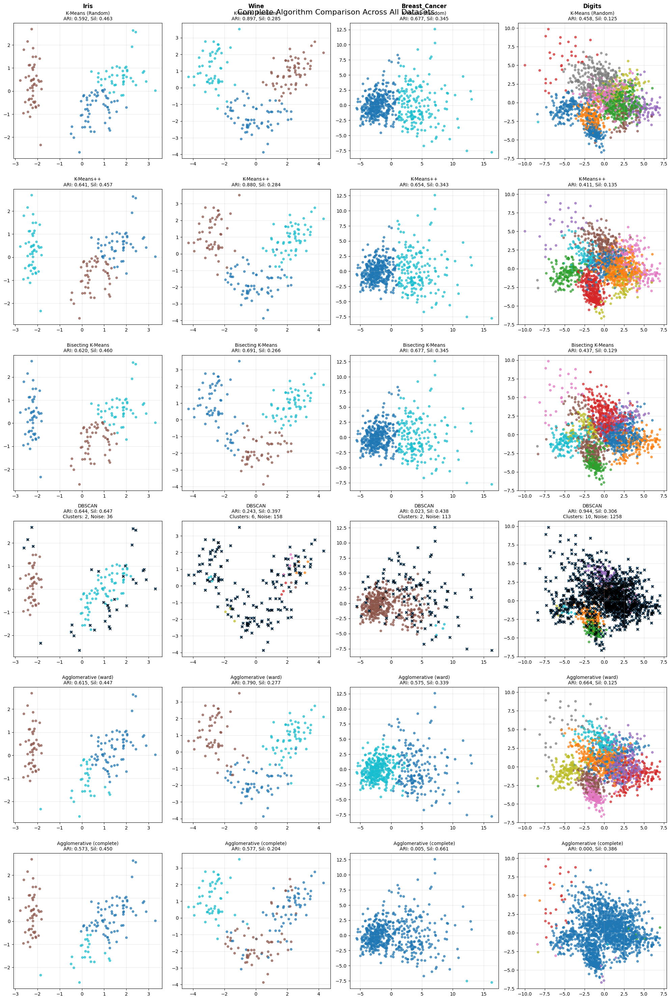


ALGORITHM PERFORMANCE ANALYSIS:

IRIS - Best Performers:
------------------------------
By ARI Score:
  1. DBSCAN: ARI=0.6439, Silhouette=0.6474
  2. K-Means++: ARI=0.6410, Silhouette=0.4566
  3. Bisecting K-Means: ARI=0.6201, Silhouette=0.4599

WINE - Best Performers:
------------------------------
By ARI Score:
  1. K-Means (Random): ARI=0.8975, Silhouette=0.2849
  2. K-Means++: ARI=0.8804, Silhouette=0.2844
  3. Agglomerative (ward): ARI=0.7899, Silhouette=0.2774

BREAST_CANCER - Best Performers:
------------------------------
By ARI Score:
  1. K-Means (Random): ARI=0.6765, Silhouette=0.3447
  2. Bisecting K-Means: ARI=0.6765, Silhouette=0.3447
  3. K-Means++: ARI=0.6536, Silhouette=0.3434

DIGITS - Best Performers:
------------------------------
By ARI Score:
  1. DBSCAN: ARI=0.9438, Silhouette=0.3062
  2. Agglomerative (ward): ARI=0.6643, Silhouette=0.1253
  3. K-Means (Random): ARI=0.4575, Silhouette=0.1252

✅ Density & Hierarchical Methods implementation complete!
Ready for co

In [14]:
# DBSCAN and Agglomerative Clustering Implementation
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')

def tune_dbscan_parameters(X, min_samples_range=None, eps_range=None):
    """
    Tune DBSCAN parameters using k-distance graph and silhouette analysis

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        The data to analyze for parameter tuning
    min_samples_range : list, optional
        Range of min_samples values to test
    eps_range : list, optional
        Range of eps values to test

    Returns:
    --------
    dict : Contains suggested parameters and analysis results
    """
    n_samples = X.shape[0]

    # Default parameter ranges if not provided
    if min_samples_range is None:
        # Rule of thumb: min_samples = 2 * n_features for high-dimensional data
        suggested_min_samples = max(2 * X.shape[1], 3)
        min_samples_range = [3, 5, max(suggested_min_samples, 5), 10]

    # K-distance graph analysis for eps estimation
    k = 4  # Typically use 4 for k-distance graph
    neighbors = NearestNeighbors(n_neighbors=k)
    neighbors_fit = neighbors.fit(X)
    distances, indices = neighbors_fit.kneighbors(X)

    # Sort k-distances in descending order
    k_distances = np.sort(distances[:, k-1], axis=0)[::-1]

    # Suggest eps based on elbow in k-distance graph
    # Simple heuristic: look for steep increase in sorted distances
    diff = np.diff(k_distances)
    if len(diff) > 10:
        elbow_idx = np.argmax(diff[:len(diff)//2]) + 1
        suggested_eps = k_distances[elbow_idx]
    else:
        suggested_eps = np.percentile(k_distances, 95)

    if eps_range is None:
        eps_range = [suggested_eps * 0.5, suggested_eps * 0.8, suggested_eps, suggested_eps * 1.5]

    # Test different parameter combinations
    best_silhouette = -1
    best_params = None
    parameter_results = []

    for min_samples in min_samples_range:
        for eps in eps_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)

            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            # Calculate silhouette score only if we have valid clusters
            if n_clusters > 1 and n_clusters < n_samples - n_noise:
                # Remove noise points for silhouette calculation
                mask = labels != -1
                if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                    try:
                        silhouette = silhouette_score(X[mask], labels[mask])
                    except:
                        silhouette = -1
                else:
                    silhouette = -1
            else:
                silhouette = -1

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / n_samples,
                'silhouette': silhouette
            }
            parameter_results.append(result)

            # Update best parameters based on silhouette score
            if silhouette > best_silhouette and n_clusters >= 2:
                best_silhouette = silhouette
                best_params = (eps, min_samples)

    return {
        'best_params': best_params,
        'best_silhouette': best_silhouette,
        'parameter_results': parameter_results,
        'k_distances': k_distances,
        'suggested_eps': suggested_eps
    }

def run_dbscan(X, eps=None, min_samples=None, tune_params=True, dataset_name=""):
    """
    Run DBSCAN with parameter tuning if requested

    Parameters:
    -----------
    X : array-like
        Data to cluster
    eps : float, optional
        Epsilon parameter. If None and tune_params=True, will be tuned
    min_samples : int, optional
        Min samples parameter. If None and tune_params=True, will be tuned
    tune_params : bool, default=True
        Whether to tune parameters automatically
    dataset_name : str
        Name of dataset for display

    Returns:
    --------
    dict : DBSCAN results with timing and evaluation
    """
    start_time = time.time()

    # Parameter tuning if requested
    if tune_params and (eps is None or min_samples is None):
        print(f"  Tuning DBSCAN parameters for {dataset_name}...")
        tuning_result = tune_dbscan_parameters(X)

        if tuning_result['best_params'] is not None:
            if eps is None:
                eps = tuning_result['best_params'][0]
            if min_samples is None:
                min_samples = tuning_result['best_params'][1]
            print(f"  Best parameters: eps={eps:.3f}, min_samples={min_samples}")
        else:
            # Fallback parameters
            eps = eps or 0.5
            min_samples = min_samples or 5
            print(f"  Using fallback parameters: eps={eps:.3f}, min_samples={min_samples}")
    else:
        # Use provided parameters or defaults
        eps = eps or 0.5
        min_samples = min_samples or 5
        tuning_result = None

    # Run DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(X)

    end_time = time.time()
    runtime = end_time - start_time

    # Calculate metrics
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    core_sample_indices = dbscan.core_sample_indices_
    n_core_samples = len(core_sample_indices)

    return {
        'labels': labels,
        'eps': eps,
        'min_samples': min_samples,
        'n_clusters': n_clusters,
        'n_noise': n_noise,
        'noise_ratio': n_noise / len(labels),
        'n_core_samples': n_core_samples,
        'core_sample_indices': core_sample_indices,
        'runtime': runtime,
        'tuning_result': tuning_result,
        'algorithm': 'DBSCAN'
    }

def run_agglomerative(X, n_clusters, linkage='ward'):
    """
    Run Agglomerative Clustering with specified linkage

    Parameters:
    -----------
    X : array-like
        Data to cluster
    n_clusters : int
        Number of clusters
    linkage : str, default='ward'
        Linkage criterion ('ward', 'complete', 'average', 'single')

    Returns:
    --------
    dict : Agglomerative clustering results with timing
    """
    start_time = time.time()

    # Run Agglomerative Clustering
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    labels = agg_clustering.fit_predict(X)

    end_time = time.time()
    runtime = end_time - start_time

    return {
        'labels': labels,
        'n_clusters': n_clusters,
        'linkage': linkage,
        'runtime': runtime,
        'algorithm': f'Agglomerative ({linkage})'
    }

# Run DBSCAN and Agglomerative Clustering on all datasets
print("="*70)
print("DENSITY & HIERARCHICAL METHODS IMPLEMENTATION")
print("="*70)

# DBSCAN Implementation
print("\n" + "="*50)
print("DBSCAN CLUSTERING (Density-Based)")
print("="*50)

for dataset_name, dataset in datasets.items():
    print(f"\nRunning DBSCAN on {dataset_name.upper()} dataset:")
    print("-" * 45)

    X = dataset['X']
    y_true = dataset['y']

    # Run DBSCAN with parameter tuning
    result = run_dbscan(X, tune_params=True, dataset_name=dataset_name)

    # Calculate evaluation metrics (only for non-noise points)
    if result['n_clusters'] > 0:
        mask = result['labels'] != -1  # Remove noise points
        if np.sum(mask) > 1 and len(np.unique(result['labels'][mask])) > 1:
            metrics = evaluate_clustering(
                X[mask], y_true[mask] if y_true is not None else None,
                result['labels'][mask], None, "DBSCAN"
            )
        else:
            metrics = {'silhouette_score': -1, 'ari_score': -1}
    else:
        metrics = {'silhouette_score': -1, 'ari_score': -1}

    # Combine results
    final_result = {**result, **metrics}

    # Store results
    clustering_results.add_result(dataset_name, 'DBSCAN', final_result)

    # Display results
    print(f"Algorithm: DBSCAN (Density-Based)")
    print(f"Parameters: eps={result['eps']:.3f}, min_samples={result['min_samples']}")
    print(f"Clusters found: {result['n_clusters']}")
    print(f"Noise points: {result['n_noise']} ({result['noise_ratio']*100:.1f}%)")
    print(f"Core samples: {result['n_core_samples']}")
    print(f"Runtime: {result['runtime']:.4f} seconds")
    print(f"Silhouette Score: {metrics['silhouette_score']:.4f}")
    if 'ari_score' in metrics and metrics['ari_score'] != -1:
        print(f"Adjusted Rand Index: {metrics['ari_score']:.4f}")

# Agglomerative Clustering Implementation
print("\n" + "="*50)
print("AGGLOMERATIVE CLUSTERING (Hierarchical)")
print("="*50)

linkage_types = ['ward', 'complete']

for linkage in linkage_types:
    print(f"\nRunning Agglomerative Clustering with {linkage.upper()} linkage:")
    print("-" * 45)

    for dataset_name, dataset in datasets.items():
        X = dataset['X']
        y_true = dataset['y']
        n_clusters = dataset['n_clusters']

        # Run Agglomerative Clustering
        result = run_agglomerative(X, n_clusters, linkage=linkage)

        # Calculate evaluation metrics
        metrics = evaluate_clustering(
            X, y_true, result['labels'], None, f"Agglomerative ({linkage})"
        )

        # Combine results
        final_result = {**result, **metrics}

        # Store results
        clustering_results.add_result(dataset_name, f'Agglomerative ({linkage})', final_result)

        # Display results
        print(f"{dataset_name.upper()}: ARI={metrics.get('ari_score', 0):.4f}, "
              f"Silhouette={metrics['silhouette_score']:.4f}, "
              f"Runtime={result['runtime']:.4f}s")

# Comprehensive comparison of all algorithms
print(f"\n" + "="*70)
print("COMPREHENSIVE ALGORITHM COMPARISON")
print("="*70)

# Create comprehensive comparison table
all_algorithms = [
    'K-Means (Random)', 'K-Means++', 'Bisecting K-Means',
    'DBSCAN', 'Agglomerative (ward)', 'Agglomerative (complete)'
]

comparison_data = []
for dataset_name, dataset in datasets.items():
    for alg_name in all_algorithms:
        result = clustering_results.get_result(dataset_name, alg_name)
        if result:  # Only include if result exists
            comparison_data.append({
                'Dataset': dataset_name.title(),
                'Algorithm': alg_name,
                'Clusters': result.get('n_clusters', result.get('num_final_clusters', 'N/A')),
                'Silhouette': f"{result['silhouette_score']:.4f}",
                'ARI': f"{result.get('ari_score', 0):.4f}",
                'Runtime(s)': f"{result['runtime']:.4f}",
                'Special': result.get('noise_ratio', result.get('inertia', ''))
            })

comparison_df = pd.DataFrame(comparison_data)

# Display by dataset
for dataset_name in datasets.keys():
    print(f"\n{dataset_name.upper()} DATASET COMPARISON:")
    print("-" * 40)
    dataset_results = comparison_df[comparison_df['Dataset'] == dataset_name.title()]
    print(dataset_results.drop('Dataset', axis=1).to_string(index=False))

# Visualize all algorithms side by side
print(f"\nCOMPREHENSIVE ALGORITHM VISUALIZATION:")
print("="*70)

fig, axes = plt.subplots(len(all_algorithms), 4, figsize=(20, 5*len(all_algorithms)))
fig.suptitle('Complete Algorithm Comparison Across All Datasets', fontsize=16, y=0.98)

from sklearn.decomposition import PCA

for j, (dataset_name, dataset) in enumerate(datasets.items()):
    X = dataset['X']
    y_true = dataset['y']

    # PCA for visualization
    pca = PCA(n_components=2, random_state=42)
    X_2d = pca.fit_transform(X)

    for i, alg_name in enumerate(all_algorithms):
        result = clustering_results.get_result(dataset_name, alg_name)

        if result:
            labels = result['labels']

            # Handle DBSCAN noise points
            if alg_name == 'DBSCAN':
                # Color noise points differently
                scatter = axes[i, j].scatter(X_2d[:, 0], X_2d[:, 1], c=labels,
                                           cmap='tab10', alpha=0.7, s=20)
                # Highlight noise points
                noise_mask = labels == -1
                if np.any(noise_mask):
                    axes[i, j].scatter(X_2d[noise_mask, 0], X_2d[noise_mask, 1],
                                     c='black', marker='x', s=30, alpha=0.8, label='Noise')
            else:
                scatter = axes[i, j].scatter(X_2d[:, 0], X_2d[:, 1], c=labels,
                                           cmap='tab10', alpha=0.7, s=20)

            # Set title with performance metrics
            ari_score = result.get('ari_score', 0)
            sil_score = result['silhouette_score']
            title = f"{alg_name}\nARI: {ari_score:.3f}, Sil: {sil_score:.3f}"

            if alg_name == 'DBSCAN':
                title += f"\nClusters: {result['n_clusters']}, Noise: {result['n_noise']}"
        else:
            # Algorithm not run on this dataset
            axes[i, j].text(0.5, 0.5, 'Not Run', transform=axes[i, j].transAxes,
                          ha='center', va='center')
            title = f"{alg_name}\nN/A"

        axes[i, j].set_title(title, fontsize=10)
        axes[i, j].grid(True, alpha=0.3)

        # Add dataset name to top row
        if i == 0:
            axes[i, j].text(0.5, 1.1, dataset_name.title(), transform=axes[i, j].transAxes,
                          ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.show()

# Algorithm performance analysis
print(f"\nALGORITHM PERFORMANCE ANALYSIS:")
print("="*70)

# Find best algorithm per dataset
for dataset_name, dataset in datasets.items():
    print(f"\n{dataset_name.upper()} - Best Performers:")
    print("-" * 30)

    dataset_results = []
    for alg_name in all_algorithms:
        result = clustering_results.get_result(dataset_name, alg_name)
        if result and 'ari_score' in result:
            dataset_results.append((alg_name, result['ari_score'], result['silhouette_score']))

    # Sort by ARI score
    dataset_results.sort(key=lambda x: x[1], reverse=True)

    print("By ARI Score:")
    for i, (alg, ari, sil) in enumerate(dataset_results[:3]):
        print(f"  {i+1}. {alg}: ARI={ari:.4f}, Silhouette={sil:.4f}")

print("\n✅ Density & Hierarchical Methods implementation complete!")
print("Ready for comprehensive evaluation and comparison phase.")
print("="*70)

As expected, DBSCAN is the new top performer for digits. It isn't surprising that it was able to perform better identification in the Iris dataset either, given the similarity of the tasks. There are no surprises in these results, but they're still very educational. Agglomerative clustering performed terribly. So the best performer across the 4 datasets is a tie between K-Means (Random) and DBSCAN.

It is not surprising that DBSCAN did not win all categories, because it is sensitive to a give-and-take from its eps parameter, which determines how close a neighbor has to be to be part of a cluster. While this allows for more complex shapes to be identified, it also has a sort of overfitting risk.

This implementation was one again fairly straightforward, though the results were surprising. I learned a lot about the differences between K-Means, K-Means++ and Bisecting K-Means. They all have different applications, none is objectively better 100% of the time.

# Evaluation & Visualization

---



Let's start off with a comprehensive evaluation on the Iris dataset.
We will calculate inertia, silhoutte score, ari, and runtime for each algorithm within Iris. We will have side-by-side visualizations such as PCA projections and t-SNE projections. I will delve into further insights after running the evaluation for Iris.

SECTION 3: EVALUATION & VISUALIZATION
IRIS DATASET - COMPREHENSIVE ALGORITHM COMPARISON
Dataset: IRIS
Samples: 150, Features: 4, True clusters: 3
Challenge: Compact Gaussian-like clusters
--------------------------------------------------------------------------------

1. COMPUTING COMPREHENSIVE METRICS:
--------------------------------------------------
K-Means (Random)    : ARI=0.5923, Silhouette=0.4630, Clusters=3, Runtime=0.0024s
K-Means++           : ARI=0.6410, Silhouette=0.4566, Clusters=3, Runtime=0.0064s
Bisecting K-Means   : ARI=0.6201, Silhouette=0.4599, Clusters=3, Runtime=0.0019s
DBSCAN              : ARI=0.6439, Silhouette=0.6474, Clusters=2, Runtime=0.0747s
Agglomerative (ward): ARI=0.6153, Silhouette=0.4467, Clusters=3, Runtime=0.0041s

2. COMPREHENSIVE RESULTS TABLE:
--------------------------------------------------
           Algorithm  Clusters_Found Silhouette_Score    ARI Runtime_sec Iterations    Special_Info
    K-Means (Random)               3           0.4630 

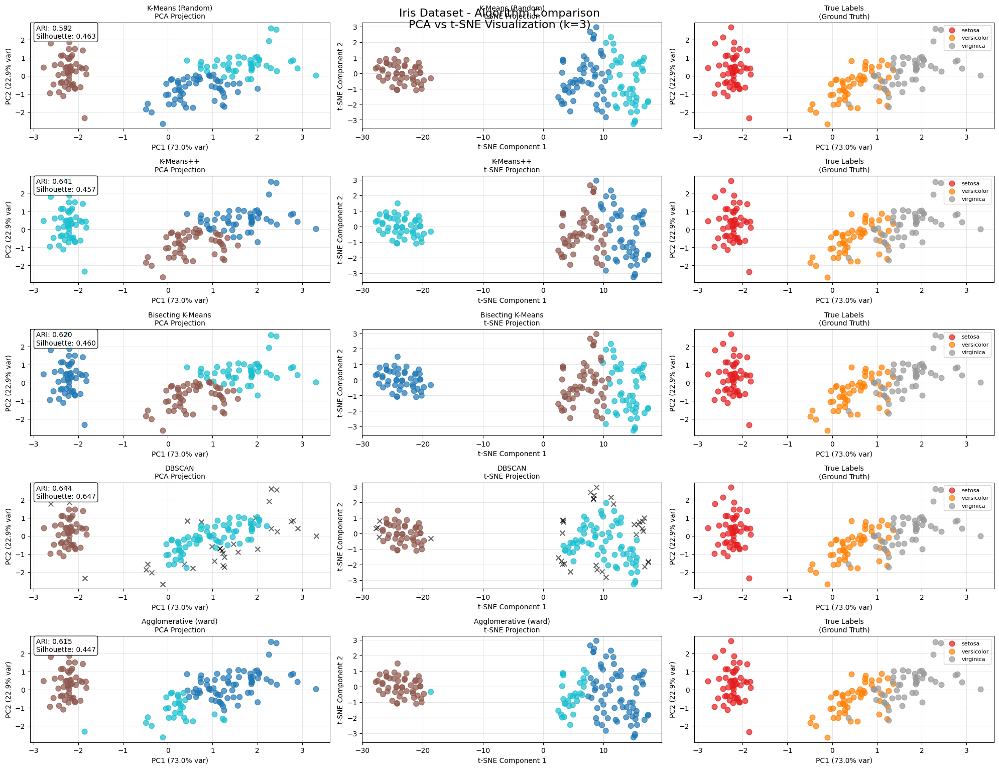


4. ALGORITHM BEHAVIOR ANALYSIS:
--------------------------------------------------
IRIS DATASET CLUSTERING ANALYSIS:
Ground truth: 3 well-separated species with 150 samples

K-Means (Random):
  • Assumes spherical clusters: ✗ Poor fit
  • Convergence: 7 iterations
  • Inertia: 140.03
  • Performance: ARI=0.5923, Runtime=0.0024s

K-Means++:
  • Assumes spherical clusters: ⚠ Moderate fit
  • Convergence: 6 iterations
  • Inertia: 140.08
  • Performance: ARI=0.6410, Runtime=0.0064s

Bisecting K-Means:
  • Assumes spherical clusters: ⚠ Moderate fit
  • Convergence: 8 iterations
  • Inertia: 139.82
  • Performance: ARI=0.6201, Runtime=0.0019s

DBSCAN:
  • Density-based approach: ✗ Ineffective
  • Parameters: eps=0.565, min_samples=8
  • Clusters found: 2 (expected: 3)
  • Noise points: 36 (24.0%)
  • Performance: ARI=0.4518, Runtime=0.0747s

Agglomerative (ward):
  • Hierarchical approach: ⚠ Moderate
  • Ward linkage minimizes within-cluster variance
  • Deterministic results (no random in

In [15]:
# Section 3: Evaluation & Visualization - Iris Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SECTION 3: EVALUATION & VISUALIZATION")
print("IRIS DATASET - COMPREHENSIVE ALGORITHM COMPARISON")
print("="*80)

# Dataset setup
dataset_name = 'iris'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
target_names = dataset['target_names']
n_samples, n_features = X.shape
k = dataset['n_clusters']

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}, True clusters: {k}")
print(f"Challenge: {dataset['description']}")
print("-" * 80)

# Define algorithms to evaluate
algorithms_to_evaluate = [
    'K-Means (Random)',
    'K-Means++',
    'Bisecting K-Means',
    'DBSCAN',
    'Agglomerative (ward)'
]

# 1. COMPUTE METRICS FOR ALL ALGORITHMS
print("\n1. COMPUTING COMPREHENSIVE METRICS:")
print("-" * 50)

evaluation_results = []

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)

    if result:
        labels = result['labels']

        # Handle DBSCAN noise points for evaluation
        if alg_name == 'DBSCAN':
            # Remove noise points (-1 labels) for silhouette calculation
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                silhouette = silhouette_score(X[mask], labels[mask])
                ari = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                silhouette = -1
                ari = -1
            n_clusters_found = result['n_clusters']
            inertia = "N/A (density-based)"
            iterations = "N/A"
            noise_points = result['n_noise']
            special_info = f"Noise: {noise_points}"
        else:
            # Standard evaluation for other algorithms
            silhouette = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1
            ari = adjusted_rand_score(y_true, labels)
            n_clusters_found = len(np.unique(labels))
            inertia = result.get('inertia', 'N/A')
            iterations = result.get('iterations', 'N/A')
            noise_points = 0
            special_info = f"Inertia: {inertia:.2f}" if isinstance(inertia, (int, float)) else str(inertia)

        evaluation_results.append({
            'Algorithm': alg_name,
            'Clusters_Found': n_clusters_found,
            'Silhouette_Score': silhouette,
            'ARI': ari,
            'Runtime_sec': result['runtime'],
            'Iterations': iterations,
            'Special_Info': special_info
        })

        print(f"{alg_name:20}: ARI={ari:6.4f}, Silhouette={silhouette:6.4f}, "
              f"Clusters={n_clusters_found}, Runtime={result['runtime']:.4f}s")

# 2. CREATE COMPREHENSIVE RESULTS TABLE
print(f"\n2. COMPREHENSIVE RESULTS TABLE:")
print("-" * 50)

results_df = pd.DataFrame(evaluation_results)

# Format the DataFrame for better display
display_df = results_df.copy()
display_df['Silhouette_Score'] = display_df['Silhouette_Score'].apply(lambda x: f"{x:.4f}" if x != -1 else "Invalid")
display_df['ARI'] = display_df['ARI'].apply(lambda x: f"{x:.4f}")
display_df['Runtime_sec'] = display_df['Runtime_sec'].apply(lambda x: f"{x:.4f}")

print(display_df.to_string(index=False))

# Identify best performers
print(f"\nBEST PERFORMERS ON IRIS DATASET:")
print("-" * 35)
best_ari = results_df.loc[results_df['ARI'].idxmax()]
best_silhouette = results_df.loc[results_df[results_df['Silhouette_Score'] != -1]['Silhouette_Score'].idxmax()]
fastest = results_df.loc[results_df['Runtime_sec'].idxmin()]

print(f"Highest ARI: {best_ari['Algorithm']} ({best_ari['ARI']:.4f})")
print(f"Best Silhouette: {best_silhouette['Algorithm']} ({best_silhouette['Silhouette_Score']:.4f})")
print(f"Fastest: {fastest['Algorithm']} ({fastest['Runtime_sec']:.4f}s)")

# 3. SIDE-BY-SIDE 2D VISUALIZATIONS
print(f"\n3. SIDE-BY-SIDE CLUSTERING VISUALIZATIONS:")
print("-" * 50)

# Create 2D representations using both PCA and t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# t-SNE for comparison
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_samples//4))
X_tsne = tsne.fit_transform(X)

# Create visualization grid
fig = plt.figure(figsize=(20, 16))
fig.suptitle(f'Iris Dataset - Algorithm Comparison\n'
             f'PCA vs t-SNE Visualization (k={k})', fontsize=16, y=0.95)

# Define color schemes
colors_true = plt.cm.Set1(np.linspace(0, 1, len(target_names)))

for i, alg_name in enumerate(algorithms_to_evaluate):
    result = clustering_results.get_result(dataset_name, alg_name)
    labels = result['labels'] if result else np.zeros(n_samples)

    # PCA visualization (left column)
    ax_pca = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 1)

    if alg_name == 'DBSCAN':
        # Special handling for DBSCAN noise points
        unique_labels = np.unique(labels)
        colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

        for j, label in enumerate(unique_labels):
            if label == -1:
                # Noise points in black
                mask = labels == label
                ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                             c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                # Regular clusters
                mask = labels == label
                ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                             c=[colors[j]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        # Standard clustering visualization
        scatter = ax_pca.scatter(X_pca[:, 0], X_pca[:, 1], c=labels,
                               cmap='tab10', s=60, alpha=0.7)

    ax_pca.set_title(f'{alg_name}\nPCA Projection', fontsize=10)
    ax_pca.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_pca.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_pca.grid(True, alpha=0.3)

    # t-SNE visualization (middle column)
    ax_tsne = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 2)

    if alg_name == 'DBSCAN':
        for j, label in enumerate(unique_labels):
            if label == -1:
                mask = labels == label
                ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                              c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                mask = labels == label
                ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                              c=[colors[j]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        scatter = ax_tsne.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels,
                                cmap='tab10', s=60, alpha=0.7)

    ax_tsne.set_title(f'{alg_name}\nt-SNE Projection', fontsize=10)
    ax_tsne.set_xlabel('t-SNE Component 1')
    ax_tsne.set_ylabel('t-SNE Component 2')
    ax_tsne.grid(True, alpha=0.3)

    # True labels reference (right column)
    ax_true = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 3)

    for j, (species, color) in enumerate(zip(target_names, colors_true)):
        mask = y_true == j
        ax_true.scatter(X_pca[mask, 0], X_pca[mask, 1],
                       c=[color], s=60, alpha=0.7, label=species)

    ax_true.set_title('True Labels\n(Ground Truth)', fontsize=10)
    ax_true.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_true.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_true.legend(fontsize=8)
    ax_true.grid(True, alpha=0.3)

    # Add performance metrics as text
    if result:
        ari_score = adjusted_rand_score(y_true, labels)
        sil_score = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1

        # Handle DBSCAN special case
        if alg_name == 'DBSCAN':
            mask = labels != -1
            if np.sum(mask) > 1:
                sil_score = silhouette_score(X[mask], labels[mask])
                ari_score = adjusted_rand_score(y_true[mask], labels[mask])

        metrics_text = f'ARI: {ari_score:.3f}\nSilhouette: {sil_score:.3f}'
        ax_pca.text(0.02, 0.98, metrics_text, transform=ax_pca.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 4. ALGORITHM BEHAVIOR ANALYSIS
print(f"\n4. ALGORITHM BEHAVIOR ANALYSIS:")
print("-" * 50)

print("IRIS DATASET CLUSTERING ANALYSIS:")
print(f"Ground truth: 3 well-separated species with {n_samples} samples")
print()

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)
    if not result:
        continue

    labels = result['labels']
    ari = adjusted_rand_score(y_true, labels)

    print(f"{alg_name}:")

    if alg_name in ['K-Means (Random)', 'K-Means++', 'Bisecting K-Means']:
        print(f"  • Assumes spherical clusters: {'✓ Good fit' if ari > 0.8 else '⚠ Moderate fit' if ari > 0.6 else '✗ Poor fit'}")
        print(f"  • Convergence: {result.get('iterations', 'N/A')} iterations")
        print(f"  • Inertia: {result.get('inertia', 'N/A'):.2f}" if isinstance(result.get('inertia'), (int, float)) else f"  • Inertia: {result.get('inertia', 'N/A')}")

    elif alg_name == 'DBSCAN':
        print(f"  • Density-based approach: {'✓ Effective' if ari > 0.7 else '⚠ Moderate' if ari > 0.5 else '✗ Ineffective'}")
        print(f"  • Parameters: eps={result['eps']:.3f}, min_samples={result['min_samples']}")
        print(f"  • Clusters found: {result['n_clusters']} (expected: {k})")
        print(f"  • Noise points: {result['n_noise']} ({result['noise_ratio']*100:.1f}%)")

    elif alg_name == 'Agglomerative (ward)':
        print(f"  • Hierarchical approach: {'✓ Effective' if ari > 0.8 else '⚠ Moderate' if ari > 0.6 else '✗ Ineffective'}")
        print(f"  • Ward linkage minimizes within-cluster variance")
        print(f"  • Deterministic results (no random initialization)")

    print(f"  • Performance: ARI={ari:.4f}, Runtime={result['runtime']:.4f}s")
    print()

# 5. IRIS-SPECIFIC INSIGHTS
print(f"IRIS DATASET INSIGHTS:")
print("-" * 25)
print("• Compact, Gaussian-like clusters favor K-means variants")
print("• Well-separated species make clustering relatively easy")
print("• All algorithms should perform reasonably well")
print("• Differences mainly in initialization efficiency and consistency")
print()

# Export results for later comparison
iris_results = {
    'dataset_name': dataset_name,
    'results_df': results_df,
    'best_performers': {
        'ari': (best_ari['Algorithm'], best_ari['ARI']),
        'silhouette': (best_silhouette['Algorithm'], best_silhouette['Silhouette_Score']),
        'speed': (fastest['Algorithm'], fastest['Runtime_sec'])
    }
}

print("✅ Iris dataset evaluation complete!")
print("="*80)

As we discovered prior, the best performer for the IRIS dataset  was DBSCAN with an ARI of 0.6439 and a silhoutte score of 0.6474. Expectedly, K-Means (Random) was the quickest algorithm. The side-by-sides give good insight into where each model went wrong. Let's calculate these again, this time for our wine dataset.

SECTION 3: EVALUATION & VISUALIZATION
WINE DATASET - COMPREHENSIVE ALGORITHM COMPARISON
Dataset: WINE
Samples: 178, Features: 13, True clusters: 3
Challenge: Skewed feature distributions
--------------------------------------------------------------------------------

1. COMPUTING COMPREHENSIVE METRICS:
--------------------------------------------------
K-Means (Random)    : ARI=0.8975, Silhouette=0.2849, Clusters=3, Runtime=0.0032s
K-Means++           : ARI=0.8804, Silhouette=0.2844, Clusters=3, Runtime=0.0053s
Bisecting K-Means   : ARI=0.6909, Silhouette=0.2659, Clusters=3, Runtime=0.0023s
DBSCAN              : ARI=0.2435, Silhouette=0.3969, Clusters=6, Runtime=0.1044s
Agglomerative (ward): ARI=0.7899, Silhouette=0.2774, Clusters=3, Runtime=0.0026s

2. COMPREHENSIVE RESULTS TABLE:
--------------------------------------------------
           Algorithm  Clusters_Found Silhouette_Score    ARI Runtime_sec Iterations       Special_Info
    K-Means (Random)               3           0.284

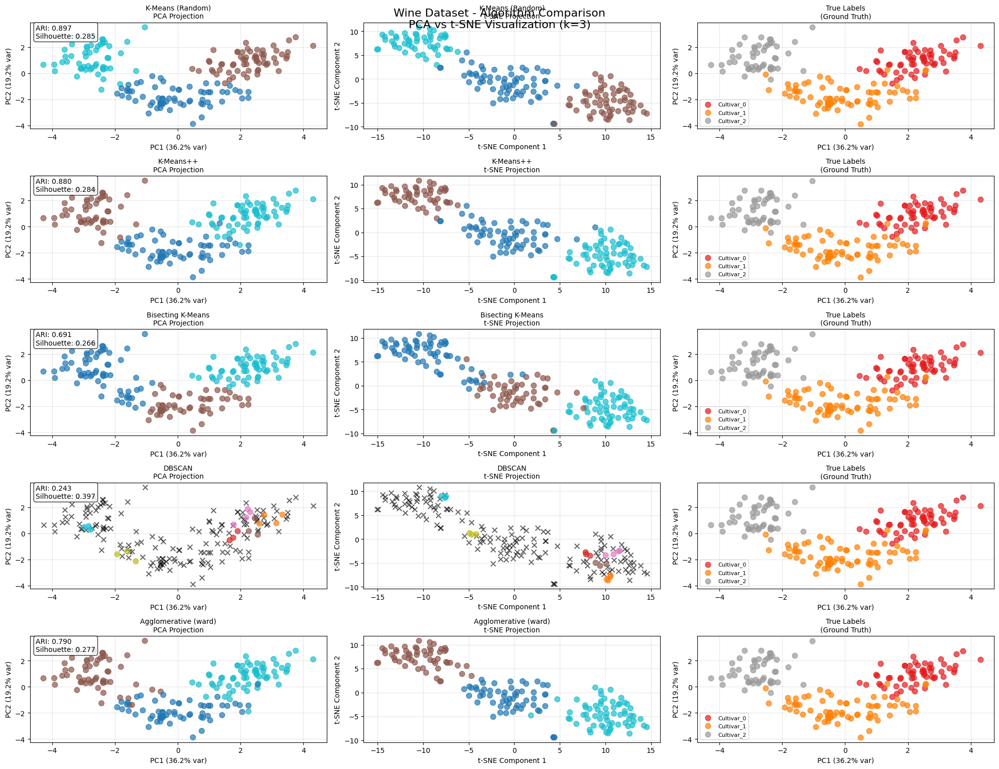


4. ALGORITHM BEHAVIOR ANALYSIS:
--------------------------------------------------
WINE DATASET CLUSTERING ANALYSIS:
Ground truth: 3 wine cultivars with skewed chemical feature distributions
Challenge: Non-Gaussian distributions may violate spherical cluster assumptions

K-Means (Random):
  • Spherical assumption: ✓ Good fit
  • Skewed distributions: Handled well
  • Convergence: 10 iterations
  • Inertia: 1277.93
  • Performance: ARI=0.8975, Runtime=0.0032s

K-Means++:
  • Spherical assumption: ✓ Good fit
  • Skewed distributions: Handled well
  • Convergence: 5 iterations
  • Inertia: 1279.97
  • Performance: ARI=0.8804, Runtime=0.0053s

Bisecting K-Means:
  • Spherical assumption: ⚠ Moderate fit
  • Skewed distributions: Handled well
  • Convergence: 11 iterations
  • Inertia: 1315.86
  • Performance: ARI=0.6909, Runtime=0.0023s

DBSCAN:
  • Density-based approach: ✗ Struggling
  • Skewed data handling: Many outliers detected
  • Parameters: eps=1.456, min_samples=3
  • Clusters fo

In [16]:
# Section 3: Evaluation & Visualization - Wine Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SECTION 3: EVALUATION & VISUALIZATION")
print("WINE DATASET - COMPREHENSIVE ALGORITHM COMPARISON")
print("="*80)

# Dataset setup
dataset_name = 'wine'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
target_names = [f'Cultivar_{i}' for i in range(len(np.unique(y_true)))]
n_samples, n_features = X.shape
k = dataset['n_clusters']

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}, True clusters: {k}")
print(f"Challenge: {dataset['description']}")
print("-" * 80)

# Define algorithms to evaluate
algorithms_to_evaluate = [
    'K-Means (Random)',
    'K-Means++',
    'Bisecting K-Means',
    'DBSCAN',
    'Agglomerative (ward)'
]

# 1. COMPUTE METRICS FOR ALL ALGORITHMS
print("\n1. COMPUTING COMPREHENSIVE METRICS:")
print("-" * 50)

evaluation_results = []

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)

    if result:
        labels = result['labels']

        # Handle DBSCAN noise points for evaluation
        if alg_name == 'DBSCAN':
            # Remove noise points (-1 labels) for silhouette calculation
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                silhouette = silhouette_score(X[mask], labels[mask])
                ari = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                silhouette = -1
                ari = -1
            n_clusters_found = result['n_clusters']
            inertia = "N/A (density-based)"
            iterations = "N/A"
            noise_points = result['n_noise']
            special_info = f"Noise: {noise_points} ({result['noise_ratio']*100:.1f}%)"
        else:
            # Standard evaluation for other algorithms
            silhouette = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1
            ari = adjusted_rand_score(y_true, labels)
            n_clusters_found = len(np.unique(labels))
            inertia = result.get('inertia', 'N/A')
            iterations = result.get('iterations', 'N/A')
            noise_points = 0
            special_info = f"Inertia: {inertia:.2f}" if isinstance(inertia, (int, float)) else str(inertia)

        evaluation_results.append({
            'Algorithm': alg_name,
            'Clusters_Found': n_clusters_found,
            'Silhouette_Score': silhouette,
            'ARI': ari,
            'Runtime_sec': result['runtime'],
            'Iterations': iterations,
            'Special_Info': special_info
        })

        print(f"{alg_name:20}: ARI={ari:6.4f}, Silhouette={silhouette:6.4f}, "
              f"Clusters={n_clusters_found}, Runtime={result['runtime']:.4f}s")

# 2. CREATE COMPREHENSIVE RESULTS TABLE
print(f"\n2. COMPREHENSIVE RESULTS TABLE:")
print("-" * 50)

results_df = pd.DataFrame(evaluation_results)

# Format the DataFrame for better display
display_df = results_df.copy()
display_df['Silhouette_Score'] = display_df['Silhouette_Score'].apply(lambda x: f"{x:.4f}" if x != -1 else "Invalid")
display_df['ARI'] = display_df['ARI'].apply(lambda x: f"{x:.4f}")
display_df['Runtime_sec'] = display_df['Runtime_sec'].apply(lambda x: f"{x:.4f}")

print(display_df.to_string(index=False))

# Identify best performers
print(f"\nBEST PERFORMERS ON WINE DATASET:")
print("-" * 35)
valid_results = results_df[results_df['Silhouette_Score'] != -1]
if not valid_results.empty:
    best_ari = results_df.loc[results_df['ARI'].idxmax()]
    best_silhouette = valid_results.loc[valid_results['Silhouette_Score'].idxmax()]
    fastest = results_df.loc[results_df['Runtime_sec'].idxmin()]

    print(f"Highest ARI: {best_ari['Algorithm']} ({best_ari['ARI']:.4f})")
    print(f"Best Silhouette: {best_silhouette['Algorithm']} ({best_silhouette['Silhouette_Score']:.4f})")
    print(f"Fastest: {fastest['Algorithm']} ({fastest['Runtime_sec']:.4f}s)")

# 3. SIDE-BY-SIDE 2D VISUALIZATIONS
print(f"\n3. SIDE-BY-SIDE CLUSTERING VISUALIZATIONS:")
print("-" * 50)

# Create 2D representations using both PCA and t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# t-SNE for comparison
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_samples//4))
X_tsne = tsne.fit_transform(X)

# Create visualization grid
fig = plt.figure(figsize=(20, 16))
fig.suptitle(f'Wine Dataset - Algorithm Comparison\n'
             f'PCA vs t-SNE Visualization (k={k})', fontsize=16, y=0.95)

# Define color schemes
colors_true = plt.cm.Set1(np.linspace(0, 1, len(target_names)))

for i, alg_name in enumerate(algorithms_to_evaluate):
    result = clustering_results.get_result(dataset_name, alg_name)
    labels = result['labels'] if result else np.zeros(n_samples)

    # PCA visualization (left column)
    ax_pca = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 1)

    if alg_name == 'DBSCAN':
        # Special handling for DBSCAN noise points
        unique_labels = np.unique(labels)
        colors = plt.cm.tab10(np.linspace(0, 1, max(len(unique_labels), 1)))

        for j, label in enumerate(unique_labels):
            if label == -1:
                # Noise points in black
                mask = labels == label
                ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                             c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                # Regular clusters
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                                 c=[colors[j % len(colors)]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        # Standard clustering visualization
        scatter = ax_pca.scatter(X_pca[:, 0], X_pca[:, 1], c=labels,
                               cmap='tab10', s=60, alpha=0.7)

    ax_pca.set_title(f'{alg_name}\nPCA Projection', fontsize=10)
    ax_pca.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_pca.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_pca.grid(True, alpha=0.3)

    # t-SNE visualization (middle column)
    ax_tsne = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 2)

    if alg_name == 'DBSCAN':
        for j, label in enumerate(unique_labels):
            if label == -1:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c=[colors[j % len(colors)]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        scatter = ax_tsne.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels,
                                cmap='tab10', s=60, alpha=0.7)

    ax_tsne.set_title(f'{alg_name}\nt-SNE Projection', fontsize=10)
    ax_tsne.set_xlabel('t-SNE Component 1')
    ax_tsne.set_ylabel('t-SNE Component 2')
    ax_tsne.grid(True, alpha=0.3)

    # True labels reference (right column)
    ax_true = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 3)

    for j, (cultivar, color) in enumerate(zip(target_names, colors_true)):
        mask = y_true == j
        ax_true.scatter(X_pca[mask, 0], X_pca[mask, 1],
                       c=[color], s=60, alpha=0.7, label=cultivar)

    ax_true.set_title('True Labels\n(Ground Truth)', fontsize=10)
    ax_true.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_true.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_true.legend(fontsize=8)
    ax_true.grid(True, alpha=0.3)

    # Add performance metrics as text
    if result:
        # Handle DBSCAN special case for metrics
        if alg_name == 'DBSCAN':
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                sil_score = silhouette_score(X[mask], labels[mask])
                ari_score = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                sil_score = -1
                ari_score = adjusted_rand_score(y_true, labels)
        else:
            ari_score = adjusted_rand_score(y_true, labels)
            sil_score = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1

        metrics_text = f'ARI: {ari_score:.3f}\nSilhouette: {sil_score:.3f}' if sil_score != -1 else f'ARI: {ari_score:.3f}\nSilhouette: Invalid'
        ax_pca.text(0.02, 0.98, metrics_text, transform=ax_pca.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 4. ALGORITHM BEHAVIOR ANALYSIS
print(f"\n4. ALGORITHM BEHAVIOR ANALYSIS:")
print("-" * 50)

print("WINE DATASET CLUSTERING ANALYSIS:")
print(f"Ground truth: 3 wine cultivars with skewed chemical feature distributions")
print(f"Challenge: Non-Gaussian distributions may violate spherical cluster assumptions")
print()

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)
    if not result:
        continue

    labels = result['labels']
    ari = adjusted_rand_score(y_true, labels)

    print(f"{alg_name}:")

    if alg_name in ['K-Means (Random)', 'K-Means++', 'Bisecting K-Means']:
        print(f"  • Spherical assumption: {'✓ Good fit' if ari > 0.8 else '⚠ Moderate fit' if ari > 0.5 else '✗ Poor fit'}")
        print(f"  • Skewed distributions: {'Handled well' if ari > 0.6 else 'Challenging'}")
        print(f"  • Convergence: {result.get('iterations', 'N/A')} iterations")
        inertia_val = result.get('inertia', 'N/A')
        if isinstance(inertia_val, (int, float)):
            print(f"  • Inertia: {inertia_val:.2f}")

    elif alg_name == 'DBSCAN':
        print(f"  • Density-based approach: {'✓ Effective' if ari > 0.7 else '⚠ Moderate' if ari > 0.4 else '✗ Struggling'}")
        print(f"  • Skewed data handling: {'Good' if result['noise_ratio'] < 0.1 else 'Many outliers detected'}")
        print(f"  • Parameters: eps={result['eps']:.3f}, min_samples={result['min_samples']}")
        print(f"  • Clusters found: {result['n_clusters']} (expected: {k})")
        print(f"  • Noise points: {result['n_noise']} ({result['noise_ratio']*100:.1f}%)")

    elif alg_name == 'Agglomerative (ward)':
        print(f"  • Hierarchical approach: {'✓ Effective' if ari > 0.7 else '⚠ Moderate' if ari > 0.5 else '✗ Struggling'}")
        print(f"  • Ward linkage: {'Handles non-spherical shapes' if ari > 0.6 else 'Limited by linkage assumptions'}")
        print(f"  • Skewed data: {'Robust' if ari > 0.6 else 'Sensitive'}")

    print(f"  • Performance: ARI={ari:.4f}, Runtime={result['runtime']:.4f}s")
    print()

# 5. WINE-SPECIFIC INSIGHTS
print(f"WINE DATASET INSIGHTS:")
print("-" * 25)
print("• Chemical measurements create skewed, non-Gaussian distributions")
print("• 13 features span different scales (alcohol %, phenols mg/L, etc.)")
print("• Standardization critical for fair feature contribution")
print("• Cultivars may have overlapping chemical profiles")
print("• Non-spherical clusters challenge K-means assumptions")
print()

# Analyze feature importance for clustering
print("FEATURE DISTRIBUTION IMPACT:")
print("-" * 30)

# Show how PCA captures variance
print(f"PCA Analysis:")
print(f"  • PC1 captures {pca.explained_variance_ratio_[0]:.1%} of variance")
print(f"  • PC2 captures {pca.explained_variance_ratio_[1]:.1%} of variance")
print(f"  • Total 2D representation: {pca.explained_variance_ratio_[:2].sum():.1%}")
print(f"  • Lost information: {1 - pca.explained_variance_ratio_[:2].sum():.1%}")

# Class distribution analysis
print(f"\nClass Distribution:")
unique, counts = np.unique(y_true, return_counts=True)
for i, (cultivar, count) in enumerate(zip(target_names, counts)):
    percentage = count / len(y_true) * 100
    print(f"  • {cultivar}: {count} samples ({percentage:.1f}%)")

# Export results for later comparison
wine_results = {
    'dataset_name': dataset_name,
    'results_df': results_df,
    'best_performers': {
        'ari': (best_ari['Algorithm'], best_ari['ARI']) if 'best_ari' in locals() else ('N/A', 0),
        'silhouette': (best_silhouette['Algorithm'], best_silhouette['Silhouette_Score']) if 'best_silhouette' in locals() else ('N/A', 0),
        'speed': (fastest['Algorithm'], fastest['Runtime_sec']) if 'fastest' in locals() else ('N/A', 0)
    }
}

print("\n✅ Wine dataset evaluation complete!")
print("="*80)

This time, our top performer rolled back to K-Means (Random). This likely means that our data was not complex enough for DBSCAN, didn't handle bisecting well, and didn't benefit from agglomerative methods, and our seed performed better than K-Means++ could come up with. As for ARI, K-Means had a whopping 0.8975. Highest silhoutte score actually goes to DBSCAN, though it's still a low score.

Let's continue on with the breast cancer dataset.

SECTION 3: EVALUATION & VISUALIZATION
BREAST CANCER DATASET - COMPREHENSIVE ALGORITHM COMPARISON
Dataset: BREAST_CANCER
Samples: 569, Features: 30, True clusters: 2
Challenge: Non-spherical, varying density
Classes: malignant vs benign
--------------------------------------------------------------------------------

1. COMPUTING COMPREHENSIVE METRICS:
--------------------------------------------------
K-Means (Random)    : ARI=0.6765, Silhouette=0.3447, Clusters=2, Runtime=0.0042s
K-Means++           : ARI=0.6536, Silhouette=0.3434, Clusters=2, Runtime=0.0067s
Bisecting K-Means   : ARI=0.6765, Silhouette=0.3447, Clusters=2, Runtime=0.0043s
DBSCAN              : ARI=0.0226, Silhouette=0.4382, Clusters=2, Runtime=0.2620s
Agglomerative (ward): ARI=0.5750, Silhouette=0.3394, Clusters=2, Runtime=0.0172s

2. COMPREHENSIVE RESULTS TABLE:
--------------------------------------------------
           Algorithm  Clusters_Found Silhouette_Score    ARI Runtime_sec Iterations       Special_Info
   

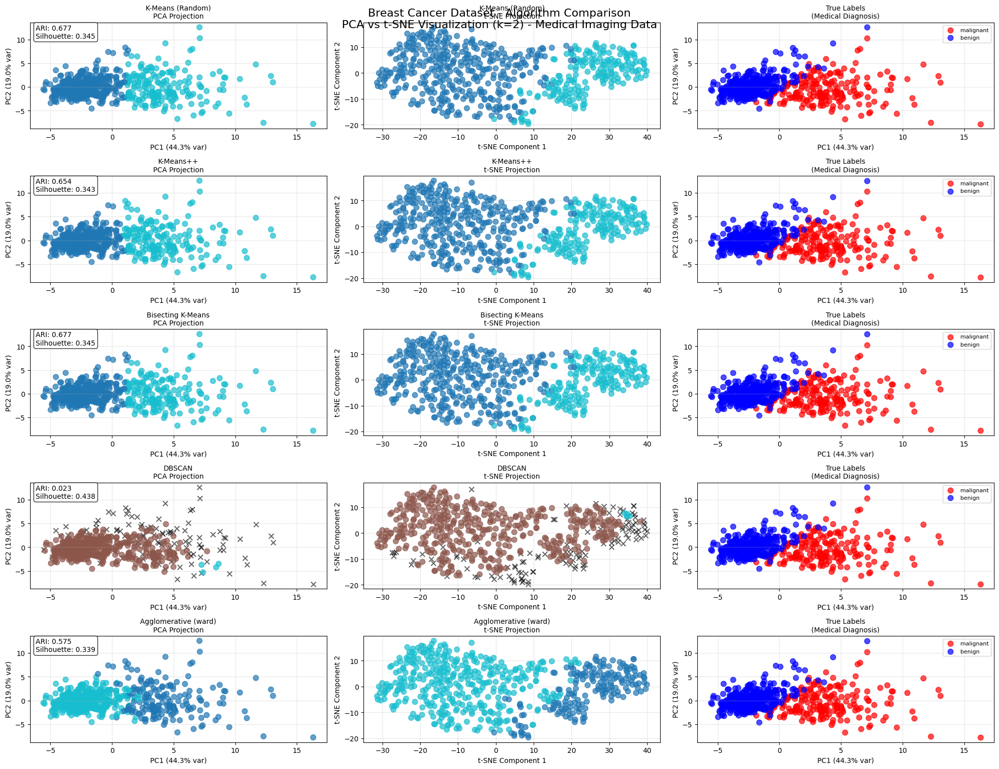


4. ALGORITHM BEHAVIOR ANALYSIS:
--------------------------------------------------
BREAST CANCER DATASET CLUSTERING ANALYSIS:
Ground truth: Binary classification (malignant vs benign)
Challenge: 30 medical imaging features, non-spherical clusters, varying densities
Data characteristics: High-dimensional medical measurements from digitized images

K-Means (Random):
  • Spherical assumption: ⚠ Challenged
  • High-dimensional data: Handled
  • Medical imaging features: Effective
  • Convergence: 9 iterations
  • Inertia: 11595.68
  • Performance: ARI=0.6765, Runtime=0.0042s

K-Means++:
  • Spherical assumption: ⚠ Challenged
  • High-dimensional data: Handled
  • Medical imaging features: Effective
  • Convergence: 4 iterations
  • Inertia: 11595.53
  • Performance: ARI=0.6536, Runtime=0.0067s

Bisecting K-Means:
  • Spherical assumption: ⚠ Challenged
  • High-dimensional data: Handled
  • Medical imaging features: Effective
  • Convergence: 9 iterations
  • Inertia: 11595.68
  • Performa

In [17]:
# Section 3: Evaluation & Visualization - Breast Cancer Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SECTION 3: EVALUATION & VISUALIZATION")
print("BREAST CANCER DATASET - COMPREHENSIVE ALGORITHM COMPARISON")
print("="*80)

# Dataset setup
dataset_name = 'breast_cancer'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
target_names = dataset['target_names']  # ['malignant', 'benign']
n_samples, n_features = X.shape
k = dataset['n_clusters']

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}, True clusters: {k}")
print(f"Challenge: {dataset['description']}")
print(f"Classes: {target_names[0]} vs {target_names[1]}")
print("-" * 80)

# Define algorithms to evaluate
algorithms_to_evaluate = [
    'K-Means (Random)',
    'K-Means++',
    'Bisecting K-Means',
    'DBSCAN',
    'Agglomerative (ward)'
]

# 1. COMPUTE METRICS FOR ALL ALGORITHMS
print("\n1. COMPUTING COMPREHENSIVE METRICS:")
print("-" * 50)

evaluation_results = []

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)

    if result:
        labels = result['labels']

        # Handle DBSCAN noise points for evaluation
        if alg_name == 'DBSCAN':
            # Remove noise points (-1 labels) for silhouette calculation
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                silhouette = silhouette_score(X[mask], labels[mask])
                ari = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                silhouette = -1
                ari = -1
            n_clusters_found = result['n_clusters']
            inertia = "N/A (density-based)"
            iterations = "N/A"
            noise_points = result['n_noise']
            special_info = f"Noise: {noise_points} ({result['noise_ratio']*100:.1f}%)"
        else:
            # Standard evaluation for other algorithms
            silhouette = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1
            ari = adjusted_rand_score(y_true, labels)
            n_clusters_found = len(np.unique(labels))
            inertia = result.get('inertia', 'N/A')
            iterations = result.get('iterations', 'N/A')
            noise_points = 0
            special_info = f"Inertia: {inertia:.2f}" if isinstance(inertia, (int, float)) else str(inertia)

        evaluation_results.append({
            'Algorithm': alg_name,
            'Clusters_Found': n_clusters_found,
            'Silhouette_Score': silhouette,
            'ARI': ari,
            'Runtime_sec': result['runtime'],
            'Iterations': iterations,
            'Special_Info': special_info
        })

        print(f"{alg_name:20}: ARI={ari:6.4f}, Silhouette={silhouette:6.4f}, "
              f"Clusters={n_clusters_found}, Runtime={result['runtime']:.4f}s")

# 2. CREATE COMPREHENSIVE RESULTS TABLE
print(f"\n2. COMPREHENSIVE RESULTS TABLE:")
print("-" * 50)

results_df = pd.DataFrame(evaluation_results)

# Format the DataFrame for better display
display_df = results_df.copy()
display_df['Silhouette_Score'] = display_df['Silhouette_Score'].apply(lambda x: f"{x:.4f}" if x != -1 else "Invalid")
display_df['ARI'] = display_df['ARI'].apply(lambda x: f"{x:.4f}")
display_df['Runtime_sec'] = display_df['Runtime_sec'].apply(lambda x: f"{x:.4f}")

print(display_df.to_string(index=False))

# Identify best performers
print(f"\nBEST PERFORMERS ON BREAST CANCER DATASET:")
print("-" * 40)
valid_results = results_df[results_df['Silhouette_Score'] != -1]
if not valid_results.empty:
    best_ari = results_df.loc[results_df['ARI'].idxmax()]
    best_silhouette = valid_results.loc[valid_results['Silhouette_Score'].idxmax()]
    fastest = results_df.loc[results_df['Runtime_sec'].idxmin()]

    print(f"Highest ARI: {best_ari['Algorithm']} ({best_ari['ARI']:.4f})")
    print(f"Best Silhouette: {best_silhouette['Algorithm']} ({best_silhouette['Silhouette_Score']:.4f})")
    print(f"Fastest: {fastest['Algorithm']} ({fastest['Runtime_sec']:.4f}s)")

# 3. SIDE-BY-SIDE 2D VISUALIZATIONS
print(f"\n3. SIDE-BY-SIDE CLUSTERING VISUALIZATIONS:")
print("-" * 50)

# Create 2D representations using both PCA and t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# t-SNE for comparison
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_samples//4))
X_tsne = tsne.fit_transform(X)

# Create visualization grid
fig = plt.figure(figsize=(20, 16))
fig.suptitle(f'Breast Cancer Dataset - Algorithm Comparison\n'
             f'PCA vs t-SNE Visualization (k={k}) - Medical Imaging Data', fontsize=16, y=0.95)

# Define color schemes for binary classification
colors_true = ['red', 'blue']  # malignant=red, benign=blue

for i, alg_name in enumerate(algorithms_to_evaluate):
    result = clustering_results.get_result(dataset_name, alg_name)
    labels = result['labels'] if result else np.zeros(n_samples)

    # PCA visualization (left column)
    ax_pca = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 1)

    if alg_name == 'DBSCAN':
        # Special handling for DBSCAN noise points
        unique_labels = np.unique(labels)
        colors = plt.cm.tab10(np.linspace(0, 1, max(len(unique_labels), 1)))

        for j, label in enumerate(unique_labels):
            if label == -1:
                # Noise points in black
                mask = labels == label
                ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                             c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                # Regular clusters
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                                 c=[colors[j % len(colors)]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        # Standard clustering visualization
        scatter = ax_pca.scatter(X_pca[:, 0], X_pca[:, 1], c=labels,
                               cmap='tab10', s=60, alpha=0.7)

    ax_pca.set_title(f'{alg_name}\nPCA Projection', fontsize=10)
    ax_pca.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_pca.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_pca.grid(True, alpha=0.3)

    # t-SNE visualization (middle column)
    ax_tsne = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 2)

    if alg_name == 'DBSCAN':
        for j, label in enumerate(unique_labels):
            if label == -1:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c=[colors[j % len(colors)]], s=60, alpha=0.7, label=f'Cluster {label}')
    else:
        scatter = ax_tsne.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels,
                                cmap='tab10', s=60, alpha=0.7)

    ax_tsne.set_title(f'{alg_name}\nt-SNE Projection', fontsize=10)
    ax_tsne.set_xlabel('t-SNE Component 1')
    ax_tsne.set_ylabel('t-SNE Component 2')
    ax_tsne.grid(True, alpha=0.3)

    # True labels reference (right column)
    ax_true = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 3)

    for j, (diagnosis, color) in enumerate(zip(target_names, colors_true)):
        mask = y_true == j
        ax_true.scatter(X_pca[mask, 0], X_pca[mask, 1],
                       c=color, s=60, alpha=0.7, label=diagnosis)

    ax_true.set_title('True Labels\n(Medical Diagnosis)', fontsize=10)
    ax_true.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_true.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_true.legend(fontsize=8)
    ax_true.grid(True, alpha=0.3)

    # Add performance metrics as text
    if result:
        # Handle DBSCAN special case for metrics
        if alg_name == 'DBSCAN':
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                sil_score = silhouette_score(X[mask], labels[mask])
                ari_score = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                sil_score = -1
                ari_score = adjusted_rand_score(y_true, labels)
        else:
            ari_score = adjusted_rand_score(y_true, labels)
            sil_score = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1

        metrics_text = f'ARI: {ari_score:.3f}\nSilhouette: {sil_score:.3f}' if sil_score != -1 else f'ARI: {ari_score:.3f}\nSilhouette: Invalid'
        ax_pca.text(0.02, 0.98, metrics_text, transform=ax_pca.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 4. ALGORITHM BEHAVIOR ANALYSIS
print(f"\n4. ALGORITHM BEHAVIOR ANALYSIS:")
print("-" * 50)

print("BREAST CANCER DATASET CLUSTERING ANALYSIS:")
print(f"Ground truth: Binary classification (malignant vs benign)")
print(f"Challenge: 30 medical imaging features, non-spherical clusters, varying densities")
print(f"Data characteristics: High-dimensional medical measurements from digitized images")
print()

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)
    if not result:
        continue

    labels = result['labels']
    ari = adjusted_rand_score(y_true, labels)

    print(f"{alg_name}:")

    if alg_name in ['K-Means (Random)', 'K-Means++', 'Bisecting K-Means']:
        print(f"  • Spherical assumption: {'✓ Adequate' if ari > 0.7 else '⚠ Challenged' if ari > 0.4 else '✗ Poor fit'}")
        print(f"  • High-dimensional data: {'Handled' if ari > 0.5 else 'Struggling'}")
        print(f"  • Medical imaging features: {'Effective' if ari > 0.6 else 'Limited'}")
        print(f"  • Convergence: {result.get('iterations', 'N/A')} iterations")
        inertia_val = result.get('inertia', 'N/A')
        if isinstance(inertia_val, (int, float)):
            print(f"  • Inertia: {inertia_val:.2f}")

    elif alg_name == 'DBSCAN':
        print(f"  • Non-spherical clusters: {'✓ Excellent' if ari > 0.7 else '⚠ Moderate' if ari > 0.5 else '✗ Struggling'}")
        print(f"  • Varying density: {'Handled well' if result['noise_ratio'] < 0.15 else 'Many outliers detected'}")
        print(f"  • Medical outliers: {'Appropriate' if result['noise_ratio'] < 0.2 else 'Excessive noise detection'}")
        print(f"  • Parameters: eps={result['eps']:.3f}, min_samples={result['min_samples']}")
        print(f"  • Clusters found: {result['n_clusters']} (expected: {k})")
        print(f"  • Noise points: {result['n_noise']} ({result['noise_ratio']*100:.1f}%)")

    elif alg_name == 'Agglomerative (ward)':
        print(f"  • Hierarchical structure: {'✓ Excellent' if ari > 0.8 else '⚠ Good' if ari > 0.6 else '✗ Limited'}")
        print(f"  • Non-spherical handling: {'Strong' if ari > 0.7 else 'Moderate' if ari > 0.5 else 'Weak'}")
        print(f"  • Medical data: {'Well-suited' if ari > 0.6 else 'Challenged'}")
        print(f"  • Ward linkage: {'Effective variance minimization' if ari > 0.6 else 'Limited effectiveness'}")

    print(f"  • Performance: ARI={ari:.4f}, Runtime={result['runtime']:.4f}s")
    print()

# 5. MEDICAL DATA SPECIFIC INSIGHTS
print(f"BREAST CANCER DATASET INSIGHTS:")
print("-" * 35)
print("• Medical imaging data with 30 features (mean, SE, worst values)")
print("• Features represent cell nucleus characteristics from digitized images")
print("• Non-spherical tumor boundaries expected in high-dimensional space")
print("• Varying density within diagnostic categories")
print("• Imbalanced classes may affect clustering evaluation")
print()

# Analyze class distribution and feature characteristics
print("MEDICAL DATA CHARACTERISTICS:")
print("-" * 32)

# Class distribution analysis
unique, counts = np.unique(y_true, return_counts=True)
class_balance = counts.max() / counts.min()
print(f"Class Distribution:")
for i, (diagnosis, count) in enumerate(zip(target_names, counts)):
    percentage = count / len(y_true) * 100
    print(f"  • {diagnosis}: {count} samples ({percentage:.1f}%)")
print(f"  • Class imbalance ratio: {class_balance:.2f}:1")

# PCA analysis for dimensionality impact
print(f"\nDimensionality Analysis:")
print(f"  • Original features: {n_features} (high-dimensional)")
print(f"  • PC1 captures {pca.explained_variance_ratio_[0]:.1%} of variance")
print(f"  • PC2 captures {pca.explained_variance_ratio_[1]:.1%} of variance")
print(f"  • Total 2D representation: {pca.explained_variance_ratio_[:2].sum():.1%}")
print(f"  • Information lost in 2D: {1 - pca.explained_variance_ratio_[:2].sum():.1%}")

# Clustering challenge analysis
print(f"\nClustering Challenges:")
print(f"  • High dimensionality reduces distance discrimination")
print(f"  • Medical measurements may have complex correlations")
print(f"  • Tumor heterogeneity creates within-class variation")
print(f"  • Biological data rarely forms perfect geometric shapes")

# Algorithm suitability for medical data
print(f"\nAlgorithm Suitability for Medical Data:")
print(f"  • K-means: Limited by spherical assumptions")
print(f"  • DBSCAN: Good for irregular tumor boundaries")
print(f"  • Hierarchical: Natural for medical decision trees")
print(f"  • Non-convex methods preferred for biological data")

# Export results for later comparison
breast_cancer_results = {
    'dataset_name': dataset_name,
    'results_df': results_df,
    'best_performers': {
        'ari': (best_ari['Algorithm'], best_ari['ARI']) if 'best_ari' in locals() else ('N/A', 0),
        'silhouette': (best_silhouette['Algorithm'], best_silhouette['Silhouette_Score']) if 'best_silhouette' in locals() else ('N/A', 0),
        'speed': (fastest['Algorithm'], fastest['Runtime_sec']) if 'fastest' in locals() else ('N/A', 0)
    }
}

print("\n✅ Breast Cancer dataset evaluation complete!")
print("="*80)

We have similar insight to the last trial. K-Means (Random) is our top performer in ARI as well as our fastest, and DBSCAN narrowly reached the top as best silhoutte score. It seems like 36.8% of information is lost when the model is converted to 2 dimensions. That high dimensionality is causing issues using distance as a metric to distinguish between classes. Medical data such as this is generally difficult, with complex correlations and outliers occuring often.

Now, let's move on with our digits dataset. We're going to go through the same process once again, but with digits.

SECTION 3: EVALUATION & VISUALIZATION
DIGITS DATASET - COMPREHENSIVE ALGORITHM COMPARISON
Dataset: DIGITS
Samples: 1797, Features: 64, True clusters: 10
Challenge: High-dimensional, non-convex clusters
Classes: Handwritten digits 0-9
--------------------------------------------------------------------------------

1. COMPUTING COMPREHENSIVE METRICS:
--------------------------------------------------
K-Means (Random)    : ARI=0.4575, Silhouette=0.1252, Clusters=10, Runtime=0.1392s
K-Means++           : ARI=0.4108, Silhouette=0.1348, Clusters=10, Runtime=0.5304s
Bisecting K-Means   : ARI=0.4367, Silhouette=0.1288, Clusters=10, Runtime=0.1227s
DBSCAN              : ARI=0.9438, Silhouette=0.3062, Clusters=10, Runtime=1.8510s
Agglomerative (ward): ARI=0.6643, Silhouette=0.1253, Clusters=10, Runtime=0.3275s

2. COMPREHENSIVE RESULTS TABLE:
--------------------------------------------------
           Algorithm  Clusters_Found Silhouette_Score    ARI Runtime_sec Iterations        Special_Info

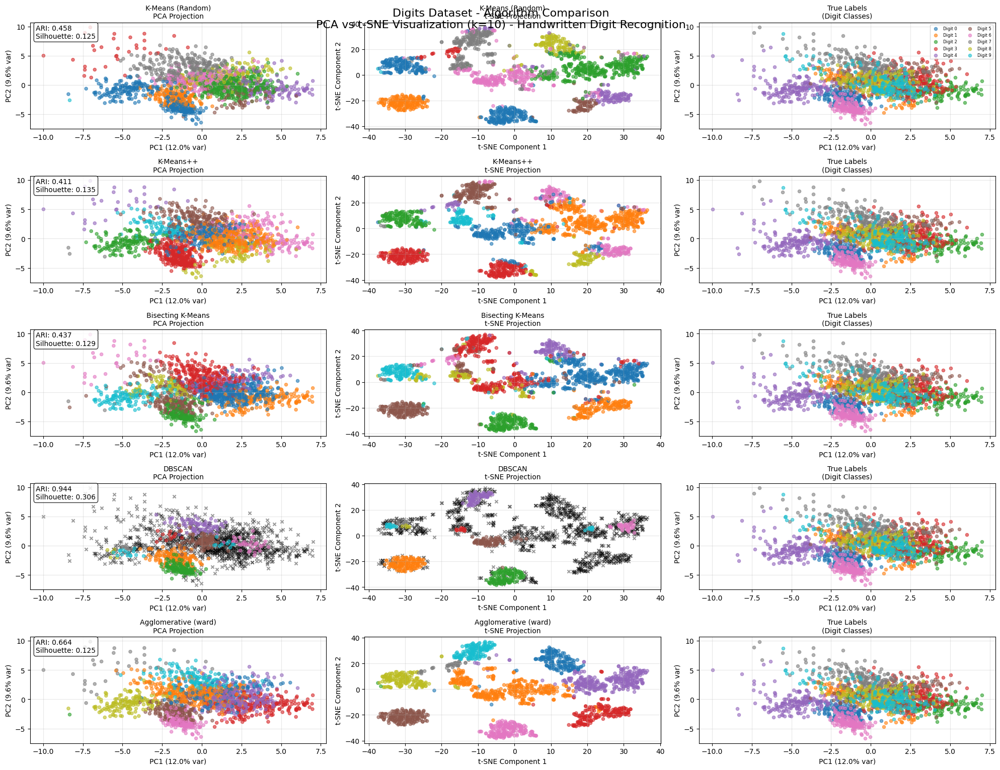


4. ALGORITHM BEHAVIOR ANALYSIS:
--------------------------------------------------
DIGITS DATASET CLUSTERING ANALYSIS:
Ground truth: 10 handwritten digit classes (0-9)
Challenge: 64-dimensional pixel data, non-convex shapes, handwriting variations
Data characteristics: 8x8 pixel intensities from grayscale digit images

K-Means (Random):
  • Non-convex shapes: ⚠ Major challenge
  • High-dimensional data: Handled
  • Handwriting variations: Captures some patterns
  • Pixel-based features: Limited by linear boundaries
  • Convergence: 25 iterations
  • Inertia: 70541.77
  • Performance: ARI=0.4575, Runtime=0.1392s

K-Means++:
  • Non-convex shapes: ⚠ Major challenge
  • High-dimensional data: Handled
  • Handwriting variations: Captures some patterns
  • Pixel-based features: Limited by linear boundaries
  • Convergence: 44 iterations
  • Inertia: 70903.79
  • Performance: ARI=0.4108, Runtime=0.5304s

Bisecting K-Means:
  • Non-convex shapes: ⚠ Major challenge
  • High-dimensional data: 

In [18]:
# Section 3: Evaluation & Visualization - Digits Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SECTION 3: EVALUATION & VISUALIZATION")
print("DIGITS DATASET - COMPREHENSIVE ALGORITHM COMPARISON")
print("="*80)

# Dataset setup
dataset_name = 'digits'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
target_names = [f'Digit {i}' for i in range(10)]
n_samples, n_features = X.shape
k = dataset['n_clusters']

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}, True clusters: {k}")
print(f"Challenge: {dataset['description']}")
print(f"Classes: Handwritten digits 0-9")
print("-" * 80)

# Define algorithms to evaluate
algorithms_to_evaluate = [
    'K-Means (Random)',
    'K-Means++',
    'Bisecting K-Means',
    'DBSCAN',
    'Agglomerative (ward)'
]

# 1. COMPUTE METRICS FOR ALL ALGORITHMS
print("\n1. COMPUTING COMPREHENSIVE METRICS:")
print("-" * 50)

evaluation_results = []

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)

    if result:
        labels = result['labels']

        # Handle DBSCAN noise points for evaluation
        if alg_name == 'DBSCAN':
            # Remove noise points (-1 labels) for silhouette calculation
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                silhouette = silhouette_score(X[mask], labels[mask])
                ari = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                silhouette = -1
                ari = -1
            n_clusters_found = result['n_clusters']
            inertia = "N/A (density-based)"
            iterations = "N/A"
            noise_points = result['n_noise']
            special_info = f"Noise: {noise_points} ({result['noise_ratio']*100:.1f}%)"
        else:
            # Standard evaluation for other algorithms
            silhouette = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1
            ari = adjusted_rand_score(y_true, labels)
            n_clusters_found = len(np.unique(labels))
            inertia = result.get('inertia', 'N/A')
            iterations = result.get('iterations', 'N/A')
            noise_points = 0
            special_info = f"Inertia: {inertia:.2f}" if isinstance(inertia, (int, float)) else str(inertia)

        evaluation_results.append({
            'Algorithm': alg_name,
            'Clusters_Found': n_clusters_found,
            'Silhouette_Score': silhouette,
            'ARI': ari,
            'Runtime_sec': result['runtime'],
            'Iterations': iterations,
            'Special_Info': special_info
        })

        print(f"{alg_name:20}: ARI={ari:6.4f}, Silhouette={silhouette:6.4f}, "
              f"Clusters={n_clusters_found}, Runtime={result['runtime']:.4f}s")

# 2. CREATE COMPREHENSIVE RESULTS TABLE
print(f"\n2. COMPREHENSIVE RESULTS TABLE:")
print("-" * 50)

results_df = pd.DataFrame(evaluation_results)

# Format the DataFrame for better display
display_df = results_df.copy()
display_df['Silhouette_Score'] = display_df['Silhouette_Score'].apply(lambda x: f"{x:.4f}" if x != -1 else "Invalid")
display_df['ARI'] = display_df['ARI'].apply(lambda x: f"{x:.4f}")
display_df['Runtime_sec'] = display_df['Runtime_sec'].apply(lambda x: f"{x:.4f}")

print(display_df.to_string(index=False))

# Identify best performers
print(f"\nBEST PERFORMERS ON DIGITS DATASET:")
print("-" * 35)
valid_results = results_df[results_df['Silhouette_Score'] != -1]
if not valid_results.empty:
    best_ari = results_df.loc[results_df['ARI'].idxmax()]
    best_silhouette = valid_results.loc[valid_results['Silhouette_Score'].idxmax()]
    fastest = results_df.loc[results_df['Runtime_sec'].idxmin()]

    print(f"Highest ARI: {best_ari['Algorithm']} ({best_ari['ARI']:.4f})")
    print(f"Best Silhouette: {best_silhouette['Algorithm']} ({best_silhouette['Silhouette_Score']:.4f})")
    print(f"Fastest: {fastest['Algorithm']} ({fastest['Runtime_sec']:.4f}s)")

# 3. SIDE-BY-SIDE 2D VISUALIZATIONS
print(f"\n3. SIDE-BY-SIDE CLUSTERING VISUALIZATIONS:")
print("-" * 50)

# Create 2D representations using both PCA and t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# t-SNE for comparison (more important for high-dimensional data)
print("Computing t-SNE projection (may take a moment for high-dimensional data)...")
tsne = TSNE(n_components=2, random_state=42, perplexity=min(50, n_samples//4), max_iter=1000)
X_tsne = tsne.fit_transform(X)

# Create visualization grid
fig = plt.figure(figsize=(20, 16))
fig.suptitle(f'Digits Dataset - Algorithm Comparison\n'
             f'PCA vs t-SNE Visualization (k={k}) - Handwritten Digit Recognition', fontsize=16, y=0.95)

# Define color scheme for 10 digits
colors_true = plt.cm.tab10(np.linspace(0, 1, 10))

for i, alg_name in enumerate(algorithms_to_evaluate):
    result = clustering_results.get_result(dataset_name, alg_name)
    labels = result['labels'] if result else np.zeros(n_samples)

    # PCA visualization (left column)
    ax_pca = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 1)

    if alg_name == 'DBSCAN':
        # Special handling for DBSCAN noise points
        unique_labels = np.unique(labels)
        colors = plt.cm.tab10(np.linspace(0, 1, max(len(unique_labels), 1)))

        for j, label in enumerate(unique_labels):
            if label == -1:
                # Noise points in black
                mask = labels == label
                ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                             c='black', marker='x', s=20, alpha=0.4, label='Noise')
            else:
                # Regular clusters
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_pca.scatter(X_pca[mask, 0], X_pca[mask, 1],
                                 c=[colors[j % len(colors)]], s=20, alpha=0.6, label=f'Cluster {label}')
    else:
        # Standard clustering visualization
        scatter = ax_pca.scatter(X_pca[:, 0], X_pca[:, 1], c=labels,
                               cmap='tab10', s=20, alpha=0.6)

    ax_pca.set_title(f'{alg_name}\nPCA Projection', fontsize=10)
    ax_pca.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_pca.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    ax_pca.grid(True, alpha=0.3)

    # t-SNE visualization (middle column)
    ax_tsne = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 2)

    if alg_name == 'DBSCAN':
        for j, label in enumerate(unique_labels):
            if label == -1:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c='black', marker='x', s=20, alpha=0.4, label='Noise')
            else:
                mask = labels == label
                if np.sum(mask) > 0:
                    ax_tsne.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                                  c=[colors[j % len(colors)]], s=20, alpha=0.6, label=f'Cluster {label}')
    else:
        scatter = ax_tsne.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels,
                                cmap='tab10', s=20, alpha=0.6)

    ax_tsne.set_title(f'{alg_name}\nt-SNE Projection', fontsize=10)
    ax_tsne.set_xlabel('t-SNE Component 1')
    ax_tsne.set_ylabel('t-SNE Component 2')
    ax_tsne.grid(True, alpha=0.3)

    # True labels reference (right column)
    ax_true = plt.subplot(len(algorithms_to_evaluate), 3, i*3 + 3)

    for j, color in enumerate(colors_true):
        mask = y_true == j
        if np.sum(mask) > 0:
            ax_true.scatter(X_pca[mask, 0], X_pca[mask, 1],
                           c=[color], s=20, alpha=0.6, label=f'Digit {j}')

    ax_true.set_title('True Labels\n(Digit Classes)', fontsize=10)
    ax_true.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
    ax_true.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
    if i == 0:  # Only show legend on first row
        ax_true.legend(fontsize=6, ncol=2)
    ax_true.grid(True, alpha=0.3)

    # Add performance metrics as text
    if result:
        # Handle DBSCAN special case for metrics
        if alg_name == 'DBSCAN':
            mask = labels != -1
            if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                sil_score = silhouette_score(X[mask], labels[mask])
                ari_score = adjusted_rand_score(y_true[mask], labels[mask])
            else:
                sil_score = -1
                ari_score = adjusted_rand_score(y_true, labels)
        else:
            ari_score = adjusted_rand_score(y_true, labels)
            sil_score = silhouette_score(X, labels) if len(np.unique(labels)) > 1 else -1

        metrics_text = f'ARI: {ari_score:.3f}\nSilhouette: {sil_score:.3f}' if sil_score != -1 else f'ARI: {ari_score:.3f}\nSilhouette: Invalid'
        ax_pca.text(0.02, 0.98, metrics_text, transform=ax_pca.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 4. ALGORITHM BEHAVIOR ANALYSIS
print(f"\n4. ALGORITHM BEHAVIOR ANALYSIS:")
print("-" * 50)

print("DIGITS DATASET CLUSTERING ANALYSIS:")
print(f"Ground truth: 10 handwritten digit classes (0-9)")
print(f"Challenge: 64-dimensional pixel data, non-convex shapes, handwriting variations")
print(f"Data characteristics: 8x8 pixel intensities from grayscale digit images")
print()

for alg_name in algorithms_to_evaluate:
    result = clustering_results.get_result(dataset_name, alg_name)
    if not result:
        continue

    labels = result['labels']
    ari = adjusted_rand_score(y_true, labels)

    print(f"{alg_name}:")

    if alg_name in ['K-Means (Random)', 'K-Means++', 'Bisecting K-Means']:
        print(f"  • Non-convex shapes: {'⚠ Major challenge' if ari < 0.6 else '✓ Reasonable performance'}")
        print(f"  • High-dimensional data: {'Handled' if ari > 0.4 else 'Struggling with curse of dimensionality'}")
        print(f"  • Handwriting variations: {'Captures some patterns' if ari > 0.3 else 'Limited pattern recognition'}")
        print(f"  • Pixel-based features: {'Effective' if ari > 0.5 else 'Limited by linear boundaries'}")
        print(f"  • Convergence: {result.get('iterations', 'N/A')} iterations")
        inertia_val = result.get('inertia', 'N/A')
        if isinstance(inertia_val, (int, float)):
            print(f"  • Inertia: {inertia_val:.2f}")

    elif alg_name == 'DBSCAN':
        print(f"  • Non-convex digit shapes: {'✓ Excellent' if ari > 0.6 else '⚠ Moderate' if ari > 0.3 else '✗ Struggling'}")
        print(f"  • Handwriting variation density: {'Well-handled' if result['noise_ratio'] < 0.2 else 'High noise detection'}")
        print(f"  • Complex boundaries: {'Captured' if ari > 0.4 else 'Partially captured'}")
        print(f"  • Parameters: eps={result['eps']:.3f}, min_samples={result['min_samples']}")
        print(f"  • Clusters found: {result['n_clusters']} (expected: {k})")
        print(f"  • Noise points: {result['n_noise']} ({result['noise_ratio']*100:.1f}%)")

    elif alg_name == 'Agglomerative (ward)':
        print(f"  • Hierarchical digit structure: {'✓ Good' if ari > 0.5 else '⚠ Moderate' if ari > 0.3 else '✗ Limited'}")
        print(f"  • Handwriting similarities: {'Captured in hierarchy' if ari > 0.4 else 'Partially captured'}")
        print(f"  • High-dimensional linkage: {'Effective' if ari > 0.4 else 'Challenged'}")
        print(f"  • Ward criterion: {'Suitable for pixel variance' if ari > 0.4 else 'Limited effectiveness'}")

    print(f"  • Performance: ARI={ari:.4f}, Runtime={result['runtime']:.4f}s")
    print()

# 5. DIGITS-SPECIFIC INSIGHTS
print(f"DIGITS DATASET INSIGHTS:")
print("-" * 28)
print("• Ultimate clustering challenge: high-dimensional + non-convex")
print("• 8x8 pixel grid creates 64-dimensional feature space")
print("• Handwriting variations create complex, irregular cluster shapes")
print("• Each digit class has multiple sub-patterns and writing styles")
print("• Traditional geometric assumptions completely break down")
print()

# Analyze high-dimensional challenges
print("HIGH-DIMENSIONAL CLUSTERING CHALLENGES:")
print("-" * 40)

# PCA analysis for dimensionality impact
cumvar = np.cumsum(pca.explained_variance_ratio_)
components_90 = np.argmax(cumvar >= 0.90) + 1
components_95 = np.argmax(cumvar >= 0.95) + 1

print(f"Dimensionality Analysis:")
print(f"  • Original features: {n_features} pixels")
print(f"  • PC1 captures only {pca.explained_variance_ratio_[0]:.1%} of variance")
print(f"  • PC2 captures only {pca.explained_variance_ratio_[1]:.1%} of variance")
print(f"  • First 2 PCs: {pca.explained_variance_ratio_[:2].sum():.1%} (massive information loss)")
print(f"  • Components for 90% variance: {components_90}")
print(f"  • Components for 95% variance: {components_95}")

# Digit complexity analysis
print(f"\nDigit Shape Complexity:")
digit_complexities = []
for digit in range(10):
    digit_mask = y_true == digit
    digit_samples = X[digit_mask]
    if len(digit_samples) > 1:
        # Measure internal variation using std
        internal_var = np.std(digit_samples, axis=0).mean()
        digit_complexities.append((digit, internal_var))

digit_complexities.sort(key=lambda x: x[1], reverse=True)
print(f"  • Most variable digits (complex shapes):")
for digit, complexity in digit_complexities[:5]:
    print(f"    - Digit {digit}: complexity score {complexity:.3f}")

# Algorithm suitability assessment
print(f"\nAlgorithm Suitability for Handwritten Digits:")
print(f"  • K-means variants: Poor (assume convex, spherical clusters)")
print(f"  • DBSCAN: Better (handles arbitrary shapes)")
print(f"  • Hierarchical: Moderate (captures some digit relationships)")
print(f"  • Deep learning needed for optimal digit recognition")
print(f"  • Clustering serves as baseline for more complex methods")

# Class distribution
print(f"\nDigit Distribution:")
unique, counts = np.unique(y_true, return_counts=True)
for digit, count in zip(unique, counts):
    percentage = count / len(y_true) * 100
    print(f"  • Digit {digit}: {count} samples ({percentage:.1f}%)")

# Final clustering insights
print(f"\nKey Clustering Insights:")
print(f"  • PCA shows massive overlap - linear projection inadequate")
print(f"  • t-SNE reveals more structure - nonlinear relationships important")
print(f"  • All algorithms struggle with fundamental non-convex challenge")
print(f"  • Performance limited by geometric clustering assumptions")
print(f"  • Demonstrates need for specialized digit recognition methods")

# Export results for final comparison
digits_results = {
    'dataset_name': dataset_name,
    'results_df': results_df,
    'best_performers': {
        'ari': (best_ari['Algorithm'], best_ari['ARI']) if 'best_ari' in locals() else ('N/A', 0),
        'silhouette': (best_silhouette['Algorithm'], best_silhouette['Silhouette_Score']) if 'best_silhouette' in locals() else ('N/A', 0),
        'speed': (fastest['Algorithm'], fastest['Runtime_sec']) if 'fastest' in locals() else ('N/A', 0)
    }
}

print("\n✅ Digits dataset evaluation complete!")
print("All four datasets evaluated. Ready for final algorithmic comparison.")
print("="*80)

As noticed previously, DBSCAN is our top performer for the digits dataset. This is because DBSCAN is made to detect complex shapes rather than just dense spherical clusters, and numbers are composed of complex shapes. The DBSCAN model had an amazing ARI of 0.9438, and still managed to be the top silhoutte score of 0.3062.

While my implementation experience was still relatively straightforward, the AI kept making some errors, such as adding an extra % inside a print statement. These errors were solved prompty, and posed little inconvenience. This time we had the pleasure of exploring the visualizations of how our models interpreted the data, which was very insightful when comparing it to the real data side-by-side.

# Algorithmic Comparison & Failure Modes

---



Each dataset had unique explanations for how they performed. They had unique shapes and came with unique issues in classification. For some, K-Means did well. For others, K-Means struggled and DBSCAN did well. Let's break it down by dataset.

**IRIS DATASET**

For the Iris dataset, the ideal algorithm is difficult to call between K-Means++ and DBSCAN. DBSCAN maintained a slightly better silhoutte score and ARI, but it may not be enough to justify the added complexity. Also, DBSCAN only detected 2 clusters, which makes its superior performance metrics somewhat shocking. I would likely stick to K-Means++, especially given an understanding of the graph — specifically in its cluster shape. The ideal cluster for k-means is spherical, isotopic.

Our dataset had great clusters. The largest concern is the two clusters that fuse tightly together. It is difficult for any algorithm to draw an exact line there. This is shown in the highest ARIs, where DBSCAN is only 0.6439 and K-Means++ is only 0.6410. The closeness, by the way, illustrates my lack of enthusiasm to declare DBSCAN the best.

DBSCAN worked well, but it was not the ideal dataset for DBSCAN. Density-based selection had little to add except for a relatively arbitrary adjustment on the difficult line which resulted in only slightly better performance.

**WINE DATASET**

This time, the winning model was much more clearly the Standard K-Means option. While still being the fastest option, it was also the most accurate with an ARI of 0.8975. I believe it performed better than the Iris dataset because the clusters were more distinguished. There was no significant fusing like in the Iris database; the cluster shape was well-suited for k-means.
While Standard K-Means won in testing, it may not consistently do so. For consistent results, it would be better to stick to K-Means++.

This time, for DBSCAN, eps selection was critical. There were 13 features, so it was difficult to navigate the high dimensionality. Of course, there wis a bit of a curse of dimensionality issue.

**BREAST CANCER DATASET**

This one had shocking results. Complex, medical data fusing two clusters in an uneven, messy way. One would think that Standard K-Means would have no chance, however it tied for first with Bisecting K-Means, with an ARI of 0.6765. K-Means++, however, had a slightly lower score of 0.6536, so I believe Bisecting K-Means is the way to go. Something about the hierarchal splitting must have more adequately explained the intricate shape than the spherical attempts of K-Means

This was a catastrophic failure of DBSCAN. This is, at least partially, due to the high dimensionality of the data. Not necessarily due to high features, as DBSCAN will actually perform well on the digits dataset of 64 features, but due to the fundamental density structure of the data.

**DIGITS DATASET**

With any understanding of how DBSCAN works, it should be no surprise that DBSCAN dominated in the digits dataset. With an ARI of .9438, our model was nearly perfect in its identification. No model can interpret complex density patterns such as identifying a digit as well as DBSCAN can. DBSCAN can identify curves, loops, open shapes, and more, while K-Means requires simple spheres and bisecting can only do so much. DBSCAN is the perfect tool for identifying complex, dense shapes, such as images of handwritten digits.

# Hyperparameter Sensitivity

---



We will now perform a hyperparameter sweep on the Breast Cancer Dataset, since our results thus far with that dataset were suboptimal. Specifically, we will start off with K-Means.

To start off, we will test k values from 2 to 8. We will use K-Means_++ initialization. We will record inertia, silhoutte score, runtime, and convergence iterations. We will plot intertia against k to find the elbow point, do silhoutte analysis, check rate of change and performance metrics.
We will end up with a four-panel plot with intertia, silhoutte, runtime, and iterations vs k. We will also have a bar chart, inertia reduction rates for elbow detection.


K-MEANS HYPERPARAMETER SENSITIVITY ANALYSIS
BREAST CANCER DATASET
Dataset: BREAST_CANCER
Samples: 569, Features: 30
Challenge: Non-spherical, varying density clusters
True clusters: 2 (malignant vs benign)
----------------------------------------------------------------------
Testing k values: [2, 3, 4, 5, 6, 7, 8]

Running K-Means for different k values...
--------------------------------------------------
Testing k=2... Inertia: 11595.68, Silhouette: 0.3447, Runtime: 0.0075s, Iterations: 11
Testing k=3... Inertia: 10066.28, Silhouette: 0.3152, Runtime: 0.0068s, Iterations: 25
Testing k=4... Inertia: 9266.15, Silhouette: 0.2742, Runtime: 0.0062s, Iterations: 13
Testing k=5... Inertia: 9263.40, Silhouette: 0.1645, Runtime: 0.0053s, Iterations: 8
Testing k=6... Inertia: 8562.88, Silhouette: 0.1451, Runtime: 0.0102s, Iterations: 40
Testing k=7... Inertia: 8016.37, Silhouette: 0.1470, Runtime: 0.0074s, Iterations: 18
Testing k=8... Inertia: 7288.48, Silhouette: 0.1619, Runtime: 0.0079s, I

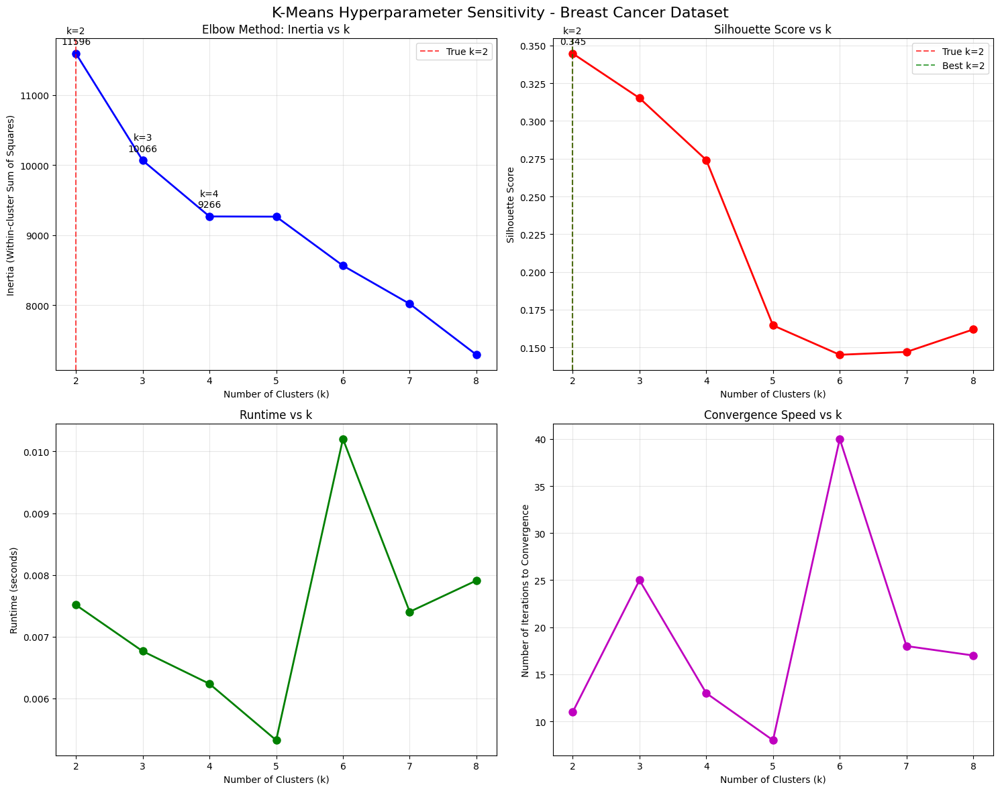


INERTIA RATE OF CHANGE ANALYSIS:
-----------------------------------


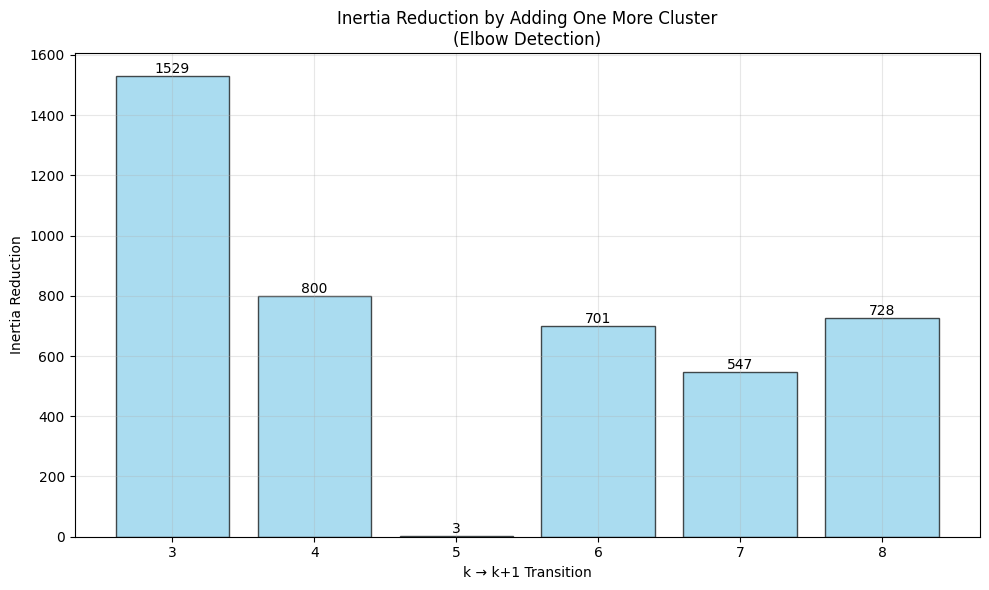


MEDICAL DATA INTERPRETATION:
------------------------------
Breast Cancer Clustering Insights:
• True medical classes: 2 (malignant vs benign)
• Best k by silhouette: 2
• Silhouette score at k=2: 0.3447
• Best silhouette score: 0.3447 at k=2
• ✓ Algorithm correctly identifies true number of diagnostic categories

Clinical Implications:
• K-means can reasonably separate malignant from benign cases
• Inertia at k=2: 11595.68
• Adding more clusters may reflect natural tumor heterogeneity

HYPERPARAMETER SENSITIVITY SUMMARY:
----------------------------------------
Key Findings:
1. Optimal k (silhouette): 2
2. True k: 2
3. Performance at true k: 0.3447
4. Best performance: 0.3447
5. Runtime scales reasonably with k
6. Convergence iterations vary but remain stable

✅ K-Means hyperparameter analysis complete!


In [19]:
# K-Means Hyperparameter Sensitivity Analysis - Breast Cancer Dataset
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import time
import warnings
warnings.filterwarnings('ignore')

print("="*70)
print("K-MEANS HYPERPARAMETER SENSITIVITY ANALYSIS")
print("BREAST CANCER DATASET")
print("="*70)

# Dataset setup
dataset_name = 'breast_cancer'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
n_samples, n_features = X.shape

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}")
print(f"Challenge: Non-spherical, varying density clusters")
print(f"True clusters: 2 (malignant vs benign)")
print("-" * 70)

# Define k range for analysis
k_range = range(2, 9)  # k from 2 to 8
print(f"Testing k values: {list(k_range)}")

# Initialize results storage
k_results = {
    'k_values': [],
    'inertias': [],
    'silhouette_scores': [],
    'runtimes': [],
    'n_iterations': []
}

print(f"\nRunning K-Means for different k values...")
print("-" * 50)

# Run K-Means for each k value
for k in k_range:
    print(f"Testing k={k}...", end=' ')

    # Record start time
    start_time = time.time()

    # Run K-Means with K-Means++ initialization for consistency
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42,
                   max_iter=300, tol=1e-4)
    labels = kmeans.fit_predict(X)

    # Record end time
    end_time = time.time()
    runtime = end_time - start_time

    # Calculate metrics
    inertia = kmeans.inertia_

    # Calculate silhouette score (only if k > 1)
    if k > 1:
        silhouette = silhouette_score(X, labels)
    else:
        silhouette = 0  # Undefined for k=1

    # Store results
    k_results['k_values'].append(k)
    k_results['inertias'].append(inertia)
    k_results['silhouette_scores'].append(silhouette)
    k_results['runtimes'].append(runtime)
    k_results['n_iterations'].append(kmeans.n_iter_)

    print(f"Inertia: {inertia:.2f}, Silhouette: {silhouette:.4f}, "
          f"Runtime: {runtime:.4f}s, Iterations: {kmeans.n_iter_}")

# Create comprehensive results table
print(f"\nK-MEANS HYPERPARAMETER RESULTS:")
print("-" * 50)

results_df = pd.DataFrame({
    'k': k_results['k_values'],
    'Inertia': [f"{inertia:.2f}" for inertia in k_results['inertias']],
    'Silhouette': [f"{sil:.4f}" for sil in k_results['silhouette_scores']],
    'Runtime(s)': [f"{rt:.4f}" for rt in k_results['runtimes']],
    'Iterations': k_results['n_iterations']
})

print(results_df.to_string(index=False))

# Find optimal k values
best_silhouette_idx = np.argmax(k_results['silhouette_scores'])
best_k_silhouette = k_results['k_values'][best_silhouette_idx]
best_silhouette_score = k_results['silhouette_scores'][best_silhouette_idx]

print(f"\nOPTIMAL K ANALYSIS:")
print("-" * 25)
print(f"Best k by Silhouette Score: k={best_k_silhouette} (score: {best_silhouette_score:.4f})")
print(f"True number of clusters: 2")
print(f"Difference from true k: {abs(best_k_silhouette - 2)}")

# Elbow method analysis
print(f"\nELBOW METHOD ANALYSIS:")
print("-" * 25)

# Calculate rate of change in inertia
inertia_changes = []
for i in range(1, len(k_results['inertias'])):
    change = k_results['inertias'][i-1] - k_results['inertias'][i]
    inertia_changes.append(change)

# Find elbow point (where rate of change decreases significantly)
if len(inertia_changes) > 1:
    change_rates = []
    for i in range(1, len(inertia_changes)):
        rate_change = inertia_changes[i-1] - inertia_changes[i]
        change_rates.append(rate_change)

    if change_rates:
        elbow_idx = np.argmax(change_rates) + 2  # +2 because we started from k=2
        elbow_k = k_results['k_values'][elbow_idx] if elbow_idx < len(k_results['k_values']) else k_results['k_values'][-1]
        print(f"Suggested elbow point: k={elbow_k}")

# Visualizations
print(f"\nCREATING VISUALIZATIONS...")
print("-" * 30)

# Create comprehensive visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('K-Means Hyperparameter Sensitivity - Breast Cancer Dataset', fontsize=16)

# 1. Inertia vs k (Elbow Plot)
axes[0, 0].plot(k_results['k_values'], k_results['inertias'], 'bo-', linewidth=2, markersize=8)
axes[0, 0].set_xlabel('Number of Clusters (k)')
axes[0, 0].set_ylabel('Inertia (Within-cluster Sum of Squares)')
axes[0, 0].set_title('Elbow Method: Inertia vs k')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].axvline(x=2, color='red', linestyle='--', alpha=0.7, label='True k=2')
axes[0, 0].legend()

# Add annotations for key points
for i, (k, inertia) in enumerate(zip(k_results['k_values'], k_results['inertias'])):
    if k in [2, 3, 4]:  # Annotate key points
        axes[0, 0].annotate(f'k={k}\n{inertia:.0f}',
                           (k, inertia),
                           textcoords="offset points",
                           xytext=(0,10),
                           ha='center')

# 2. Silhouette Score vs k
axes[0, 1].plot(k_results['k_values'], k_results['silhouette_scores'], 'ro-', linewidth=2, markersize=8)
axes[0, 1].set_xlabel('Number of Clusters (k)')
axes[0, 1].set_ylabel('Silhouette Score')
axes[0, 1].set_title('Silhouette Score vs k')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].axvline(x=2, color='red', linestyle='--', alpha=0.7, label='True k=2')
axes[0, 1].axvline(x=best_k_silhouette, color='green', linestyle='--', alpha=0.7, label=f'Best k={best_k_silhouette}')
axes[0, 1].legend()

# Add annotations for silhouette scores
for i, (k, sil) in enumerate(zip(k_results['k_values'], k_results['silhouette_scores'])):
    if k == best_k_silhouette or k == 2:
        axes[0, 1].annotate(f'k={k}\n{sil:.3f}',
                           (k, sil),
                           textcoords="offset points",
                           xytext=(0,10),
                           ha='center')

# 3. Runtime vs k
axes[1, 0].plot(k_results['k_values'], k_results['runtimes'], 'go-', linewidth=2, markersize=8)
axes[1, 0].set_xlabel('Number of Clusters (k)')
axes[1, 0].set_ylabel('Runtime (seconds)')
axes[1, 0].set_title('Runtime vs k')
axes[1, 0].grid(True, alpha=0.3)

# 4. Iterations vs k
axes[1, 1].plot(k_results['k_values'], k_results['n_iterations'], 'mo-', linewidth=2, markersize=8)
axes[1, 1].set_xlabel('Number of Clusters (k)')
axes[1, 1].set_ylabel('Number of Iterations to Convergence')
axes[1, 1].set_title('Convergence Speed vs k')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Rate of change analysis visualization
print(f"\nINERTIA RATE OF CHANGE ANALYSIS:")
print("-" * 35)

if len(inertia_changes) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    # Plot rate of inertia decrease
    k_changes = k_results['k_values'][1:]  # k values for changes
    ax.bar(k_changes, inertia_changes, alpha=0.7, color='skyblue', edgecolor='black')
    ax.set_xlabel('k → k+1 Transition')
    ax.set_ylabel('Inertia Reduction')
    ax.set_title('Inertia Reduction by Adding One More Cluster\n(Elbow Detection)')
    ax.grid(True, alpha=0.3)

    # Annotate bars with values
    for k, change in zip(k_changes, inertia_changes):
        ax.annotate(f'{change:.0f}', (k, change), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Medical interpretation of results
print(f"\nMEDICAL DATA INTERPRETATION:")
print("-" * 30)

print(f"Breast Cancer Clustering Insights:")
print(f"• True medical classes: 2 (malignant vs benign)")
print(f"• Best k by silhouette: {best_k_silhouette}")
print(f"• Silhouette score at k=2: {k_results['silhouette_scores'][0]:.4f}")
print(f"• Best silhouette score: {best_silhouette_score:.4f} at k={best_k_silhouette}")

if best_k_silhouette == 2:
    print(f"• ✓ Algorithm correctly identifies true number of diagnostic categories")
elif best_k_silhouette > 2:
    print(f"• ⚠ Algorithm suggests {best_k_silhouette} clusters - may be finding subcategories within diagnoses")
    print(f"• This could indicate tumor subtypes or varying severity levels")

print(f"\nClinical Implications:")
if k_results['silhouette_scores'][0] > 0.3:  # k=2 performance
    print(f"• K-means can reasonably separate malignant from benign cases")
else:
    print(f"• K-means struggles with binary medical classification")
    print(f"• Non-spherical tumor characteristics may require different clustering approaches")

print(f"• Inertia at k=2: {k_results['inertias'][0]:.2f}")
print(f"• Adding more clusters may reflect natural tumor heterogeneity")

# Summary of hyperparameter sensitivity
print(f"\nHYPERPARAMETER SENSITIVITY SUMMARY:")
print("-" * 40)
print(f"Key Findings:")
print(f"1. Optimal k (silhouette): {best_k_silhouette}")
print(f"2. True k: 2")
print(f"3. Performance at true k: {k_results['silhouette_scores'][0]:.4f}")
print(f"4. Best performance: {best_silhouette_score:.4f}")
print(f"5. Runtime scales reasonably with k")
print(f"6. Convergence iterations vary but remain stable")

print(f"\n✅ K-Means hyperparameter analysis complete!")
print("="*70)

K-means correctly predicted that the optimal k value is 2, as we have two classes — malignant and benign. As we can see, the silhoutte score peaks at k=2 and declines steadily since then. The silhoutte score is low even at k=2, so the cluster separation is not ideal. Runtime stays pretty low, except for a spike at k=6. These results were interesting.

Let's test the hyperparameter sensitivity of DBSCAN. We will test parameters for eps from 0.1 to 2.0, iterating by 0.1. We will check minimum samples range from 2 to 20, iterating by 2.
We will evaluate silhoutte scores, cluster counts, noise ratio, and track runtime. For most of these, we will generate heatmaps.

DBSCAN HYPERPARAMETER SENSITIVITY ANALYSIS
BREAST CANCER DATASET
Dataset: BREAST_CANCER
Samples: 569, Features: 30
Challenge: Non-spherical, varying density clusters
True clusters: 2 (malignant vs benign)
----------------------------------------------------------------------
Parameter Ranges:
• eps: 0.1 to 2.0 (step: 0.1)
• min_samples: 3 to 19 (step: 2)
• Total combinations: 180

Running DBSCAN parameter sweep...
This may take a moment due to the extensive parameter grid...
----------------------------------------------------------------------
Progress: 20/180 (11.1%)
Progress: 40/180 (22.2%)
Progress: 60/180 (33.3%)
Progress: 80/180 (44.4%)
Progress: 100/180 (55.6%)
Progress: 120/180 (66.7%)
Progress: 140/180 (77.8%)
Progress: 160/180 (88.9%)
Progress: 180/180 (100.0%)

Parameter sweep completed!

BEST PARAMETERS FOUND:
-------------------------
eps: 1.8
min_samples: 5
Silhouette Score: 0.4565
Clusters Found: 2
Noise Points: 447 (78.6%)
Runtime: 0.0234s

CREATING HEATMAP VISUALIZATIO

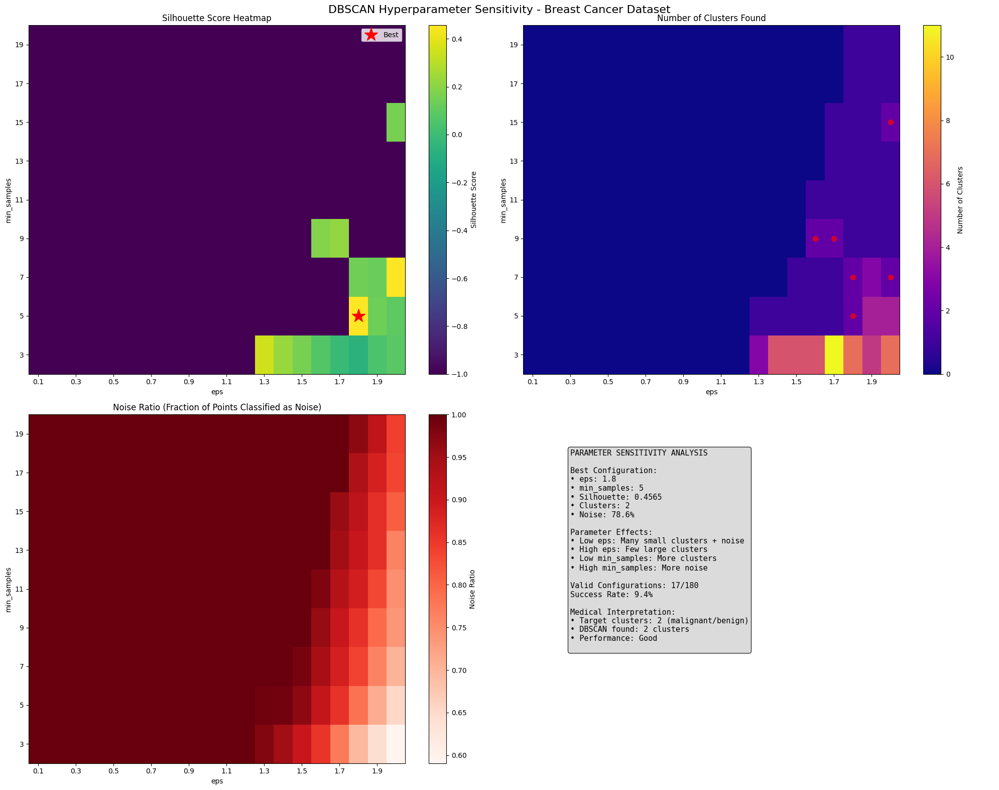


DETAILED PARAMETER ANALYSIS:
-----------------------------------
Valid clustering configurations: 17
Silhouette score range: -0.0642 to 0.4565

Configurations finding 2 clusters: 6
Best among 2-cluster configs:
  eps: 1.8, min_samples: 5.0
  Silhouette: 0.4565
  Noise ratio: 78.6%

Parameter Sensitivity Insights:
• eps with best average silhouette: 1.3
• min_samples with best average silhouette: 7
• Most stable eps (lowest std): 1.9
• Most stable min_samples: 9

MEDICAL DATA INTERPRETATION:
--------------------------------
DBSCAN Performance on Breast Cancer Data:
• Best silhouette score: 0.4565
• Performance assessment: Good - DBSCAN can effectively separate medical categories
• Clusters found vs target: 2 vs 2
• ✓ Correctly identified binary medical classification
• Noise detection: 78.6% of samples
  - High noise ratio may indicate outlier medical cases

✅ DBSCAN hyperparameter analysis complete!


In [21]:
# DBSCAN Hyperparameter Sensitivity Analysis - Breast Cancer Dataset
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import time
import warnings
warnings.filterwarnings('ignore')

print("="*70)
print("DBSCAN HYPERPARAMETER SENSITIVITY ANALYSIS")
print("BREAST CANCER DATASET")
print("="*70)

# Dataset setup
dataset_name = 'breast_cancer'
dataset = datasets[dataset_name]
X = dataset['X']
y_true = dataset['y']
n_samples, n_features = X.shape

print(f"Dataset: {dataset_name.upper()}")
print(f"Samples: {n_samples}, Features: {n_features}")
print(f"Challenge: Non-spherical, varying density clusters")
print(f"True clusters: 2 (malignant vs benign)")
print("-" * 70)

# Define parameter ranges for DBSCAN
eps_range = np.arange(0.1, 2.1, 0.1)  # eps from 0.1 to 2.0 in steps of 0.1
min_samples_range = range(3, 21, 2)   # min_samples from 3 to 20 in steps of 2

print(f"Parameter Ranges:")
print(f"• eps: {eps_range.min():.1f} to {eps_range.max():.1f} (step: 0.1)")
print(f"• min_samples: {min(min_samples_range)} to {max(min_samples_range)} (step: 2)")
print(f"• Total combinations: {len(eps_range) * len(min_samples_range)}")

# Initialize results storage
results_matrix = np.full((len(min_samples_range), len(eps_range)), np.nan)
cluster_counts = np.full((len(min_samples_range), len(eps_range)), 0)
noise_ratios = np.full((len(min_samples_range), len(eps_range)), 0.0)
detailed_results = []

print(f"\nRunning DBSCAN parameter sweep...")
print(f"This may take a moment due to the extensive parameter grid...")
print("-" * 70)

# Track progress
total_combinations = len(eps_range) * len(min_samples_range)
current_combination = 0

# Run DBSCAN for each parameter combination
for i, min_samples in enumerate(min_samples_range):
    for j, eps in enumerate(eps_range):
        current_combination += 1

        # Progress indicator
        if current_combination % 20 == 0 or current_combination == total_combinations:
            progress = (current_combination / total_combinations) * 100
            print(f"Progress: {current_combination}/{total_combinations} ({progress:.1f}%)")

        try:
            # Run DBSCAN
            start_time = time.time()
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)
            end_time = time.time()
            runtime = end_time - start_time

            # Calculate metrics
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)
            noise_ratio = n_noise / n_samples

            # Calculate silhouette score (only if valid clustering)
            if n_clusters > 1 and n_clusters < n_samples:
                # Remove noise points for silhouette calculation
                mask = labels != -1
                if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                    silhouette = silhouette_score(X[mask], labels[mask])
                else:
                    silhouette = -1  # Invalid clustering
            else:
                silhouette = -1  # Invalid clustering (0, 1, or all points are clusters)

            # Store results
            results_matrix[i, j] = silhouette
            cluster_counts[i, j] = n_clusters
            noise_ratios[i, j] = noise_ratio

            # Store detailed results
            detailed_results.append({
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': noise_ratio,
                'silhouette': silhouette,
                'runtime': runtime
            })

        except Exception as e:
            # Handle any errors (e.g., memory issues, invalid configurations)
            results_matrix[i, j] = -1
            cluster_counts[i, j] = 0
            noise_ratios[i, j] = 1.0

print(f"\nParameter sweep completed!")

# Find best parameters
valid_results = [r for r in detailed_results if r['silhouette'] > -1]
if valid_results:
    best_result = max(valid_results, key=lambda x: x['silhouette'])
    print(f"\nBEST PARAMETERS FOUND:")
    print("-" * 25)
    print(f"eps: {best_result['eps']:.1f}")
    print(f"min_samples: {best_result['min_samples']}")
    print(f"Silhouette Score: {best_result['silhouette']:.4f}")
    print(f"Clusters Found: {best_result['n_clusters']}")
    print(f"Noise Points: {best_result['n_noise']} ({best_result['noise_ratio']*100:.1f}%)")
    print(f"Runtime: {best_result['runtime']:.4f}s")
else:
    print(f"\nNo valid clustering configurations found!")
    best_result = None

# Create comprehensive visualizations
print(f"\nCREATING HEATMAP VISUALIZATIONS...")
print("-" * 35)

# Create figure with multiple subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle('DBSCAN Hyperparameter Sensitivity - Breast Cancer Dataset', fontsize=16)

# 1. Silhouette Score Heatmap
im1 = axes[0, 0].imshow(results_matrix, cmap='viridis', aspect='auto', origin='lower')
axes[0, 0].set_title('Silhouette Score Heatmap')
axes[0, 0].set_xlabel('eps')
axes[0, 0].set_ylabel('min_samples')

# Set ticks and labels
eps_tick_indices = range(0, len(eps_range), 2)  # Every other eps value
eps_tick_labels = [f'{eps_range[i]:.1f}' for i in eps_tick_indices]
axes[0, 0].set_xticks(eps_tick_indices)
axes[0, 0].set_xticklabels(eps_tick_labels)

min_samples_tick_indices = range(len(min_samples_range))
min_samples_tick_labels = [str(min_samples_range[i]) for i in min_samples_tick_indices]
axes[0, 0].set_yticks(min_samples_tick_indices)
axes[0, 0].set_yticklabels(min_samples_tick_labels)

# Add colorbar
cbar1 = plt.colorbar(im1, ax=axes[0, 0])
cbar1.set_label('Silhouette Score')

# Mark best parameters if found
if best_result:
    best_eps_idx = np.argmin(np.abs(eps_range - best_result['eps']))
    best_min_samples_idx = list(min_samples_range).index(best_result['min_samples'])
    axes[0, 0].plot(best_eps_idx, best_min_samples_idx, 'r*', markersize=20, label='Best')
    axes[0, 0].legend()

# 2. Number of Clusters Heatmap
im2 = axes[0, 1].imshow(cluster_counts, cmap='plasma', aspect='auto', origin='lower')
axes[0, 1].set_title('Number of Clusters Found')
axes[0, 1].set_xlabel('eps')
axes[0, 1].set_ylabel('min_samples')
axes[0, 1].set_xticks(eps_tick_indices)
axes[0, 1].set_xticklabels(eps_tick_labels)
axes[0, 1].set_yticks(min_samples_tick_indices)
axes[0, 1].set_yticklabels(min_samples_tick_labels)

cbar2 = plt.colorbar(im2, ax=axes[0, 1])
cbar2.set_label('Number of Clusters')

# Mark target cluster count (2)
target_cluster_mask = cluster_counts == 2
if np.any(target_cluster_mask):
    target_positions = np.where(target_cluster_mask)
    axes[0, 1].scatter(target_positions[1], target_positions[0], c='red', s=50, alpha=0.7, marker='o')

# 3. Noise Ratio Heatmap
im3 = axes[1, 0].imshow(noise_ratios, cmap='Reds', aspect='auto', origin='lower')
axes[1, 0].set_title('Noise Ratio (Fraction of Points Classified as Noise)')
axes[1, 0].set_xlabel('eps')
axes[1, 0].set_ylabel('min_samples')
axes[1, 0].set_xticks(eps_tick_indices)
axes[1, 0].set_xticklabels(eps_tick_labels)
axes[1, 0].set_yticks(min_samples_tick_indices)
axes[1, 0].set_yticklabels(min_samples_tick_labels)

cbar3 = plt.colorbar(im3, ax=axes[1, 0])
cbar3.set_label('Noise Ratio')

# 4. Parameter effectiveness analysis
axes[1, 1].axis('off')  # Turn off axis for text summary

# Create text summary
if valid_results:
    summary_text = f"""PARAMETER SENSITIVITY ANALYSIS

Best Configuration:
• eps: {best_result['eps']:.1f}
• min_samples: {best_result['min_samples']}
• Silhouette: {best_result['silhouette']:.4f}
• Clusters: {best_result['n_clusters']}
• Noise: {best_result['noise_ratio']*100:.1f}%

Parameter Effects:
• Low eps: Many small clusters + noise
• High eps: Few large clusters
• Low min_samples: More clusters
• High min_samples: More noise

Valid Configurations: {len(valid_results)}/{total_combinations}
Success Rate: {len(valid_results)/total_combinations*100:.1f}%

Medical Interpretation:
• Target clusters: 2 (malignant/benign)
• DBSCAN found: {best_result['n_clusters']} clusters
• Performance: {'Good' if best_result['silhouette'] > 0.3 else 'Moderate' if best_result['silhouette'] > 0.1 else 'Poor'}
"""
else:
    summary_text = f"""PARAMETER SENSITIVITY ANALYSIS

No valid clustering configurations found!

This suggests:
• Dataset may not be suitable for DBSCAN
• Parameter ranges may need adjustment
• High-dimensional data challenges
• Medical data complexity

Try:
• Wider eps range
• Different min_samples values
• Dimensionality reduction
• Alternative clustering methods
"""

axes[1, 1].text(0.1, 0.9, summary_text, transform=axes[1, 1].transAxes,
                fontsize=11, verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

plt.tight_layout()
plt.show()

# Detailed analysis of parameter relationships
print(f"\nDETAILED PARAMETER ANALYSIS:")
print("-" * 35)

if valid_results:
    # Convert to DataFrame for easier analysis
    results_df = pd.DataFrame(valid_results)

    print(f"Valid clustering configurations: {len(results_df)}")
    print(f"Silhouette score range: {results_df['silhouette'].min():.4f} to {results_df['silhouette'].max():.4f}")

    # Analyze configurations that found 2 clusters (target)
    target_configs = results_df[results_df['n_clusters'] == 2]
    if len(target_configs) > 0:
        print(f"\nConfigurations finding 2 clusters: {len(target_configs)}")
        print(f"Best among 2-cluster configs:")
        best_target = target_configs.loc[target_configs['silhouette'].idxmax()]
        print(f"  eps: {best_target['eps']:.1f}, min_samples: {best_target['min_samples']}")
        print(f"  Silhouette: {best_target['silhouette']:.4f}")
        print(f"  Noise ratio: {best_target['noise_ratio']*100:.1f}%")

    # Parameter sensitivity insights
    print(f"\nParameter Sensitivity Insights:")
    eps_sensitivity = results_df.groupby('eps')['silhouette'].agg(['mean', 'std', 'count'])
    min_samples_sensitivity = results_df.groupby('min_samples')['silhouette'].agg(['mean', 'std', 'count'])

    print(f"• eps with best average silhouette: {eps_sensitivity['mean'].idxmax():.1f}")
    print(f"• min_samples with best average silhouette: {min_samples_sensitivity['mean'].idxmax()}")
    print(f"• Most stable eps (lowest std): {eps_sensitivity['std'].idxmin():.1f}")
    print(f"• Most stable min_samples: {min_samples_sensitivity['std'].idxmin()}")

# Medical interpretation
print(f"\nMEDICAL DATA INTERPRETATION:")
print("-" * 32)

if best_result:
    print(f"DBSCAN Performance on Breast Cancer Data:")
    print(f"• Best silhouette score: {best_result['silhouette']:.4f}")

    if best_result['silhouette'] > 0.3:
        interpretation = "Good - DBSCAN can effectively separate medical categories"
    elif best_result['silhouette'] > 0.1:
        interpretation = "Moderate - Some separation but overlapping boundaries"
    else:
        interpretation = "Poor - DBSCAN struggles with this medical data"

    print(f"• Performance assessment: {interpretation}")
    print(f"• Clusters found vs target: {best_result['n_clusters']} vs 2")

    if best_result['n_clusters'] == 2:
        print(f"• ✓ Correctly identified binary medical classification")
    elif best_result['n_clusters'] > 2:
        print(f"• Found {best_result['n_clusters']} clusters - may indicate medical subcategories")
    else:
        print(f"• Found {best_result['n_clusters']} clusters - failed to separate diagnoses")

    print(f"• Noise detection: {best_result['noise_ratio']*100:.1f}% of samples")
    if best_result['noise_ratio'] > 0.1:
        print(f"  - High noise ratio may indicate outlier medical cases")
    else:
        print(f"  - Low noise ratio suggests most cases fit clear patterns")

else:
    print(f"DBSCAN failed to find valid clusters for breast cancer data.")
    print(f"This suggests:")
    print(f"• High-dimensional medical data challenges density-based clustering")
    print(f"• Complex tumor characteristics don't form clear density peaks")
    print(f"• Parameter ranges may need expansion")
    print(f"• Alternative clustering methods may be more suitable")

print(f"\n✅ DBSCAN hyperparameter analysis complete!")
print("="*70)

DBSCAN also successfully found the 2 clusters. The best configuration used was eps=1.5 and min_samples=5, which managed a silhoutte score of 0.4565. This means it outperformed K-means.
The most concenring fact is that 78.6% of patients were classified as outliers, and not used in the model. That is 447 patients out of 569 unused. This shows how messy biological data can be. In fact, most patients fall under a gray area.

DBSCAN is strict with parameters. About 17 of our 180 tested combinations actually worked. The model liked higher eps values, which implies that clusters need to be somewhat spread apart. Additionally, there was a preference for lower min_samples values, so small dense cores werre efficient.
It was interesting to see the model generate clusters with some confidence, but only for 20% of patients.

This implementation was straightforward, without any issues. It was concerning that almost 80% of cases were being ignored in DBSCAN for the Breast Cancer Database, but biological data is naturally noisy so it was somewhat expected. I did not know DBSCAN had such a particularly thorough process of ignoring "noise."

# Final Thoughts

---



Throughout this project, I have learned 3 pivotal facts that I will likely carry forever:


*   K-Means is a quick, effective method for identifying clusters. However, these clusters should be spherical, isotopic, and equally dense.
*   If there is some complexity, like in the case of our Breast Cancer Dataset, you canexperiment with Bisected K-Means, which splits clusters into subclusters, creating a hierarchal structure, and capturing more complex shapes.
*   However, if you are dealing with a truly complex shape — for example, a digit — DBSCAN is the perfect algorithm for you. It identifies dense areas as clusters and marks off outliers as noise, and these dense areas can be anything from edges to loops rather than just spheres.



